# Zomato Restaurant Project


## Problem Statement:

Zomato Data Analysis is one of the most useful analysis for foodies who want to taste the best
cuisines of every part of the world which lies in their budget. This analysis is also for those who
want to find the value for money restaurants in various parts of the country for the cuisines.
Additionally, this analysis caters the needs of people who are striving to get the best cuisine of
the country and which locality of that country serves that cuisines with maximum number of
restaurants.

## Data Storage:

This problem statement contains two datasets- Zomato.csv and country_code.csv.

### Country_code.csv contains two variables:

####  Country code
####  Country name

The collected data has been stored in the Comma Separated Value file Zomato.csv. Each
restaurant in the dataset is uniquely identified by its Restaurant Id. Every Restaurant contains the
following variables:
    
### • Restaurant Id: Unique id of every restaurant across various cities of the world

### • Restaurant Name: Name of the restaurant

### • Country Code: Country in which restaurant is located

### • City: City in which restaurant is located

### • Address: Address of the restaurant

### • Locality: Location in the city

### • Locality Verbose: Detailed description of the locality

### • Longitude: Longitude coordinate of the restaurant&#39;s location

### • Latitude: Latitude coordinate of the restaurant&#39;s location

### • Cuisines: Cuisines offered by the restaurant

### • Average Cost for two: Cost for two people in different currencies ��

### • Currency: Currency of the country

### • Has Table booking: yes/no

### • Has Online delivery: yes/ no

### • Is delivering: yes/ no

### • Switch to order menu: yes/no

### • Price range: range of price of food

### • Aggregate Rating: Average rating out of 5

### • Rating color: depending upon the average rating color

### • Rating text: text on the basis of rating of rating

### • Votes: Number of ratings casted by people



## Problem statement : In this dataset predict 2 things –

1) Average Cost for two

2) Price range

In [1]:
# Importing the necessary libraries
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
# SETTING A customized plot style,font, figure and color
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = (10,7)
plt.rcParams['figure.facecolor'] = '#FFE554'

In [3]:
# loading the data
zomato = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset4/main/zomato.csv',encoding='ISO-8859-1')
# importing data from github directly

# This csv file has encoding ISO-8859-1. 
# Encoding defines what kind of characters(ASCII or non ASCII or something different) can be stored in a file.

In [4]:
zomato.shape

# We have 9551 rows and 21 columns

(9551, 21)

In [5]:
# Inorder to view all the columns while printing we are setting an option to display the maximum columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [6]:
# looking at the first 10 rows
zomato.head(10)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,1000,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",6000,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


In [7]:
# loading another dataset called country code
country_code = pd.read_excel('Country_Code.xlsx')

In [8]:
# checking the shape
country_code.shape

(15, 2)

In [9]:
country_code

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


In [10]:
# Now we will merge zomato and country_code dataframe on country on Country Code column
zom = pd.merge(zomato,country_code,on="Country Code")

In [11]:
# looking at the first 10 rows
zom.head(10)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,1000,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336,Phillipines
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520,Phillipines
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677,Phillipines
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",6000,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621,Phillipines
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532,Phillipines


In [12]:
# looking at the last 10 rows
zom.tail(20)

# We can observe that address and localities are not in english for some rows 

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
9531,6000747,The Bigos,208,Ankara,"Mahallesi, Selanik 2 Caddesi, No 61/A, íankay...",KÛ±zÛ±lay,"KÛ±zÛ±lay, Ankara",32.857917,39.916686,Cafe,80,Turkish Lira(TL),No,No,No,No,3,3.8,Yellow,Good,123,Turkey
9532,6002025,MasabaôÛ±,208,Ankara,"Kocatepe Mahallesi, Mithatpaôa Caddesi, No 62...",KÛ±zÛ±lay,"KÛ±zÛ±lay, Ankara",32.859867,39.919144,"Kebab, Turkish Pizza",100,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,103,Turkey
9533,6003879,Zigana Pide,208,Ankara,"Macun Mahallesi, Erciyes ÛÁôyerleri Sitesi, 2...",Macunkí_y,"Macunkí_y, Ankara",32.763378,39.946278,Turkish Pizza,50,Turkish Lira(TL),No,No,No,No,2,4.3,Green,Very Good,103,Turkey
9534,6004089,Dí_veroÛôlu,208,Ankara,"Maltepe Mahallesi, Gení_lik Caddesi, No 28, í...",Maltepe,"Maltepe, Ankara",32.842742,39.922536,"Kebab, Desserts, Turkish Pizza",70,Turkish Lira(TL),No,No,No,No,3,4.4,Green,Very Good,131,Turkey
9535,6000921,Dí_veroÛôlu,208,Ankara,"íìmitkí_y Mahallesi, 2432. Cadde (8. Cadde), N...",íìmitkí_y,"íìmitkí_y, Ankara",32.701775,39.891564,"Kebab, Desserts, Turkish Pizza",70,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,152,Turkey
9536,6004813,Pizza ÛÁl Forno,208,Ankara,"YÛ±ldÛ±zevler Mahallesi, 720. Sokak, No 2/B, í...",YÛ±ldÛ±zevler,"YÛ±ldÛ±zevler, Ankara",32.860217,39.876239,Pizza,40,Turkish Lira(TL),No,No,No,No,2,4.7,Dark Green,Excellent,104,Turkey
9537,5904116,J'adore Chocolatier,208,ÛÁstanbul,"AsmalÛ±mescit Mahallesi, ÛÁstiklal Caddesi, Em...",AsmalÛ±mescit,"AsmalÛ±mescit, ÛÁstanbul",28.976127,41.033002,Desserts,50,Turkish Lira(TL),No,No,No,No,2,4.7,Dark Green,Excellent,1311,Turkey
9538,5901782,Starbucks,208,ÛÁstanbul,"Bebek Mahallesi, Cevdetpaôa Caddesi, No 30/A,...",Bebek,"Bebek, ÛÁstanbul",29.043734,41.077696,Cafe,30,Turkish Lira(TL),No,No,No,No,2,4.9,Dark Green,Excellent,1042,Turkey
9539,5902117,Valonia,208,ÛÁstanbul,"Tí_rkali Mahallesi, Ihlamurdere Caddesi, No 40...",Beôiktaô Merkez,"Beôiktaô Merkez, ÛÁstanbul",29.002896,41.044813,"Restaurant Cafe, Desserts",80,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,874,Turkey
9540,5927248,Draft Gastro Pub,208,ÛÁstanbul,"Caddebostan Mahallesi, BaÛôdat Caddesi, No 349...",Caddebostan,"Caddebostan, ÛÁstanbul",29.074116,40.963935,Bar Food,130,Turkish Lira(TL),No,No,No,No,4,4.9,Dark Green,Excellent,522,Turkey


In [13]:
# looking at random 10 rows
zom.sample(10)

# Now we can see there is data about india as well.

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
4593,2411,Tempting Restaurant,1,New Delhi,"5/4, WEA, Near Hotel Rahul Place, Karol Bagh, ...",Karol Bagh,"Karol Bagh, New Delhi",77.188640,28.647094,"Chinese, Mughlai, North Indian",750,Indian Rupees(Rs.),Yes,Yes,No,No,2,2.7,Orange,Average,68,India
7583,18372314,Dee Pizza Hub,1,New Delhi,"WZ-139/F, Main Market, New Mahavir Nagar, Tila...",Tilak Nagar,"Tilak Nagar, New Delhi",77.084592,28.634462,Pizza,350,Indian Rupees(Rs.),No,No,No,No,1,0.0,White,Not rated,1,India
1611,18311926,Punjabi Dhani,1,Gurgaon,"220/11, Near Aryan Hospital, Old Railway Road,...",Old Railway Road,"Old Railway Road, Gurgaon",77.019364,28.470213,North Indian,700,Indian Rupees(Rs.),No,No,No,No,2,3.2,Orange,Average,25,India
9281,18425821,OJJU,94,Jakarta,"Gandaria City, Lantai Upper Ground, Jl. Sultan...","Gandaria City Mall, Gandaria","Gandaria City Mall, Gandaria, Jakarta",106.783162,-6.244221,Korean,200000,Indonesian Rupiah(IDR),No,No,No,No,3,3.9,Yellow,Good,137,Indonesia
1019,18380284,The Dark Hour - Kitchen,1,Faridabad,"Block 7, Spring Fields Colony, Sector 31, Fari...",Sector 31,"Sector 31, Faridabad",0.000000,0.000000,Italian,350,Indian Rupees(Rs.),No,No,No,No,1,0.0,White,Not rated,1,India
5154,18233599,The Chocolate Room,1,New Delhi,"B-6, Ground Floor, Shivalik, Malviya Nagar, Ne...",Malviya Nagar,"Malviya Nagar, New Delhi",77.206335,28.533527,"Cafe, Italian, Mexican, Salad, Desserts",850,Indian Rupees(Rs.),Yes,Yes,No,No,2,3.4,Orange,Average,155,India
3300,307106,Red Chillies,1,New Delhi,"Shop 2, 2507, Hudson Lane, Kingsway Camp, Delh...",Delhi University-GTB Nagar,"Delhi University-GTB Nagar, New Delhi",77.204188,28.696106,Fast Food,250,Indian Rupees(Rs.),No,No,No,No,1,3.3,Orange,Average,69,India
5779,311385,Sandoz,1,New Delhi,"C-159, Naraina Industrial Area, Naraina, New D...",Naraina,"Naraina, New Delhi",77.137163,28.629115,"Chinese, North Indian",600,Indian Rupees(Rs.),No,Yes,No,No,2,2.6,Orange,Average,32,India
197,17330155,Deorio's,216,Columbus,"3201 Macon Rd Ste 167, Columbus, GA 31906",Columbus,"Columbus, Columbus",-84.942700,32.481000,"Italian, Pizza",0,Dollar($),No,No,No,No,1,4.0,Green,Very Good,170,United States
4722,306168,Bawa Chicken,1,New Delhi,"42, DLF Industrial Area, Kirti Nagar, New Delhi",Kirti Nagar,"Kirti Nagar, New Delhi",77.142852,28.655266,"North Indian, Mughlai, Chinese",650,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,98,India


In [14]:
# looking at the data info
zom.info()

# There seems to be no null values in the data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [15]:
# description of the data
zom.describe().T

# We can see that the description of continuous features in irrational numbers
# The Standard Deviation is very high on 'Average Cost for two'. It is for different countries having different currency.
# There are 15 countries in this dataset and their currencies are not standardized.
# Look at the maximum of average price for two : 800000.

,count,mean,std,min,25%,50%,75%,max
Restaurant ID,9551.0,9.051128e+06,8.791521e+06,53.000000,301962.500000,6.004089e+06,1.835229e+07,1.850065e+07
Country Code,9551.0,1.836562e+01,5.675055e+01,1.000000,1.000000,1.000000e+00,1.000000e+00,2.160000e+02
Longitude,9551.0,6.412657e+01,4.146706e+01,-157.948486,77.081343,7.719196e+01,7.728201e+01,1.748321e+02
Latitude,9551.0,2.585438e+01,1.100794e+01,-41.330428,28.478713,2.857047e+01,2.864276e+01,5.597698e+01
Average Cost for two,9551.0,1.199211e+03,1.612118e+04,0.000000,250.000000,4.000000e+02,7.000000e+02,8.000000e+05
Price range,9551.0,1.804837e+00,9.056088e-01,1.000000,1.000000,2.000000e+00,2.000000e+00,4.000000e+00
Aggregate rating,9551.0,2.666370e+00,1.516378e+00,0.000000,2.500000,3.200000e+00,3.700000e+00,4.900000e+00
Votes,9551.0,1.569097e+02,4.301691e+02,0.000000,5.000000,3.100000e+01,1.310000e+02,1.093400e+04


In [16]:
# looking at the categorical data as well
zom.describe(include='O').T

# By this We can observe that all the high frequency categorical data is related to india.
# Similarly the city Delhi, address Sector 41, Noida most of these high frequency categories are related ro india

,count,unique,top,freq
Restaurant Name,9551,7446,Cafe Coffee Day,83
City,9551,141,New Delhi,5473
Address,9551,8918,"Sector 41, Noida",11
Locality,9551,1208,Connaught Place,122
Locality Verbose,9551,1265,"Connaught Place, New Delhi",122
Cuisines,9542,1825,North Indian,936
Currency,9551,12,Indian Rupees(Rs.),8652
Has Table booking,9551,2,No,8393
Has Online delivery,9551,2,No,7100
Is delivering now,9551,2,No,9517


In [17]:
# Checking Null values
zom.isnull().sum()

# We can observe that there are 9 null values in  Cuisines column

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

<AxesSubplot:>

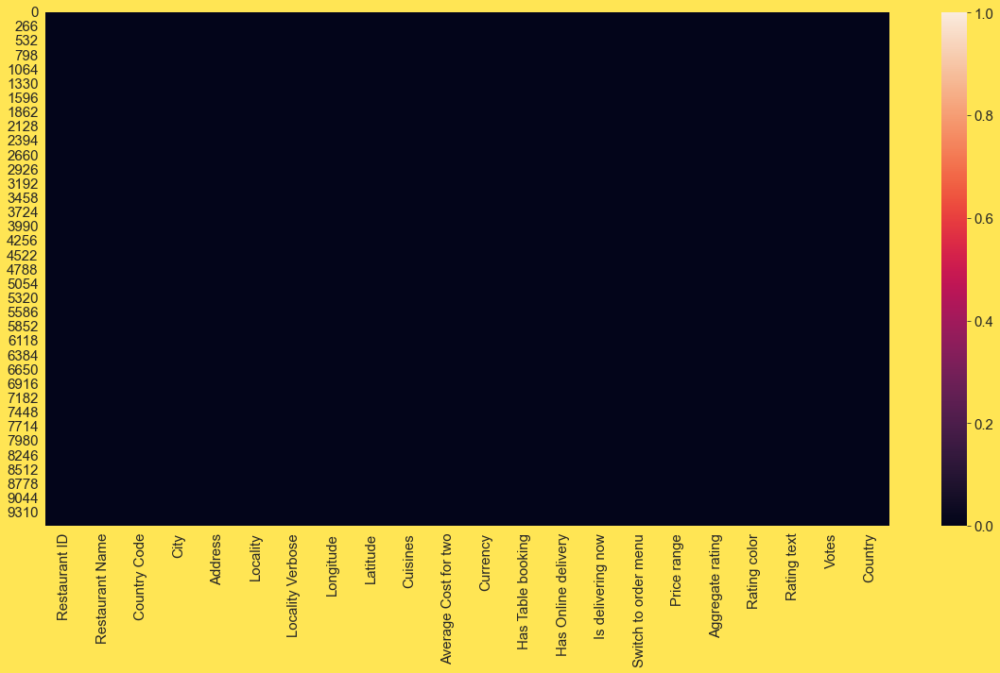

In [18]:
# plotting a heatmap
plt.figure(figsize=(20,10))
sns.heatmap(zom.isnull())

# Here we cannot see the missing values because they are a very few comparing with the total rows

In [19]:
# checking if any other column has blank values(' '),special characters(?,-,_) etc to make sure the data is clean

special_chars =[" ","?","-"," ?"," -","? ","- "," ? "," - ","NA","N/A"," NA"," N/A"] # making list of possible special characters 

for col in zom.columns:
    for char in special_chars:
        print(f"{char} in {col} = ",end= " ")
        print((zom[col] == char).sum())
        
# We can observe that there are no special characters in the data

  in Restaurant ID =  0
? in Restaurant ID =  0
- in Restaurant ID =  0
 ? in Restaurant ID =  0
 - in Restaurant ID =  0
?  in Restaurant ID =  0
-  in Restaurant ID =  0
 ?  in Restaurant ID =  0
 -  in Restaurant ID =  0
NA in Restaurant ID =  0
N/A in Restaurant ID =  0
 NA in Restaurant ID =  0
 N/A in Restaurant ID =  0
  in Restaurant Name =  0
? in Restaurant Name =  0
- in Restaurant Name =  0
 ? in Restaurant Name =  0
 - in Restaurant Name =  0
?  in Restaurant Name =  0
-  in Restaurant Name =  0
 ?  in Restaurant Name =  0
 -  in Restaurant Name =  0
NA in Restaurant Name =  0
N/A in Restaurant Name =  0
 NA in Restaurant Name =  0
 N/A in Restaurant Name =  0
  in Country Code =  0
? in Country Code =  0
- in Country Code =  0
 ? in Country Code =  0
 - in Country Code =  0
?  in Country Code =  0
-  in Country Code =  0
 ?  in Country Code =  0
 -  in Country Code =  0
NA in Country Code =  0
N/A in Country Code =  0
 NA in Country Code =  0
 N/A in Country Code =  0
  i

In [20]:
# let's impute the Cuisines column with its mode
zom['Cuisines'].mode()[0]

# 'North Indian' is the most frequent value in Cuisines

'North Indian'

In [21]:
# let's replace the nan values with mode
zom['Cuisines'] = zom['Cuisines'].fillna(zom['Cuisines'].mode()[0])

In [22]:
# Now let's recheck the null values again
zom.isnull().sum()

# Null values are dealt with.

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

In [23]:
# lookin at the unique values
zom.nunique()

Restaurant ID           9551
Restaurant Name         7446
Country Code              15
City                     141
Address                 8918
Locality                1208
Locality Verbose        1265
Longitude               8120
Latitude                8677
Cuisines                1825
Average Cost for two     140
Currency                  12
Has Table booking          2
Has Online delivery        2
Is delivering now          2
Switch to order menu       1
Price range                4
Aggregate rating          33
Rating color               6
Rating text                6
Votes                   1012
Country                   15
dtype: int64

In [24]:
# lets drop Restaurant Id as it is unique for every restaurant
zom.drop(['Restaurant ID'],axis=1,inplace=True)

In [25]:
# looking at the datatypesof the columns
zom.dtypes

Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
Country                  object
dtype: object

In [26]:
# Checking duplicates if any
# There are no duplicates in the data
duplicates = zom[zom.duplicated()]
duplicates

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country


## Univariate Analysis

In [27]:
# lets seperate the categorical variables
cat_cols = zom.dtypes[zom.dtypes == 'object'].index.tolist()
cat_cols

['Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'Country']

In [28]:
for i in cat_cols:
    print('Number of Unique Values in',i,'is ',zom[i].nunique())

Number of Unique Values in Restaurant Name is  7446
Number of Unique Values in City is  141
Number of Unique Values in Address is  8918
Number of Unique Values in Locality is  1208
Number of Unique Values in Locality Verbose is  1265
Number of Unique Values in Cuisines is  1825
Number of Unique Values in Currency is  12
Number of Unique Values in Has Table booking is  2
Number of Unique Values in Has Online delivery is  2
Number of Unique Values in Is delivering now is  2
Number of Unique Values in Switch to order menu is  1
Number of Unique Values in Rating color is  6
Number of Unique Values in Rating text is  6
Number of Unique Values in Country is  15


In [29]:
# Now let's remove the columns which are having Significantly high amount of categorical values and filter onlu the moderate ones.
cat_cols_less = [x for x in cat_cols if len(zom[x].unique()) <= 15]
cat_cols_less

['Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'Country']

Indian Rupees(Rs.)        8652
Dollar($)                  482
Pounds(£)                  80
Brazilian Real(R$)          60
Emirati Diram(AED)          60
Rand(R)                     60
NewZealand($)               40
Turkish Lira(TL)            34
Botswana Pula(P)            22
Indonesian Rupiah(IDR)      21
Qatari Rial(QR)             20
Sri Lankan Rupee(LKR)       20
Name: Currency, dtype: int64


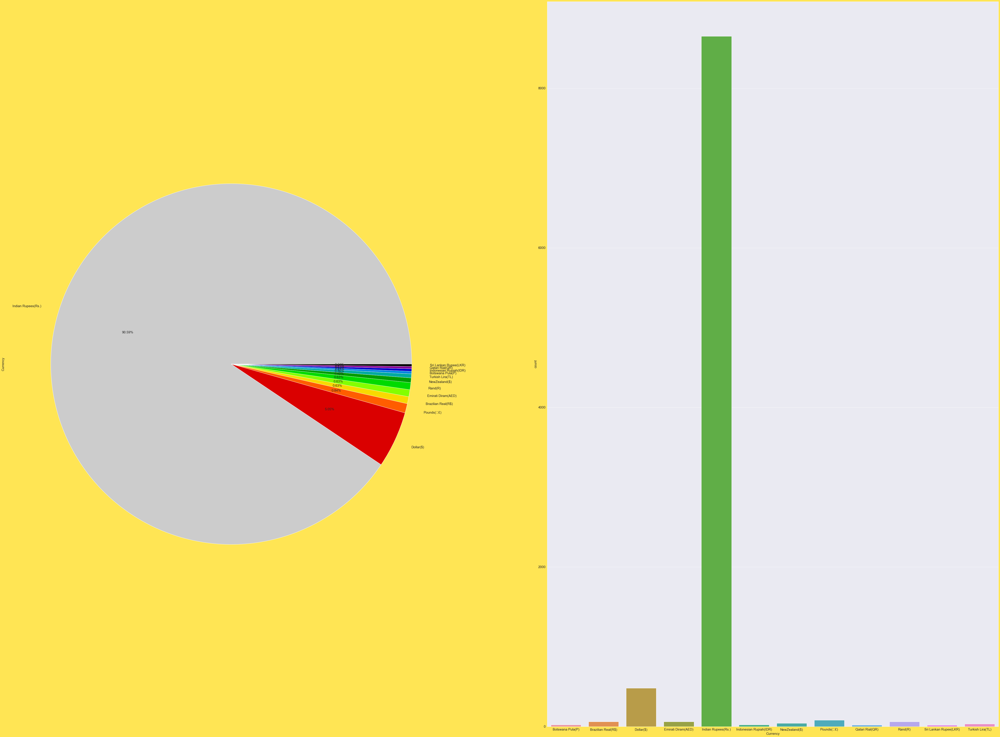

No     8393
Yes    1158
Name: Has Table booking, dtype: int64


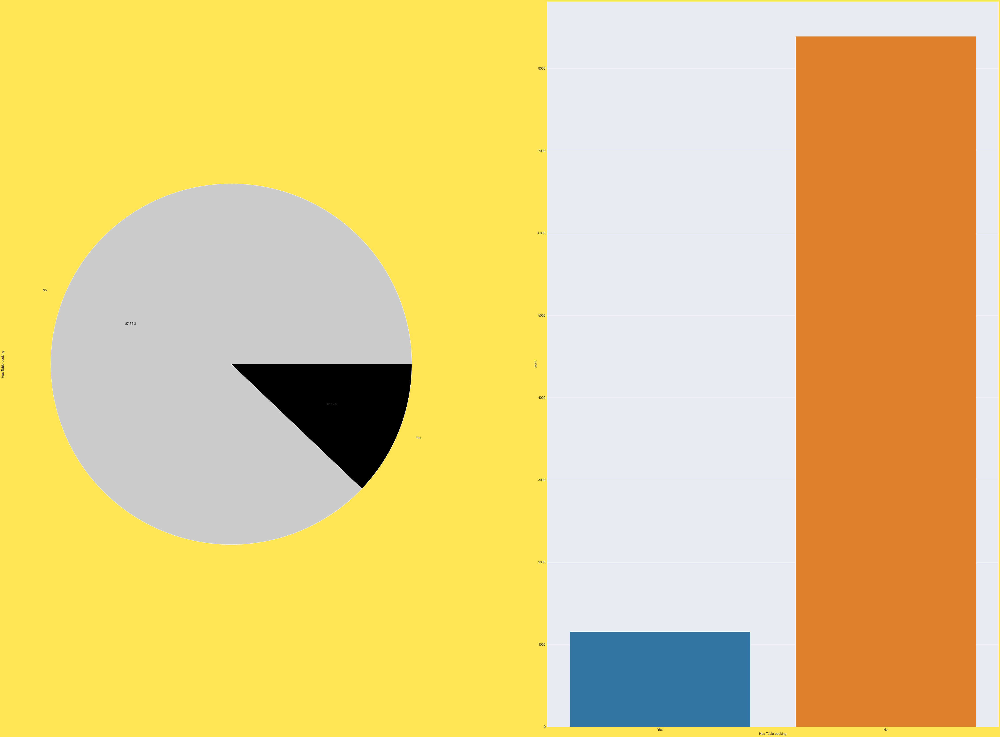

No     7100
Yes    2451
Name: Has Online delivery, dtype: int64


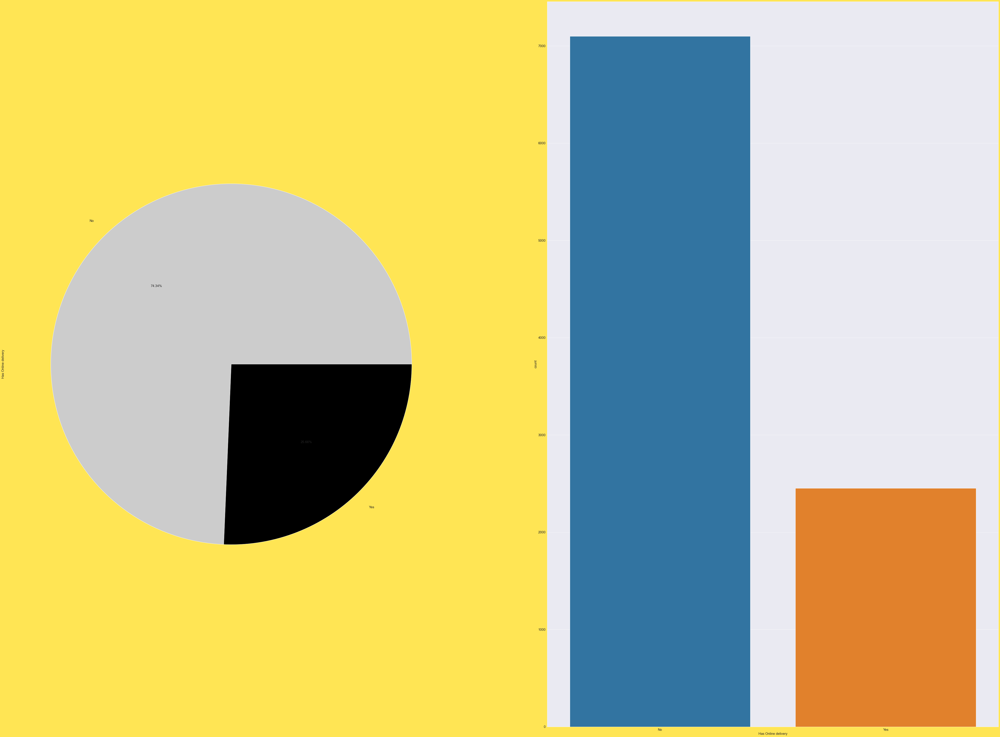

No     9517
Yes      34
Name: Is delivering now, dtype: int64


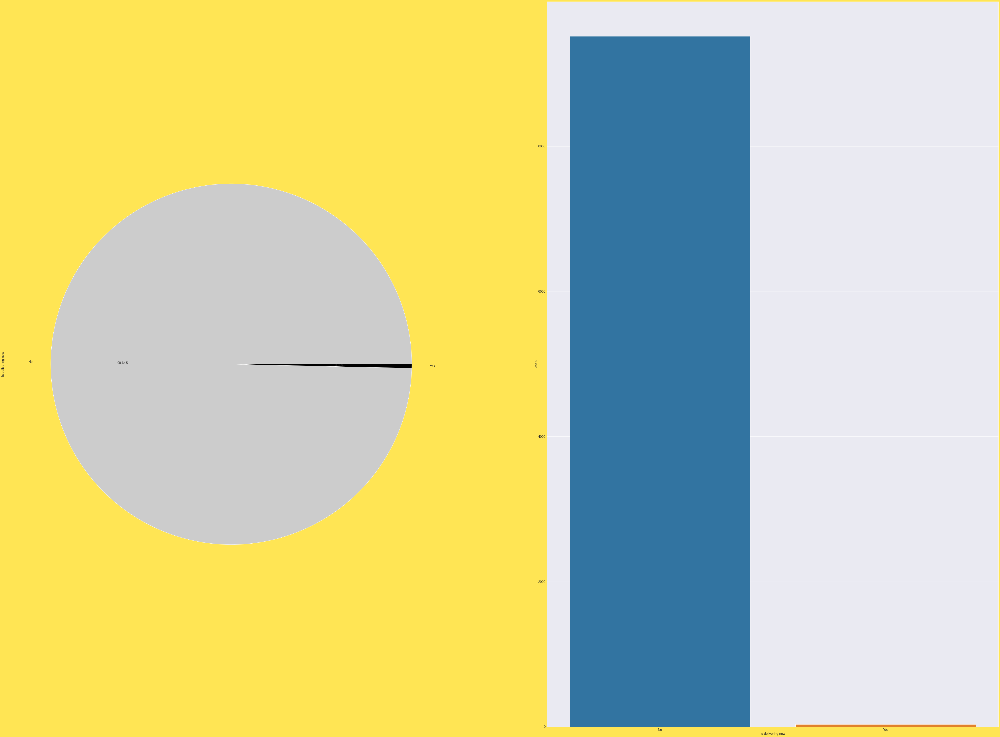

No    9551
Name: Switch to order menu, dtype: int64


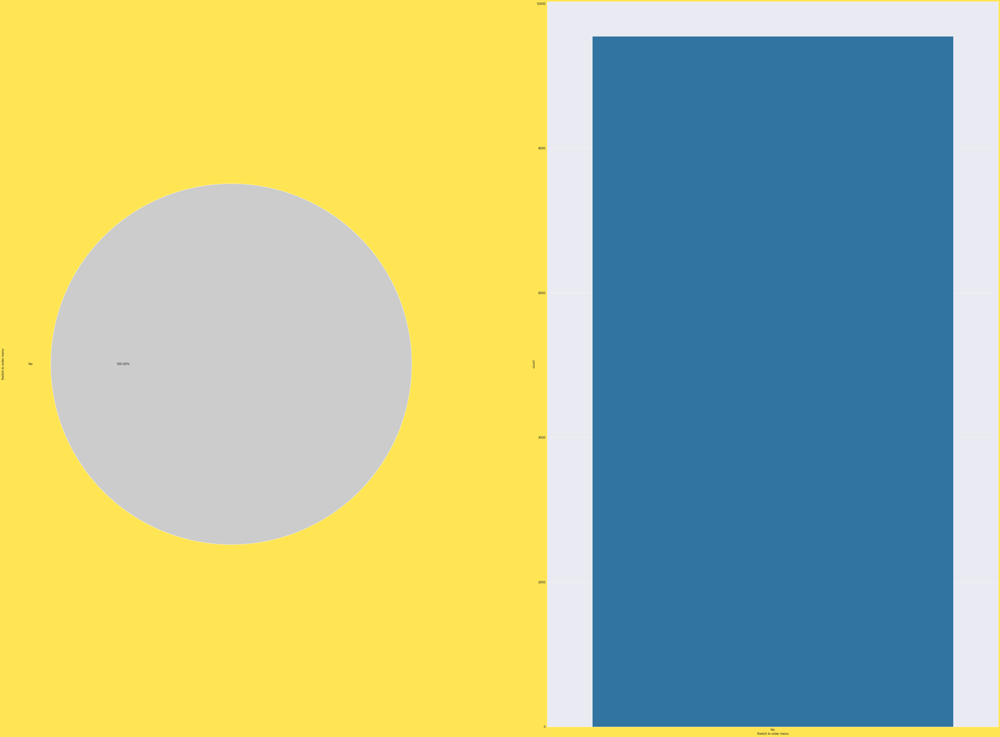

Orange        3737
White         2148
Yellow        2100
Green         1079
Dark Green     301
Red            186
Name: Rating color, dtype: int64


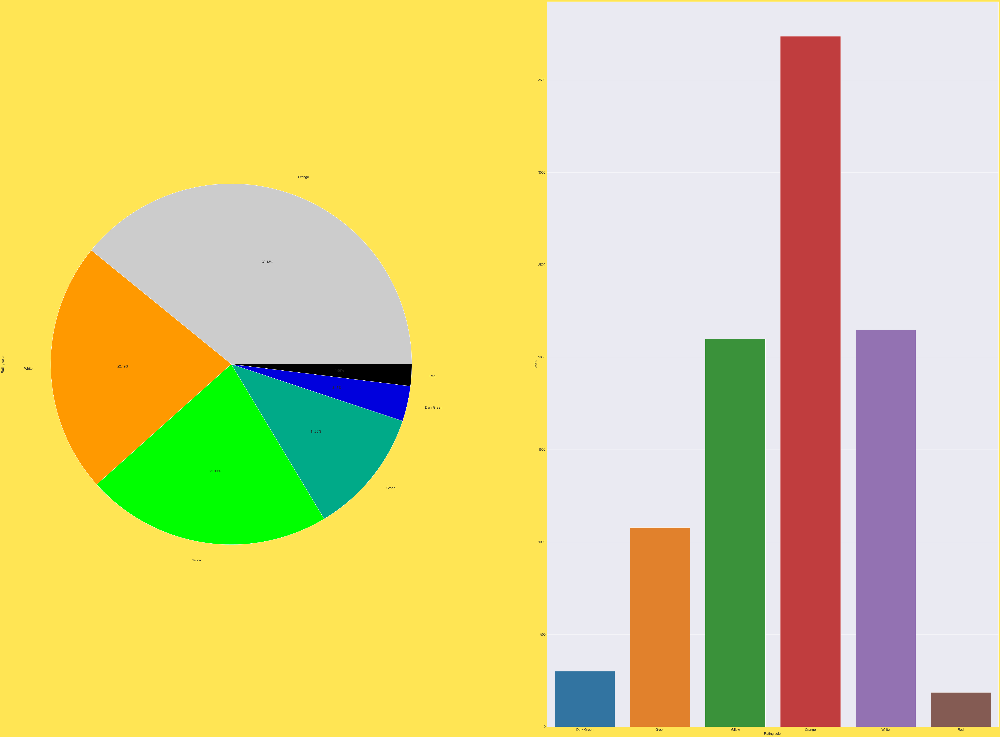

Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: Rating text, dtype: int64


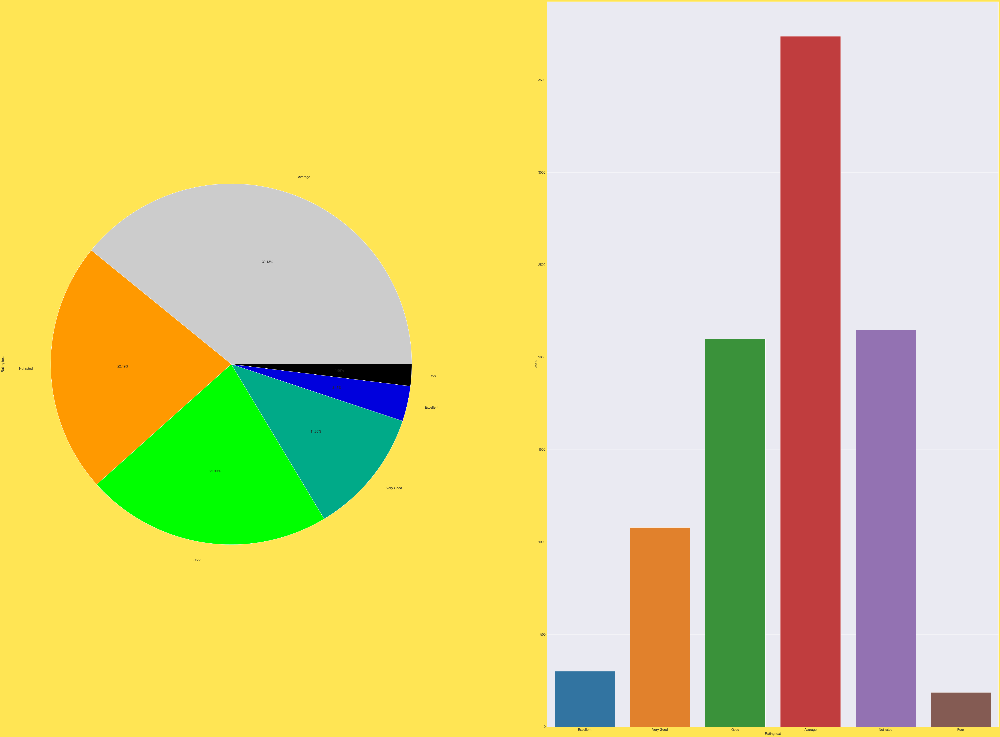

India             8652
United States      434
United Kingdom      80
Brazil              60
UAE                 60
South Africa        60
New Zealand         40
Turkey              34
Australia           24
Phillipines         22
Indonesia           21
Singapore           20
Qatar               20
Sri Lanka           20
Canada               4
Name: Country, dtype: int64


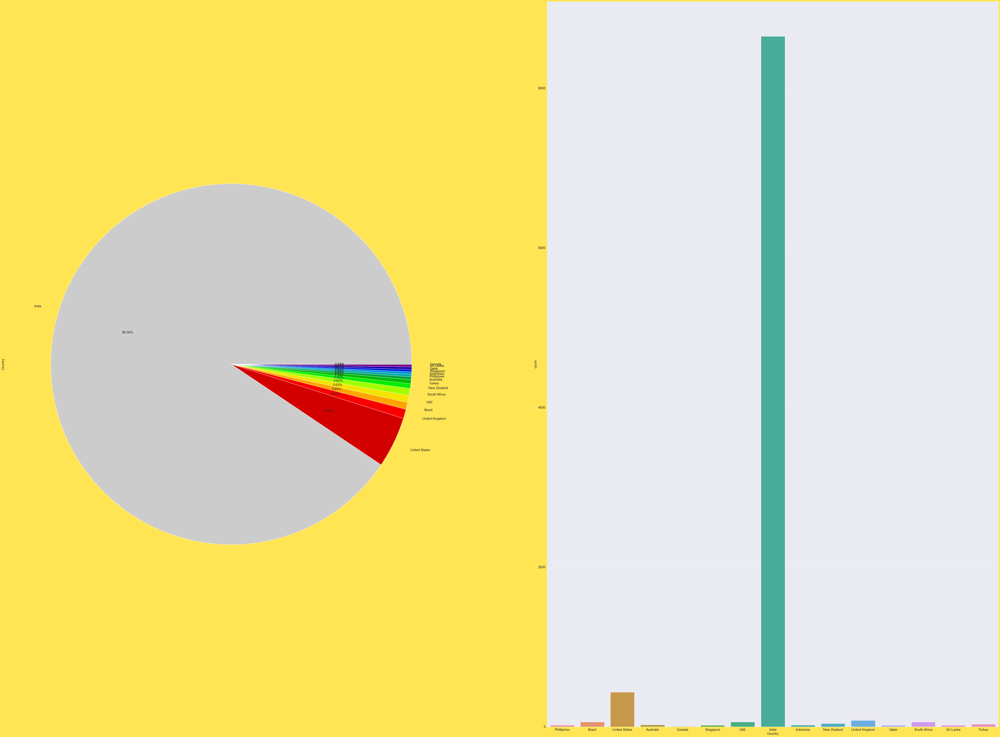

In [30]:
# let's visualise these cat_cols_less using count plots to check the unique value count
for i in cat_cols_less:
    
    plt.figure(figsize=(80,60))
    plt.subplot(1,2,2)
    sns.countplot(i,data=zom)
    plt.subplot(1,2,1)
    zom[i].value_counts().plot.pie(autopct='%1.2f%%',cmap ='nipy_spectral_r')
    print(zom[i].value_counts())
    plt.show()

Observations:-
    
-> More than 90% of the currency type is Indian Rupees, We can say that most of the data in the dataset is related to india.

-> 88% of the restaurants doesn't have a table booking option. This makes sense, Generally most hotels in india doesn't have table bookings.

-> And About 75% of the restaurants doesn't have a online delivery service.

-> 99% of the restaurants are not delivering now.

-> None of the restaurants are switch to order menu.

-> The highest rated colour is orange, almost 40% restaurants are of orange rating colour and the least rated colur is red.

-> Similarly Almost 40% of the restaurants are Average rated and 22% of them are not rated at all, and only up to 2% of these are poor rated.

-> As we have discussed, More than 90% of the restaurants are indian in this data followed by United States and UK.

In [31]:
# filtering categorical columns with high 
cat_cols_high = [x for x in cat_cols if len(zom[x].unique()) > 15]
cat_cols_high

['Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines']

In [32]:
# checking value counts of these columns
for i in cat_cols_high:
    print(zom[i].value_counts())

Cafe Coffee Day                                           83
Domino's Pizza                                            79
Subway                                                    63
Green Chick Chop                                          51
McDonald's                                                48
Keventers                                                 34
Pizza Hut                                                 30
Giani                                                     29
Baskin Robbins                                            28
Barbeque Nation                                           26
Giani's                                                   22
Dunkin' Donuts                                            22
Barista                                                   22
Costa Coffee                                              20
Pind Balluchi                                             20
Pizza Hut Delivery                                        19
Sagar Ratna             

Obseravations:-
    
-> Cafe coffee Day has the highest count followed by Domino's Pizza and Subway.

-> Sector 41, Noida and Dilli Haat, INA, New Delhi have the highest Address Count

-> Connaught Palace has the highest Locality count followed by Rajouri Garden and Shahdara. Same with the locality Verbose.

-> Most ordered cuisine is North Indian and Chinese.

In [33]:
# plotting a count plot for City column
plt.figure(figsize=(300,100))
sns.countplot('City',data=zom)
plt.show()
# plt.savefig(citycount.plot)

# We can observe that more than 90% data has the city Delhi

In [34]:
# seperating continuous columns
cont_cols = zom.dtypes[zom.dtypes != 'object'].index.tolist()
cont_cols


['Country Code',
 'Longitude',
 'Latitude',
 'Average Cost for two',
 'Price range',
 'Aggregate rating',
 'Votes']

In [35]:
# checking the unique values
for i in cont_cols:
    print('Unique Values in',i,':- ',zom[i].unique())
    print('Total Number of Unique Values in',i,':- ',zom[i].nunique())
    print('\n')

Unique Values in Country Code :-  [162  30 216  14  37 184 214   1  94 148 215 166 189 191 208]
Total Number of Unique Values in Country Code :-  15


Unique Values in Longitude :-  [121.027535   121.014101   121.056831   ...  29.03464001  29.036019
  29.02601603]
Total Number of Unique Values in Longitude :-  8120


Unique Values in Latitude :-  [14.565443   14.553708   14.581404   ... 41.05581715 41.057979
 40.98477563]
Total Number of Unique Values in Latitude :-  8677


Unique Values in Average Cost for two :-  [  1100   1200   4000   1500   1000   2000   6000    800    900    700
    850    600   3000   1800     55     30     45     60     50     80
     90    200    150    100    230    240    350    140    170    120
    250     40     70    300     85     75    400     65     25     10
      0     35     20      7    270    500    430    315    220     95
    190    260    180    330    280    160    285    130    110   2500
   3600    550   1400    450    950    650   1300   2

In [36]:
# Here proce range is one of our target which is categorical
# And Country code is also categorical too 
# So let's remove these two columnns from cont_cols
cont_cols.remove('Country Code')
cont_cols.remove('Price range')

1    4444
2    3113
3    1408
4     586
Name: Price range, dtype: int64


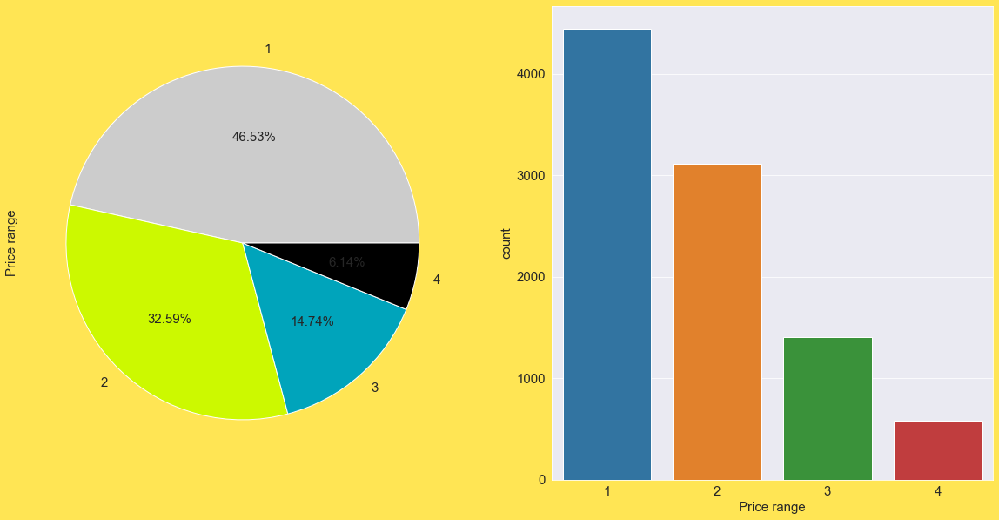

In [37]:
# let's plot these continuous discrete columns
plt.figure(figsize=(20,10))
plt.subplot(1,2,2)
sns.countplot('Price range',data=zom)
plt.subplot(1,2,1)
zom['Price range'].value_counts().plot.pie(autopct='%1.2f%%',cmap ='nipy_spectral_r')
print(zom['Price range'].value_counts())
plt.show()

Price range 1 has the highest count followed by 2,3 and 4.

1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: Country Code, dtype: int64


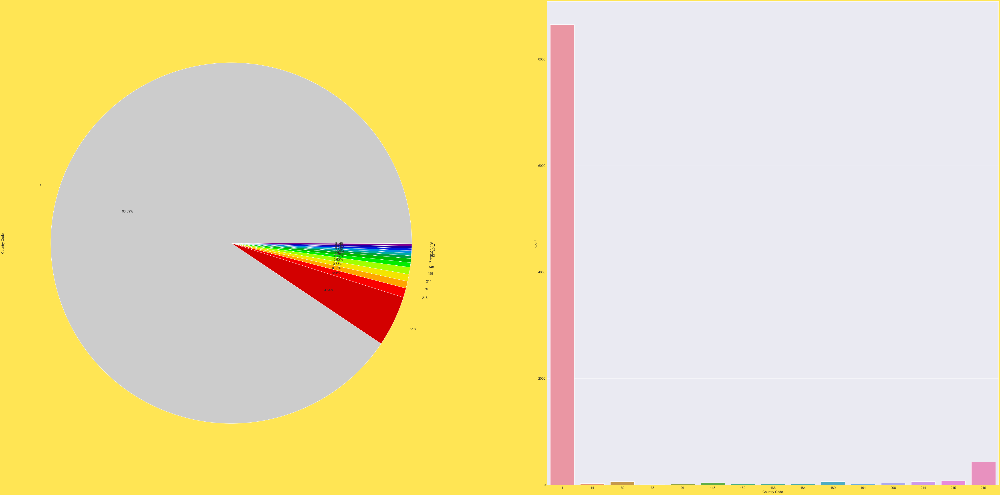

In [38]:
plt.figure(figsize=(80,40))
plt.subplot(1,2,2)
sns.countplot('Country Code',data=zom)
plt.subplot(1,2,1)
zom['Country Code'].value_counts().plot.pie(autopct='%1.2f%%',cmap ='nipy_spectral_r')
print(zom['Country Code'].value_counts())
plt.show()

# Around 90% of the data has country code 1 which is India, followed by 216 United States and UK

In [39]:
# plotting a histogram to check the continuous variables
def histogram(zom,cont_cols):
    # creating a  copy of dataframe
    data = zom[cont_cols].copy()
    # subplots 
    fig, axes = plt.subplots(nrows=len(data.columns)//2, ncols=2,figsize=(80,50))
    fig.subplots_adjust(hspace=0.7)
    
    # our main distplot
    for ax, feature in zip(axes.flatten(), data.columns):
        sns.histplot(data[feature],ax=ax,bins=50)
        ax.set_title(f'Histogram of {feature}')
    plt.show()

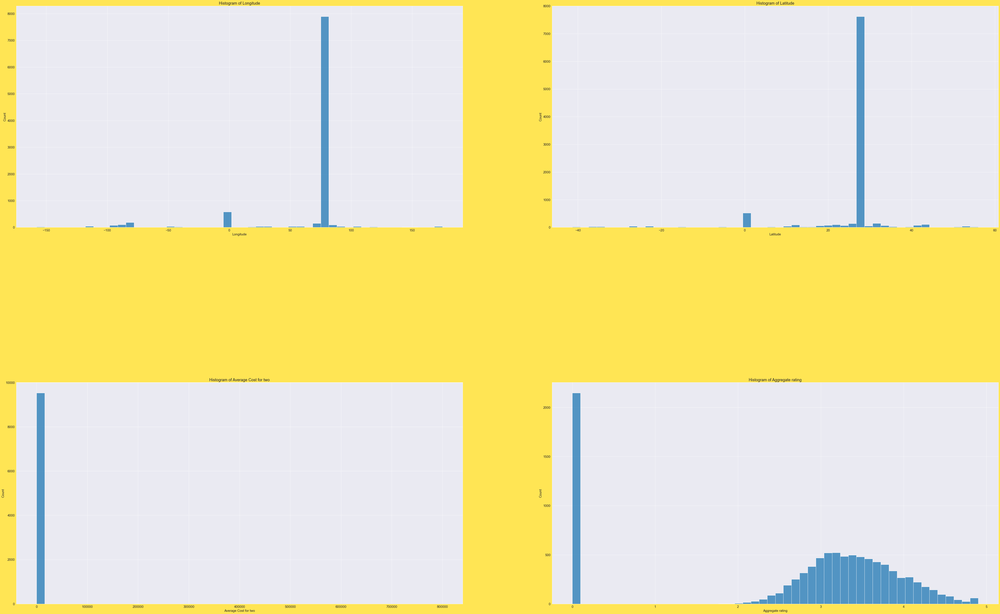

In [40]:
histogram(zom,cont_cols)


int64


<AxesSubplot:xlabel='Votes', ylabel='Count'>

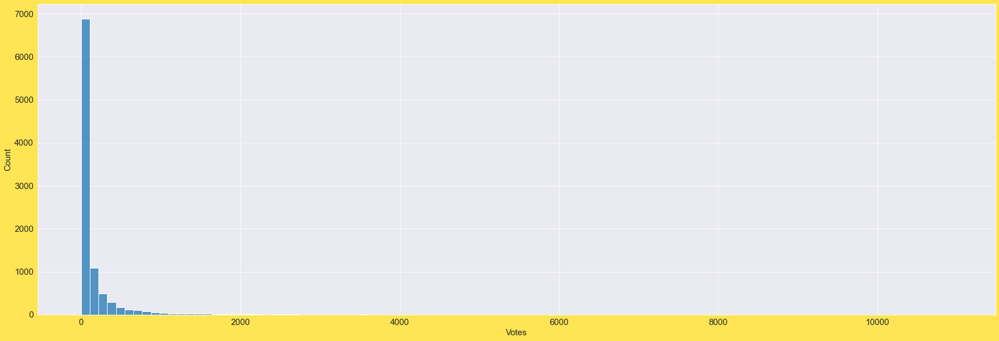

In [41]:
# plooting histogram for votes
plt.figure(figsize=(30,10))
print(zom['Votes'].dtype)
sns.histplot(zom['Votes'],bins=100)

-> locations with Longitude 50-100 are significantly more, Similarly 20-40 for Latitude.

-> Most of the Aggregate Rating received by the resaturants are 0's. Other than that the range 2-5 rating is majority.

-> Similarly Votes majority are most 0's.

## Bivariate Analysis

In [42]:
cat_cols

['Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'Country']

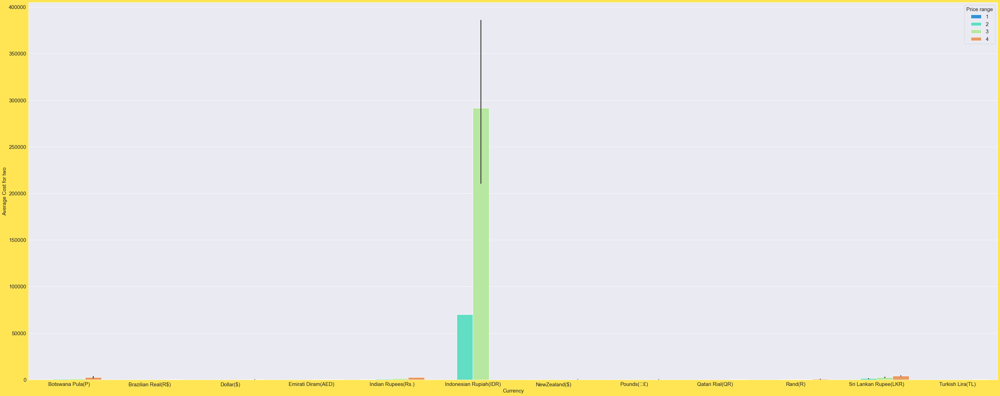

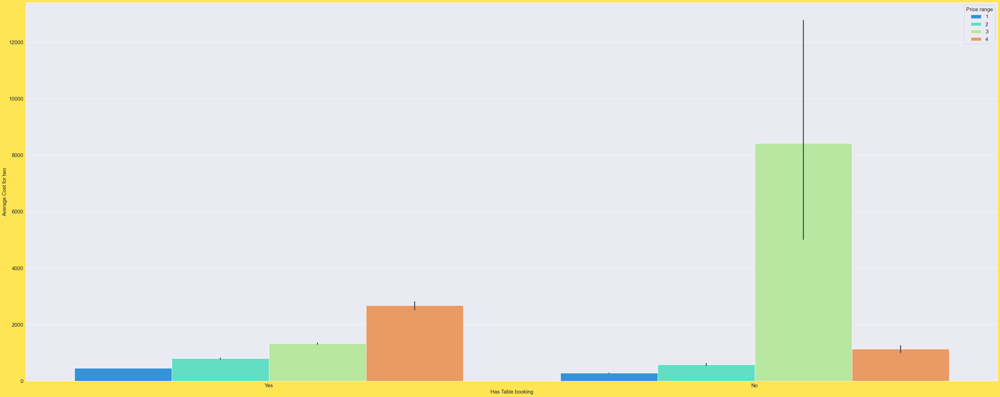

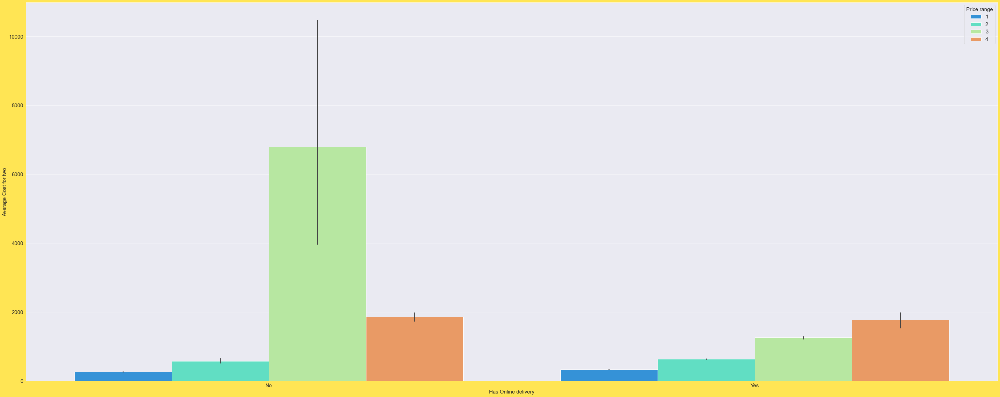

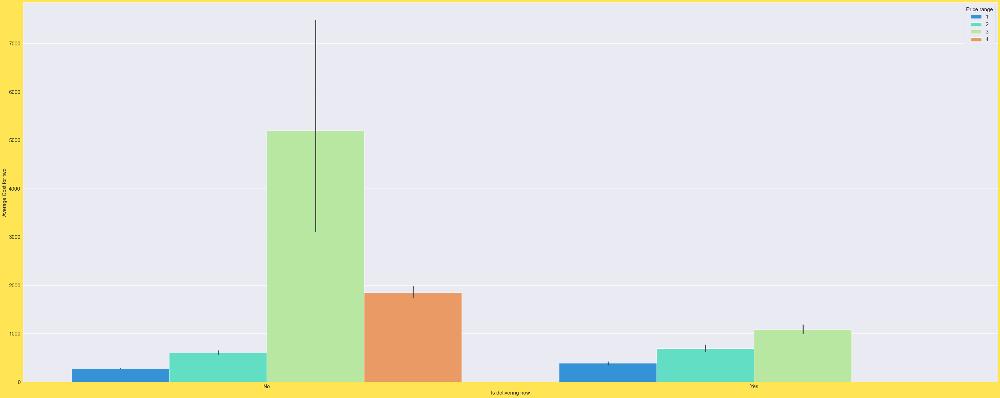

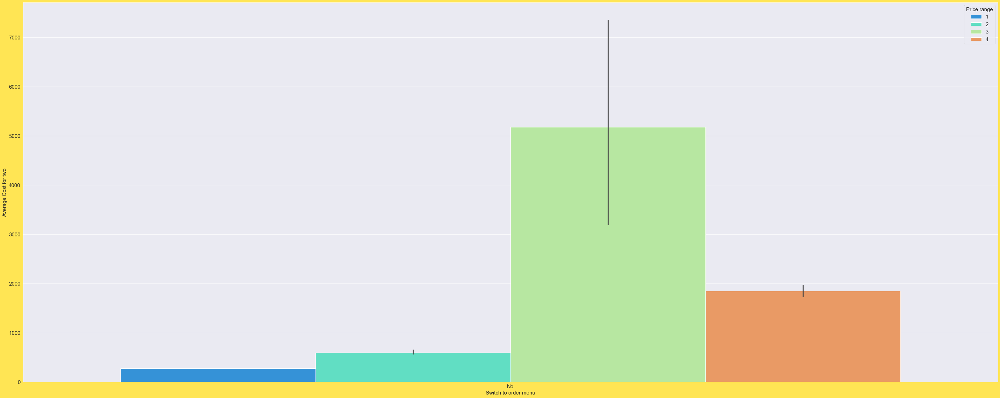

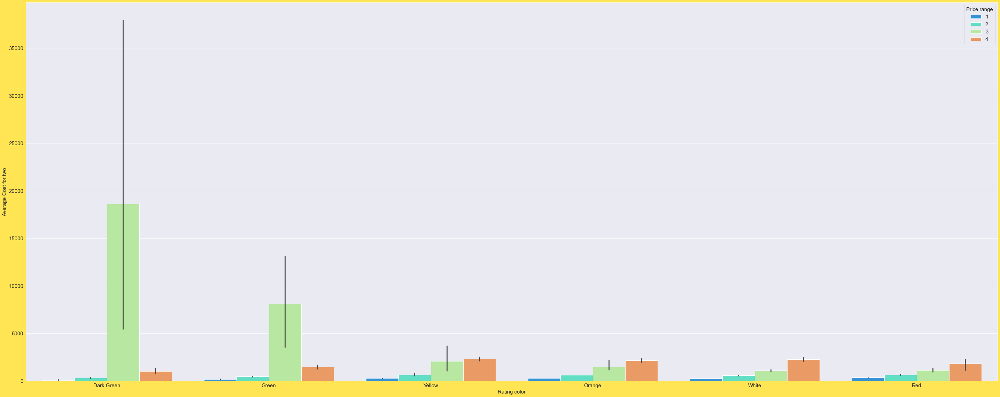

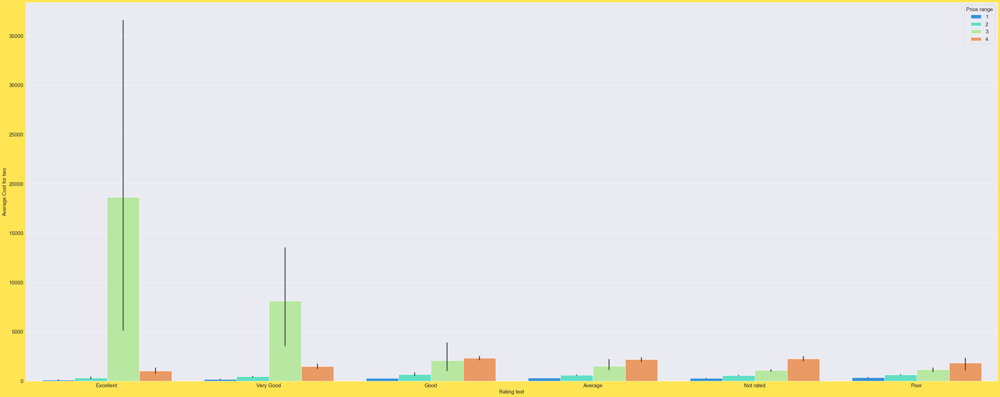

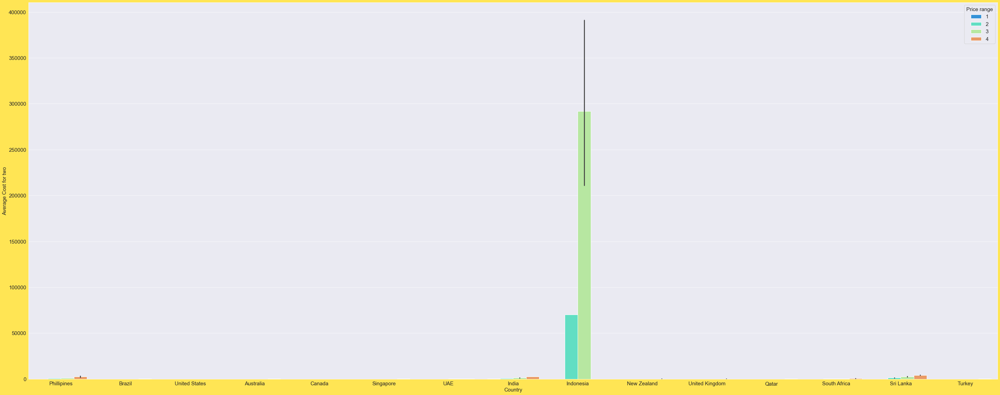

In [43]:
# plotting barplot to know the relationship of the cat features with its targets Price range and Avg cost for two people
for i in cat_cols_less:
    plt.figure(figsize=(50,20))
    sns.barplot(zom[i],zom['Average Cost for two'],hue='Price range',data=zom,palette='rainbow')
    plt.show()

Observations:-
    
-> Interestingly, Indonesians are paying (indonesian rupiah(idr)) significantly highest average for two people in the price range of 3 than any other countries including india.

-> Price range of 4 is higher in the restaurants which are having table booking service. This make sense because usually high end restaurants have this facility.

-> And restaurants without table booking Service are having majority price range of 3 and is highest avg price for two persons.

-> Same is the thing with the resaturants which doesn't have online delivery service and is highest avg price for two persons.

-> Although there is no delivery now, the price range is highest for 3 and 4 ranges and Interestingly, the resaturants which are delivering now are having the price range from 1-3, 4 is not paid by any customer.

-> Most of the restaurants switch to order menu are paid in the range 3 which is the highest avg price for two persons ..

-> Customers who selected dark green color paid are having higher average for two persons.

-> Restaurants with Excellent Rating text are paying higher price and the highest price range is 3, which means price range 3 is one of a factor for excellent reviews on restaurants.

-> Indonesia is having the highest Avg cost for two persons in the price range from 1-3.

In [44]:
# plotting a barplot for City column
plt.figure(figsize=(300,100))
sns.barplot(zom['City'],zom['Average Cost for two'],hue='Price range',data=zom,palette='rainbow',)
plt.show()

plt.savefig('saved_figure') # Saving the barplot to view the graph properly

<Figure size 720x504 with 0 Axes>

Bandung, Bogor, Jakarta, Tangerang cities have significantly higher average cost for two people mostly in the price range of and 2.

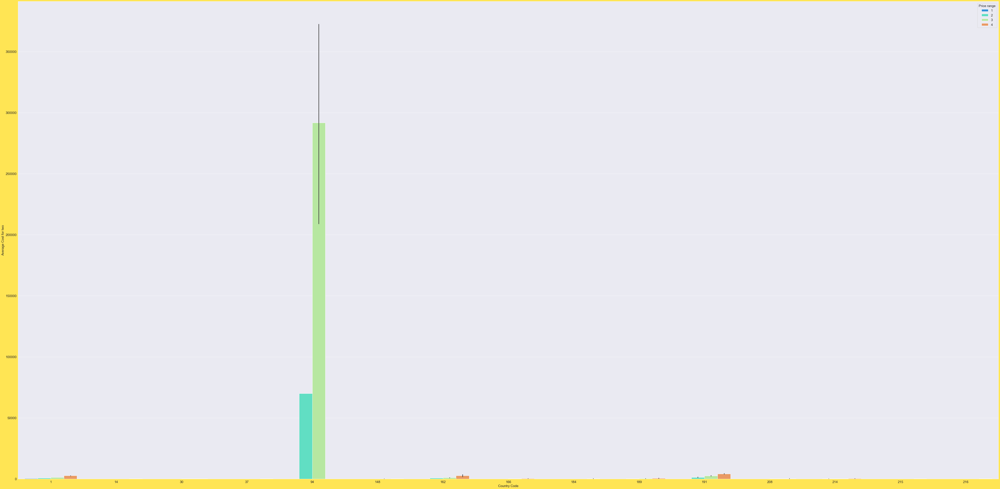

In [45]:
# plotting a barplot for City column
plt.figure(figsize=(80,40))
sns.barplot(zom['Country Code'],zom['Average Cost for two'],hue='Price range',data=zom,palette='rainbow',)
plt.show()

# Country Code 94 which is indonesia has highest Avg price and in the range of 2-3. 

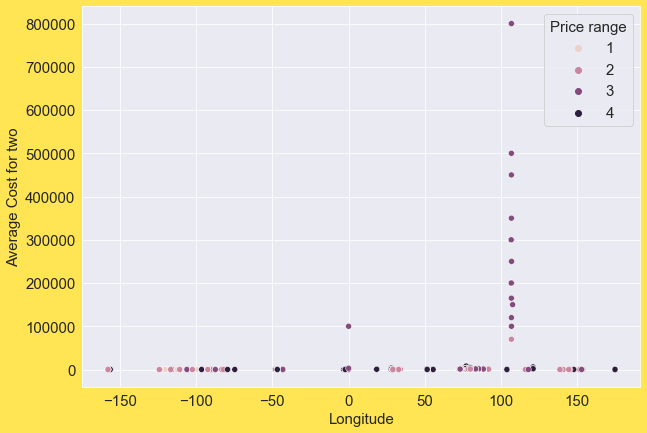

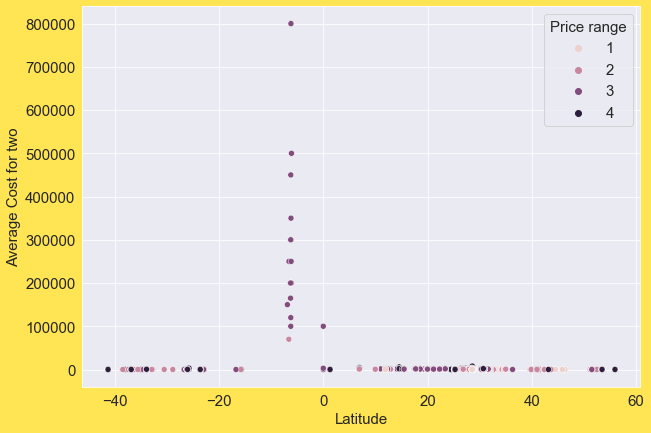

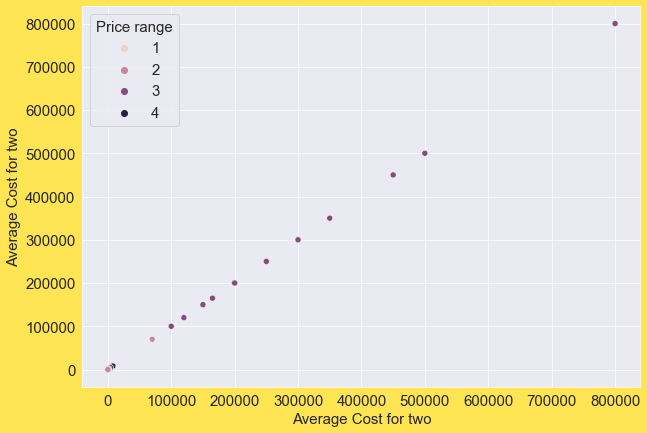

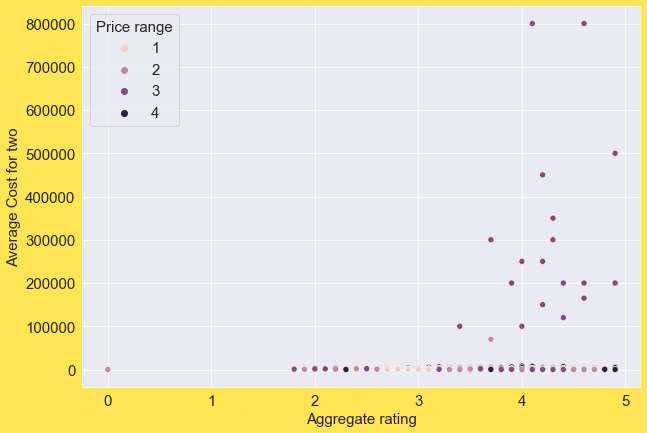

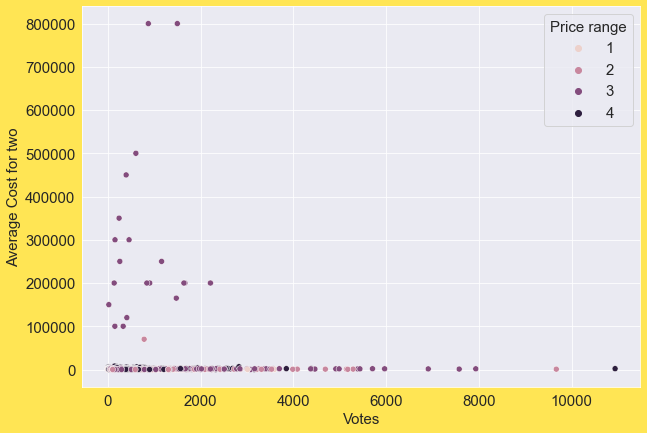

In [46]:
# Plotting scatter plots for continuous columns with respect to the targets avg cost and price range
# importing plotly to make good visualizations

for i in cont_cols:
    
    sns.scatterplot(zom[i],zom['Average Cost for two'],hue='Price range',data=zom)
    plt.show()

Observations:-
    
-> Locations with Longitude with higher than 100 are having high Average cost per two people with the range 3-4.

-> Similarly with latitude with less than 0 are having high Average cost per two people with the range 3.

-> Restaunrants with aggregate rating higher than 4 are having high avg cost and the price range of 2-3.

-> Reataurant with 0-2000 votes are having high average cost and the price range is 2 and 3.


<AxesSubplot:xlabel='Aggregate rating', ylabel='Votes'>

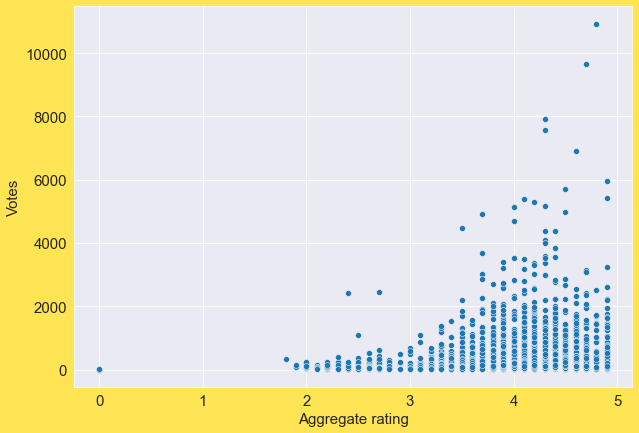

In [47]:
# 
sns.scatterplot(x=zom['Aggregate rating'], y= zom['Votes'])

<AxesSubplot:xlabel='Aggregate rating', ylabel='Votes'>

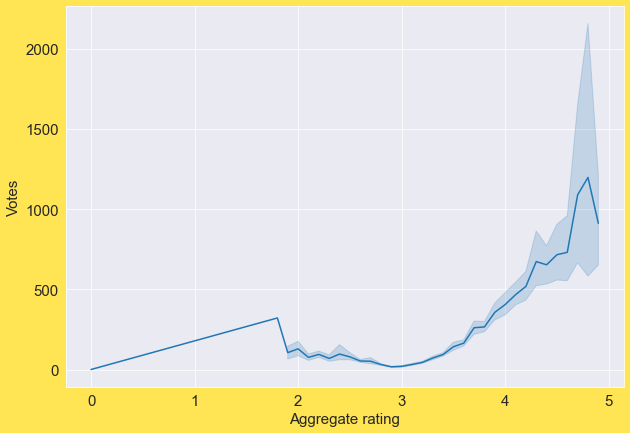

In [48]:
# plotting between Aggregate rating and Votes
sns.lineplot(x=zom['Aggregate rating'], y= zom['Votes'])

Here we can see the same inference. Aggregate Ratings and Votes have an increasing trend

## Multivariate Analysis

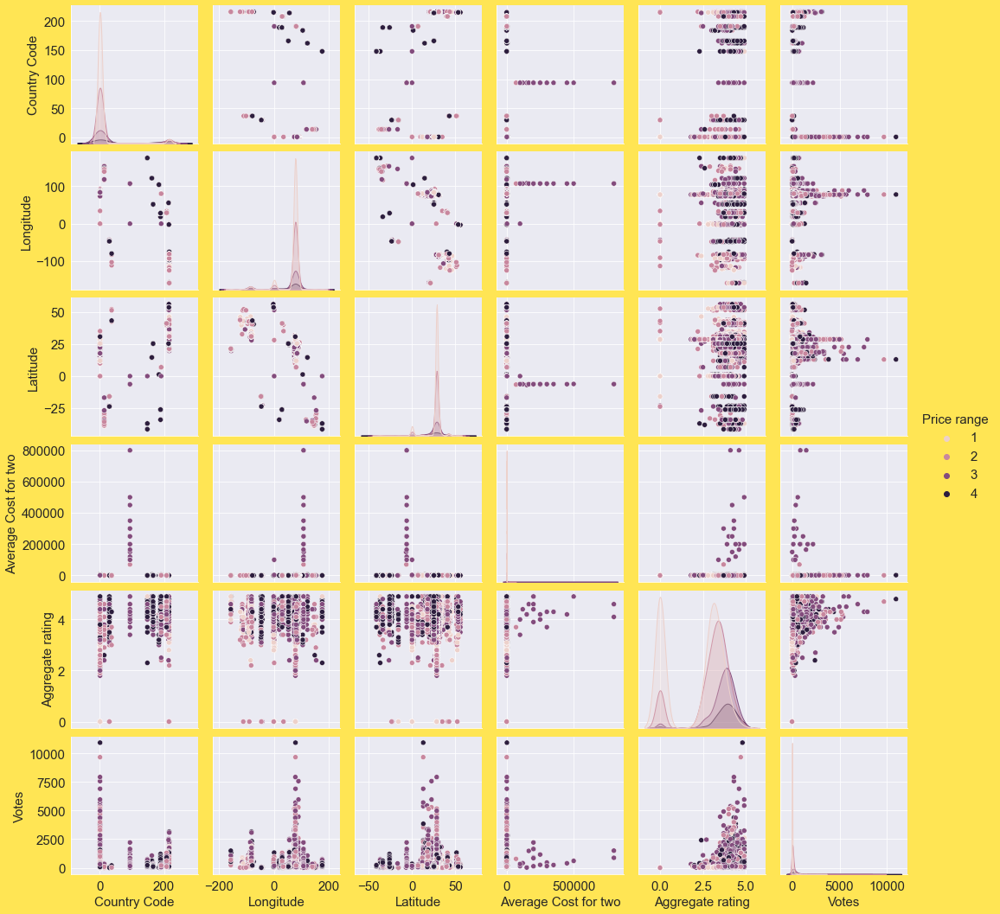

In [49]:
# plotting the paiplot with respect to the target Price range
sns.pairplot(zom,hue='Price range')

# We can see that there is high skewness in the data.
# And some features are highly correlated with target Price range.

## Checking and treating Outliers


In [50]:
zom.dtypes

Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
Country                  object
dtype: object

In [51]:
# loooking at the continuous columns
cont_cols

['Longitude', 'Latitude', 'Average Cost for two', 'Aggregate rating', 'Votes']

In [52]:
# creating two deep copy dataframes for each model predicting avg cost and price range
avg_cost = zom.copy() # for regression model predicting average cost
price_range = zom.copy() # for classification model predicting price range

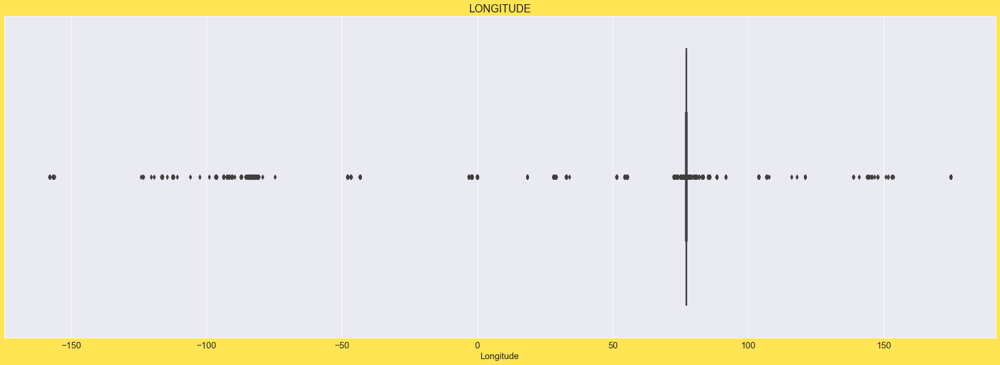

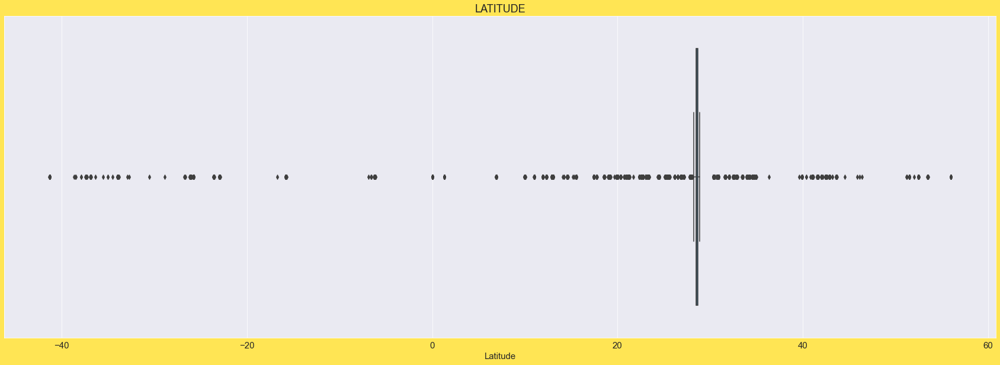

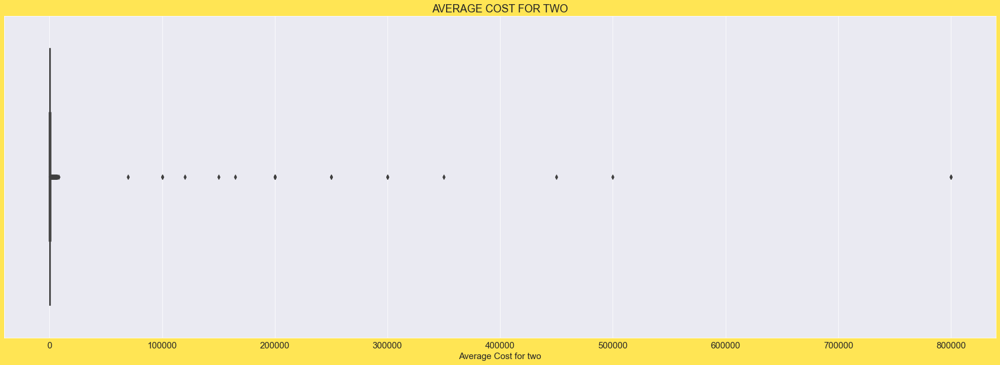

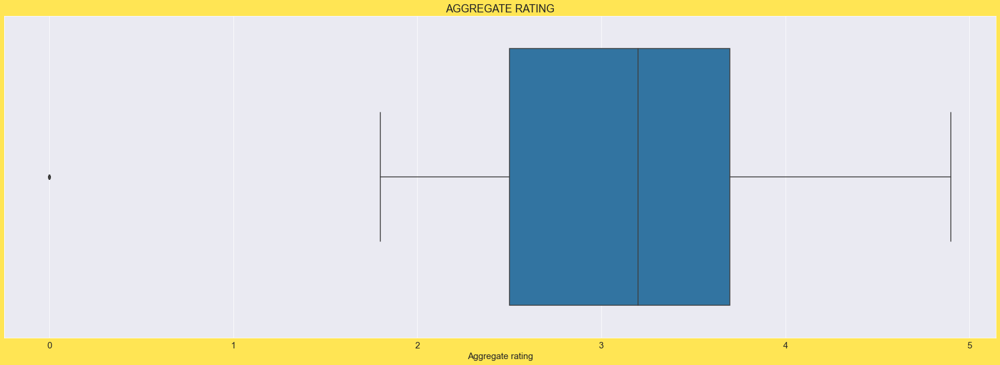

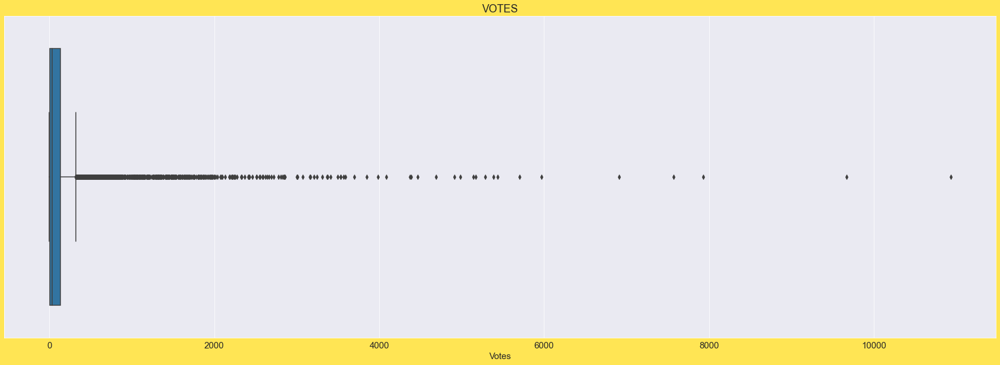

In [53]:
# plotting to see outliers
for i in cont_cols:
    plt.figure(figsize=(30,10))
    sns.boxplot(price_range[i])
    plt.title(i.upper())
    plt.show()

 We can see that outliers are present in all these continuous columns

In [54]:
# Let's use zscore method to remove the outliers first
# Removing the outliers using zscore method
# using zscore method
from scipy.stats import zscore

outlier_cols = price_range[cont_cols]

z=np.abs(zscore(outlier_cols))

print(np.where(z>3))

(array([  22,   23,   24,   25,   26,   27,   28,   29,   30,   31,   32,
         33,   34,   35,   36,   37,   38,   39,   40,   41,   42,   43,
         44,   45,   46,   47,   48,   49,   50,   51,   52,   53,   54,
         55,   56,   57,   58,   59,   60,   61,   62,   63,   64,   65,
         66,   67,   68,   69,   70,   71,   72,   73,   74,   75,   76,
         77,   78,   79,   80,   81,   82,   83,   84,   85,   86,   87,
         88,   89,   90,   91,   92,   93,   94,   95,   96,   97,   98,
         99,  100,  101,  102,  102,  103,  104,  105,  106,  107,  108,
        109,  110,  111,  112,  113,  114,  115,  116,  117,  118,  119,
        120,  121,  122,  123,  124,  125,  126,  127,  128,  129,  130,
        131,  132,  133,  134,  135,  136,  137,  138,  139,  140,  141,
        142,  143,  144,  145,  146,  147,  148,  149,  150,  151,  152,
        153,  154,  155,  156,  157,  158,  159,  160,  161,  162,  163,
        164,  165,  166,  167,  168,  169,  170,  

In [55]:
# removing outliers
price_range_df = price_range[(z<3).all(axis=1)]

In [56]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",price_range.shape)
print("shape after: ",price_range_df.shape)
print("Percentage Loss: ",(price_range.shape[0]-price_range_df.shape[0])/price_range.shape[0]*100)

# There is 8% data loss with zscore method

shape before and after
shape before:  (9551, 21)
shape after:  (8756, 21)
Percentage Loss:  8.323735734478065


In [57]:
# checking with IQR method
# CHECKING WITH THE iqr method as well
Q1=outlier_cols.quantile(0.25)
Q3=outlier_cols.quantile(0.75)
IQR=Q3 - Q1

price_range_quant = price_range[~((price_range < (Q1 - 1.5 * IQR)) |(price_range > (Q3 + 1.5 * IQR))).any(axis=1)]

In [58]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",price_range.shape)
print("shape after: ",price_range_quant.shape)
print("Percentage Loss: ",(price_range.shape[0]-price_range_quant.shape[0])/price_range.shape[0]*100)


# We can see there is 50% data loss by using IQR method
# So lets use zscore method

shape before and after
shape before:  (9551, 21)
shape after:  (4704, 21)
Percentage Loss:  50.748612710710916


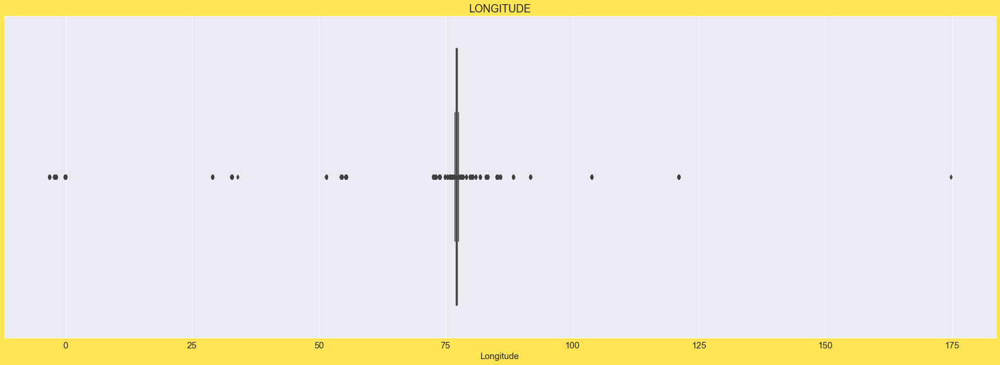

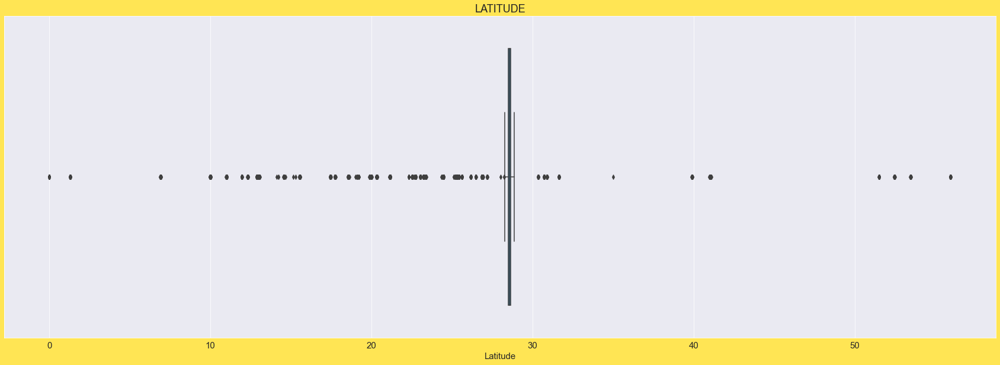

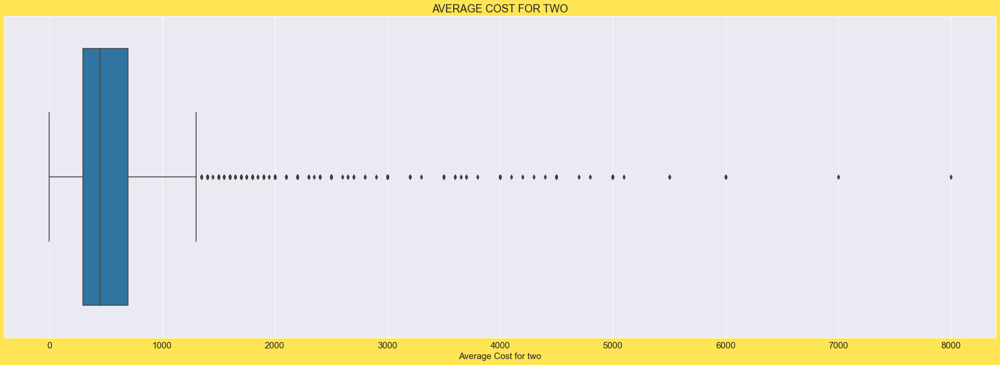

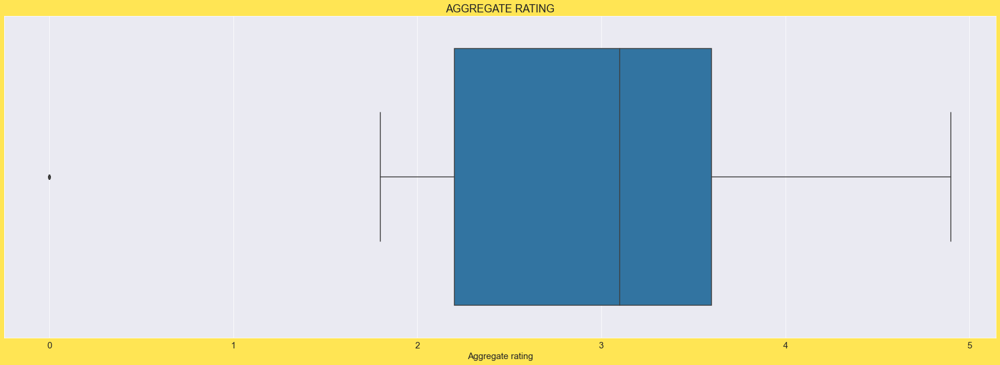

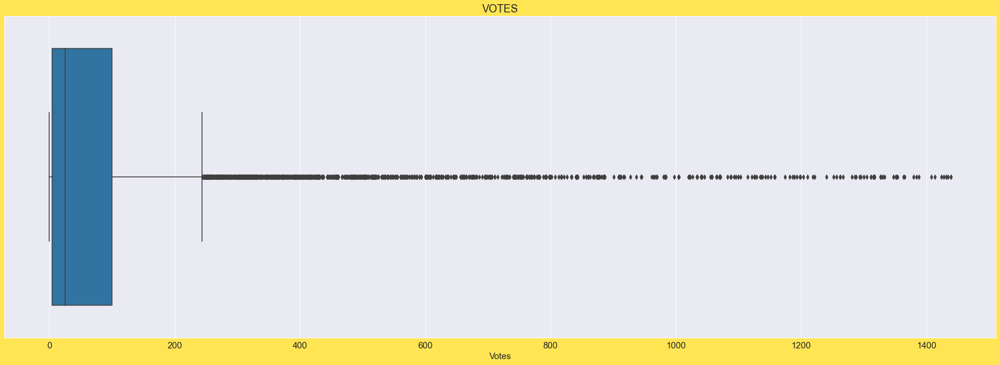

In [59]:
# Now let's check the outliers again
for i in cont_cols:
    plt.figure(figsize=(30,10))
    sns.boxplot(price_range_df[i])
    plt.title(i.upper())
    plt.show()


We can observe most of the outliers are removed

## Checking and Treating Skewenss

In [60]:
price_range_df.shape

(8756, 21)

In [61]:
# checking skewenss
price_range.skew().sort_values(ascending=False)

# We can see that these columns are highly skewed

Average Cost for two    35.477915
Votes                    8.807637
Country Code             3.043965
Price range              0.889618
Aggregate rating        -0.954130
Longitude               -2.807328
Latitude                -3.081635
dtype: float64

In [62]:
# checking the skewness in the continuous variables
price_range[cont_cols].skew().sort_values()

Latitude                -3.081635
Longitude               -2.807328
Aggregate rating        -0.954130
Votes                    8.807637
Average Cost for two    35.477915
dtype: float64

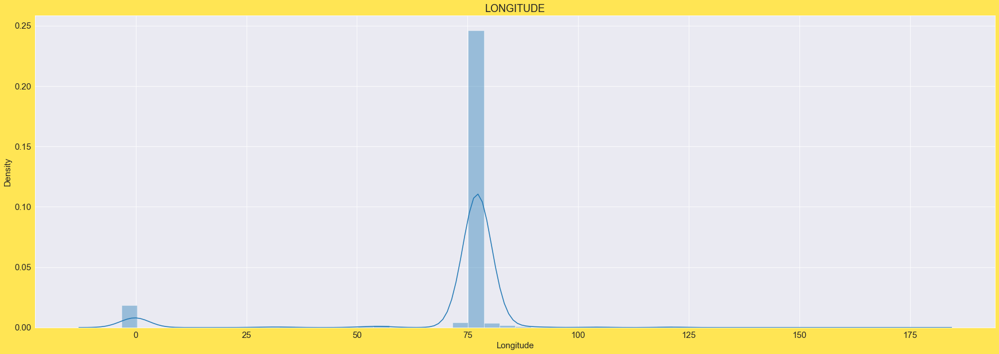

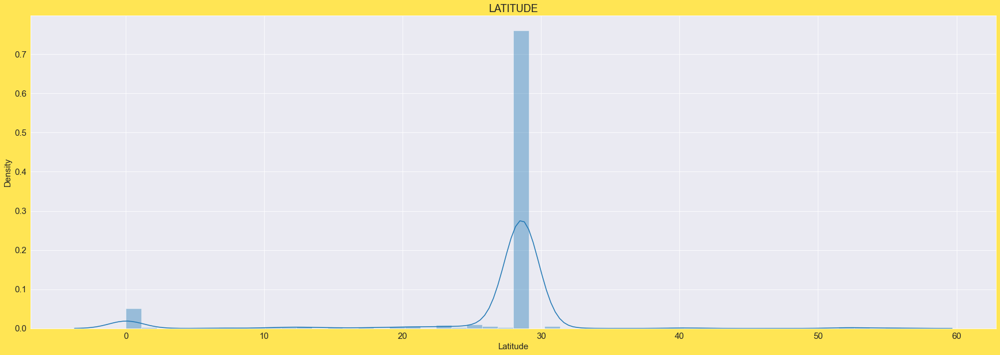

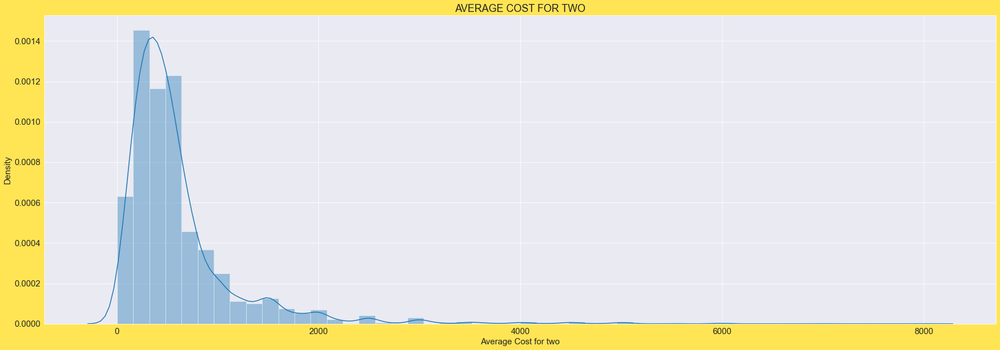

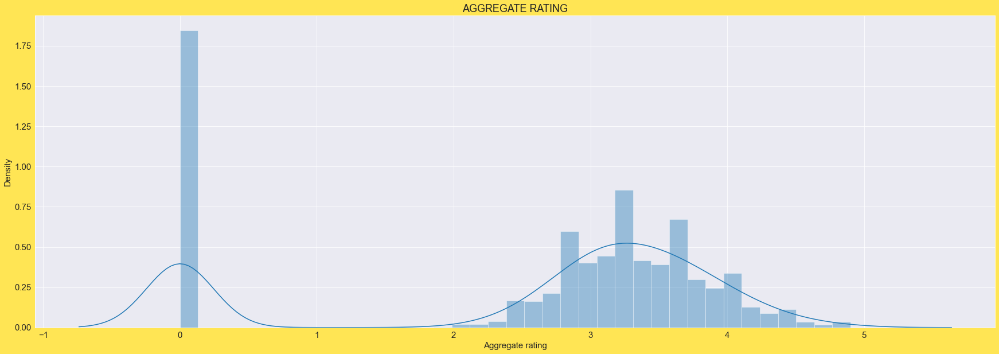

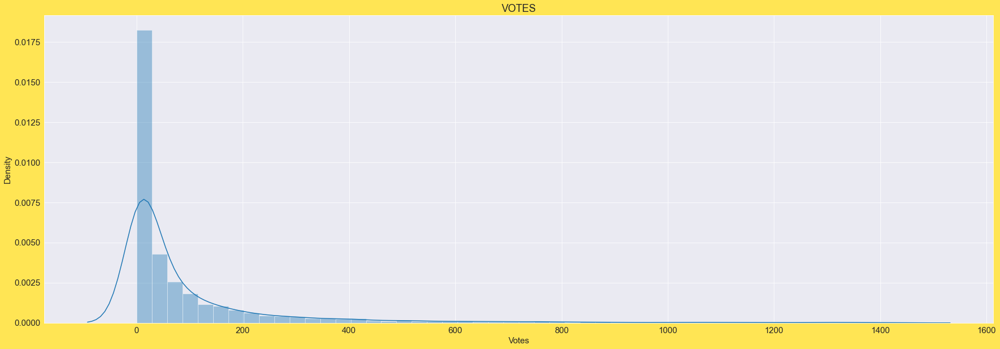

In [64]:
# plotting distplots to see the skewness
for i in cont_cols:
    plt.figure(figsize=(30,10))
    sns.distplot(price_range_df[i])
    plt.title(i.upper())
    plt.show()
 # We can see there is high amount of skewenss in the these columns

In [65]:
# using powertransformer method to remove skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')

In [66]:
# fitting the power transformer 
price_range_df[cont_cols] = pt.fit_transform(price_range_df[cont_cols].values)

In [68]:
# checking skewness again
price_range_df[cont_cols].skew().sort_values()

# The skewness is reduced to its minimum

Longitude              -0.963749
Aggregate rating       -0.620066
Votes                  -0.012360
Average Cost for two    0.053731
Latitude                0.409584
dtype: float64

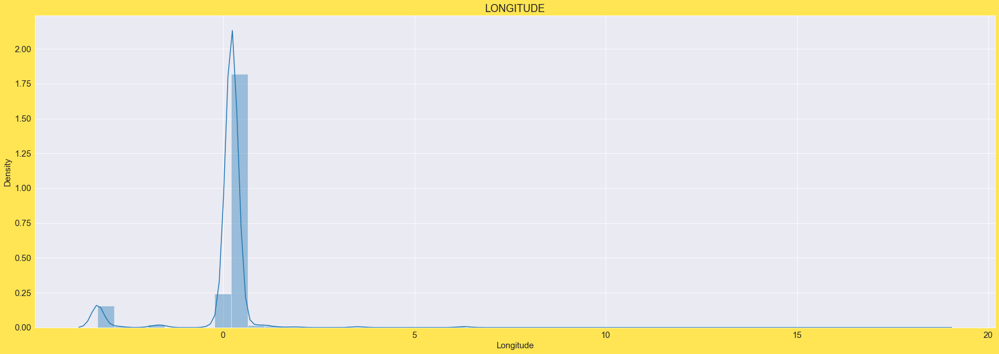

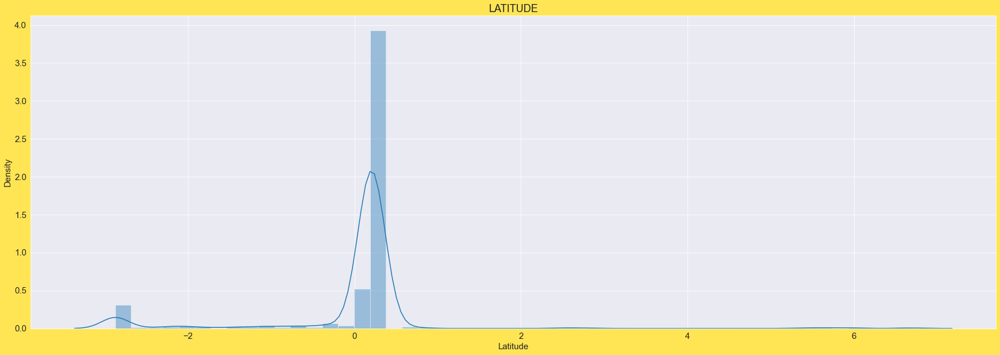

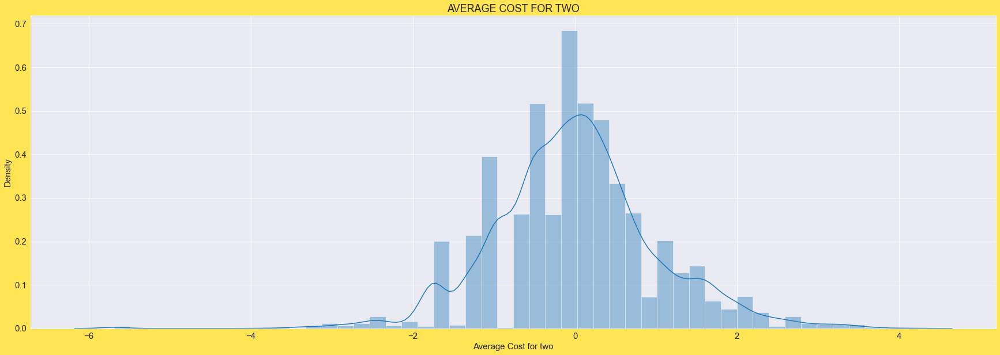

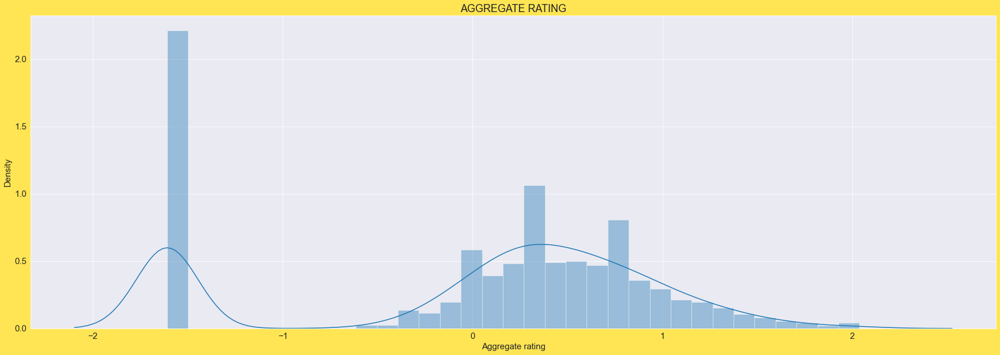

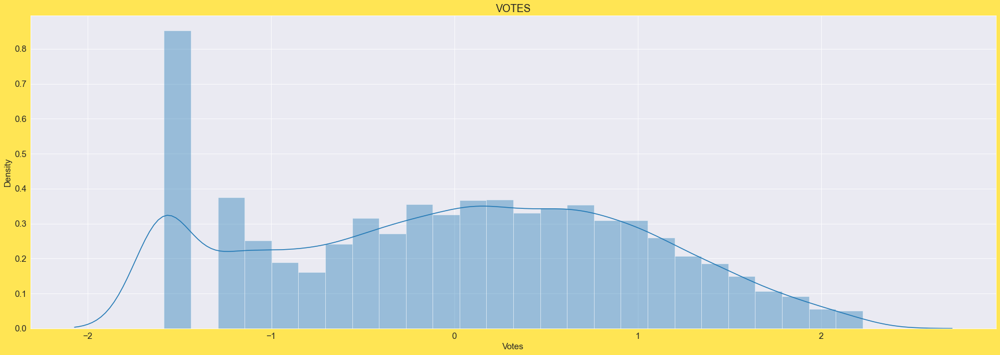

In [69]:
# plotting the graphs agin to check the skewness
for i in cont_cols:
    plt.figure(figsize=(30,10))
    sns.distplot(price_range_df[i])
    plt.title(i.upper())
    plt.show()
 # We can see skewness is reduced


## Encoding the Target and categorical features

In [70]:
# using Label Encoding encoding the categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in cat_cols:
    price_range_df[i] = le.fit_transform(price_range_df[i])

price_range_df.head(10) # checking the first 10 rows

# We can see that the data is encoded

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,3396,162,34,7911,130,131,6.296327,-1.864247,692,1.155715,0,1,0,0,0,3,1.928328,0,1,1.382904,2
1,2858,162,34,5385,451,459,6.293947,-1.865574,840,1.275163,0,1,0,0,0,3,1.607248,0,1,1.729422,2
2,2609,162,36,4065,235,241,6.301520,-1.862441,1351,3.042388,0,1,0,0,0,4,1.502874,1,5,1.300915,2
3,4250,162,36,7916,649,662,6.301457,-1.861998,851,1.586426,0,0,0,0,0,4,2.037983,0,1,1.464924,2
4,4997,162,36,7915,649,662,6.301640,-1.862096,850,1.586426,0,1,0,0,0,4,1.928328,0,1,1.211802,2
5,1897,162,36,4768,649,662,6.301428,-1.862174,324,1.026096,0,0,0,0,0,3,1.502874,1,5,1.419773,2
6,910,162,46,3382,650,663,6.287846,-1.868101,73,1.998393,0,1,0,0,0,4,1.098840,1,5,1.658903,2
7,6503,162,46,3381,650,663,6.287787,-1.867123,1358,1.998393,0,1,0,0,0,4,1.298149,1,5,1.804489,2
8,5491,162,46,6277,775,828,6.287921,-1.865655,586,3.688345,0,1,0,0,0,4,2.037983,0,1,1.756756,2
9,3448,162,47,3365,394,400,6.301467,-1.863500,669,1.155715,0,1,0,0,0,3,1.928328,0,1,1.671459,2


# Correlation

In [71]:
price_range_df.corr().T

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
Restaurant Name,1.000000,0.021451,0.001480,0.003419,0.007021,0.007049,0.010843,0.016522,0.057685,0.049209,0.011840,0.039287,0.030244,0.012731,NaN,0.067217,0.031487,-0.009391,0.010931,0.040979,0.019339
Country Code,0.021451,1.000000,-0.178129,-0.047652,-0.079332,-0.077902,-0.212586,0.294290,-0.037482,-0.249332,0.445962,0.021060,-0.061782,-0.010740,NaN,0.259616,0.212843,-0.166747,0.133522,0.177280,0.972808
City,0.001480,-0.178129,1.000000,-0.073703,-0.013498,-0.017258,0.112360,-0.015953,0.017744,-0.036605,-0.179236,-0.008279,-0.003063,-0.019945,NaN,-0.145719,-0.146518,0.098000,-0.083796,-0.123649,-0.190775
Address,0.003419,-0.047652,-0.073703,1.000000,0.148533,0.150355,-0.004681,-0.028987,-0.013820,0.018505,-0.039459,-0.009390,-0.000654,0.029356,NaN,-0.021549,-0.102005,0.058493,0.043551,-0.128241,-0.052089
Locality,0.007021,-0.079332,-0.013498,0.148533,1.000000,0.999162,-0.002158,-0.011051,-0.011836,-0.059282,-0.041923,-0.070233,-0.046986,-0.010331,NaN,-0.114817,-0.165451,0.018026,-0.008356,-0.188121,-0.075868
Locality Verbose,0.007049,-0.077902,-0.017258,0.150355,0.999162,1.000000,-0.003259,-0.011515,-0.012912,-0.057817,-0.041409,-0.069349,-0.047377,-0.010310,NaN,-0.111872,-0.164179,0.018265,-0.006807,-0.186198,-0.074458
Longitude,0.010843,-0.212586,0.112360,-0.004681,-0.002158,-0.003259,1.000000,0.294355,0.014243,0.169160,-0.366735,0.068741,0.119548,0.013823,NaN,0.005374,0.091361,-0.039117,-0.114944,0.115259,-0.302537
Latitude,0.016522,0.294290,-0.015953,-0.028987,-0.011051,-0.011515,0.294355,1.000000,0.021691,-0.178741,0.341621,0.045852,0.091353,0.013222,NaN,-0.002439,0.088676,-0.075272,-0.091807,0.077884,0.383886
Cuisines,0.057685,-0.037482,0.017744,-0.013820,-0.011836,-0.012912,0.014243,0.021691,1.000000,0.003594,0.012402,0.040587,-0.038201,0.005417,NaN,0.010874,-0.061401,-0.039417,-0.060839,-0.035298,-0.036503
Average Cost for two,0.049209,-0.249332,-0.036605,0.018505,-0.059282,-0.057817,0.169160,-0.178741,0.003594,1.000000,-0.148484,0.538185,0.192374,0.029197,NaN,0.733156,0.333458,-0.031122,0.014607,0.433872,-0.277837


In [72]:
# We can see drop the swith order menu as it is having only one unique value
price_range_df.drop(['Switch to order menu'],axis=1,inplace=True)

<AxesSubplot:>

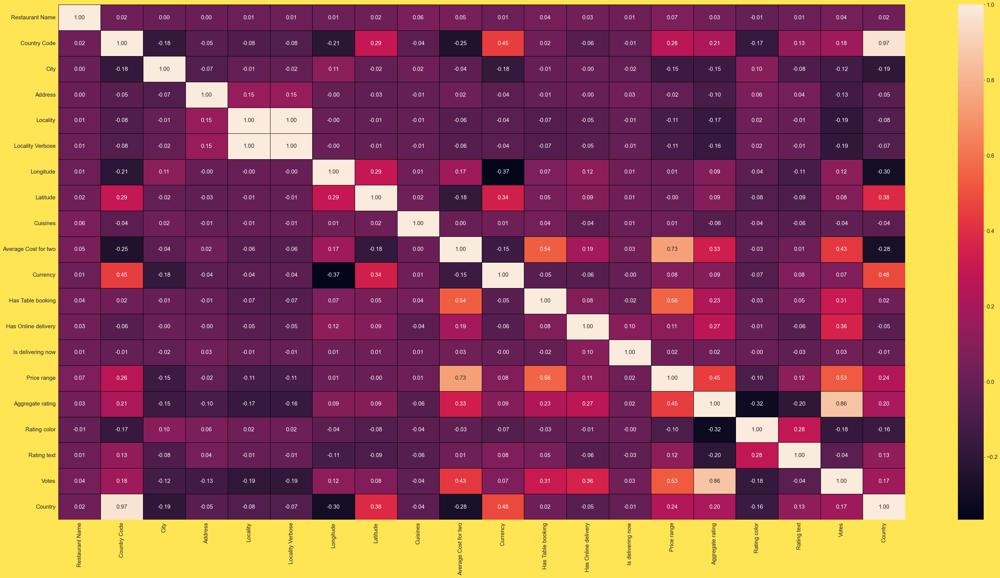

In [73]:
# Now let's plot the heatmap
plt.figure(figsize=(50,25))
sns.heatmap(price_range_df.corr(),annot=True,linewidths=0.5,linecolor='black',fmt='.2f')

In [ ]:
# checking the correlation with respect to the target


In [74]:
price_range_df.corr()['Price range'].sort_values()

City                   -0.145719
Locality               -0.114817
Locality Verbose       -0.111872
Rating color           -0.096374
Address                -0.021549
Latitude               -0.002439
Longitude               0.005374
Cuisines                0.010874
Is delivering now       0.016481
Restaurant Name         0.067217
Currency                0.077260
Has Online delivery     0.114600
Rating text             0.120186
Country                 0.236200
Country Code            0.259616
Aggregate rating        0.447102
Votes                   0.528076
Has Table booking       0.555907
Average Cost for two    0.733156
Price range             1.000000
Name: Price range, dtype: float64

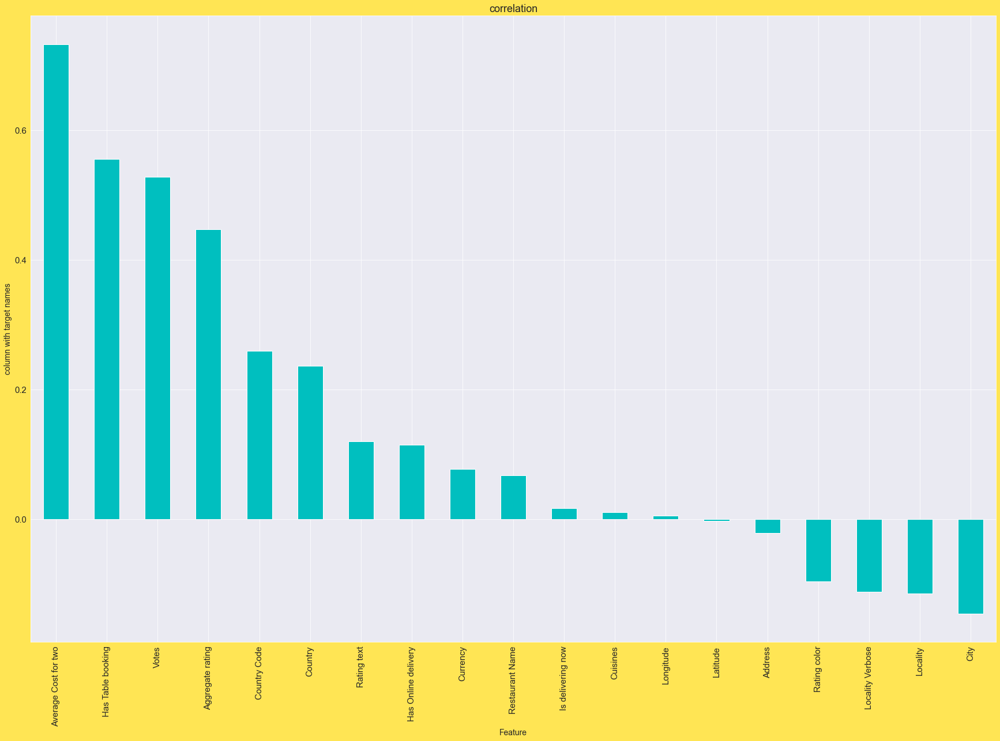

In [76]:
# plotting the same using a barplot
plt.figure(figsize=(30,20))
price_range_df.corr()['Price range'].sort_values(ascending=False).drop(['Price range']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

Observations:-
    
Latitude has a negative correlation of 16% with the target column(being considered) which can be considered as fair bond

Rating color has a negative correlation of 14% with the target column(being considered) which can be considered as fair bond

Restaurant ID has a negative correlation of 13% with the target column(being considered) which can be considered as fair bond

Locality has a negative correlation of 11% with the target column(being considered) which can be considered as fair bond

Locality Verbose has a negative correlation of 11% with the target column(being considered) which can be considered as fair bond

City has a negative correlation of 10% with the target column(being considered) which can be considered as fair bond

Longitude has a negative correlation of 8% with the target column(being considered) which can be considered as poor bond

Address has a negative correlation of 3% with the target column(being considered) which can be considered as poor bond

Cuisines has a negative correlation of 0% with the target column(being considered) which can be considered as NO BOND bond

Is delivering now has a positive correlation of 1% with the target column(being considered) which can be considered as weak bond

Restaurant Name has a positive correlation of 6% with the target column(being considered) which can be considered as fair bond

Average Cost for two has a positive correlation of 7% with the target column(being considered) which can be considered as fair bond

Currency has a positive correlation of 8% with the target column(being considered) which can be considered as weak bond

Has Online delivery has a positive correlation of 7% with the target column(being considered) which can be considered as weak bond

Rating text positive correlation of 16% with the target column(being considered) which can be considered as fair

Country positive correlation of 17% with the target column(being considered) which can be considered as fair bond

Country Code positive correlation of 24% with the target column(being considered) which can be considered as good bond

Votes positive correlation of 31% with the target column(being considered) which can be considered as good bond

Aggregate rating positive correlation of 44% with the target column(being considered) which can be considered as good bond

Has Table booking positive correlation of 50% with the target column(being considered) which can be considered as good bond

Switch to order menu has NO CORRELATION AT ALL

## Seperating the features and target

In [77]:
x = price_range_df.drop(['Price range'],axis=1)
y = price_range_df['Price range']

## Scaling the features

In [78]:
# inorder to check the multicollinearity we have to scale the data
# importing StandardScaler
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x = pd.DataFrame(sc.fit_transform(x),columns=x.columns)

# Checking Multicolllinearity

In [79]:
# importing vif 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [80]:
def vif_calc():
    vif=pd.DataFrame()
    vif["vif_Features"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    vif["Features"]=x.columns
    return vif

In [81]:
vif_calc()

# We have got high vif score in Temperature,Pressure and LocationPerthAirport columns
# lets drop the highest vif scores one by one and check if the score is reducoing

,vif_Features,Features
0,1.008611,Restaurant Name
1,45.141604,Country Code
2,1.112551,City
3,1.060407,Address
4,606.372760,Locality
5,606.332408,Locality Verbose
6,3.700696,Longitude
7,3.906724,Latitude
8,1.027047,Cuisines
9,2.036958,Average Cost for two


In [82]:
# We can see that CountryCode, Locality, Locality Verbose and Country column are having high vif score
# And they were highly skewed and least correlated with the target
# So let's drop these columns
x.drop(['Country Code','Locality','Locality Verbose','Country'],axis=1,inplace=True)

In [83]:
# lets check again
vif_calc()

# We can see that multicollinearity is resolved

,vif_Features,Features
0,1.007728,Restaurant Name
1,1.085945,City
2,1.040691,Address
3,1.613455,Longitude
4,1.663669,Latitude
5,1.024503,Cuisines
6,1.846557,Average Cost for two
7,1.648828,Currency
8,1.507968,Has Table booking
9,1.205414,Has Online delivery


## Model Building

In [84]:
# importing all the necessary models and metrics
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import SGDClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,ExtraTreesClassifier


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [85]:
# Creating instances for models
lor = LogisticRegression()
svc = SVC()
dtc = DecisionTreeClassifier()
knc = KNeighborsClassifier()
sgdc = SGDClassifier()
xgbc = XGBClassifier()
rfc = RandomForestClassifier()
abc = AdaBoostClassifier()
gbc = GradientBoostingClassifier()
etc = ExtraTreesClassifier()

In [86]:
# finding the best random state for logistic regression
lor = LogisticRegression()
for i in range(0,500):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=i)
    lor.fit(x_train,y_train)
    pred_train = lor.predict(x_train)
    pred_test = lor.predict(x_test)
    if round(accuracy_score(y_train,pred_train)*100,1) == round(accuracy_score(y_test,pred_test)*100,1):
        print('At random state',i,'The model performs very well')
        print('At random state:-',i)
        print('Training accuracy score is ', round(accuracy_score(y_train,pred_train)*100,1))
        print('Testing accuracy score is ', round(accuracy_score(y_test,pred_test)*100,1), '\n\n')

At random state 17 The model performs very well
At random state:- 17
Training accuracy score is  86.2
Testing accuracy score is  86.2 


At random state 24 The model performs very well
At random state:- 24
Training accuracy score is  86.1
Testing accuracy score is  86.1 


At random state 26 The model performs very well
At random state:- 26
Training accuracy score is  86.1
Testing accuracy score is  86.1 


At random state 61 The model performs very well
At random state:- 61
Training accuracy score is  86.5
Testing accuracy score is  86.5 


At random state 93 The model performs very well
At random state:- 93
Training accuracy score is  86.0
Testing accuracy score is  86.0 


At random state 121 The model performs very well
At random state:- 121
Training accuracy score is  85.7
Testing accuracy score is  85.7 


At random state 135 The model performs very well
At random state:- 135
Training accuracy score is  86.3
Testing accuracy score is  86.3 


At random state 136 The model perform

In [87]:
# We have got 86.6  accuracy at random state 281
# At random state 281 the model performs well
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=281)

In [88]:
# Running the model with best random state
lor.fit(x_train,y_train)
pred_train_lor = lor.predict(x_train)
pred_test_lor = lor.predict(x_test)
print('Accuracy Score of lor: ',accuracy_score(y_test,pred_test_lor))
print('\n')
print('Confusion Matrix: ',confusion_matrix(y_test,pred_test_lor))
print('\n')
print('Classification Report: ',classification_report(y_test,pred_test_lor))


# getting 86% accuracy with logistic regression

Accuracy Score of lor:  0.8660068519223448


Confusion Matrix:  [[1273   70    0    0]
 [  55  732   41    0]
 [  10   99  208   16]
 [  13    6   42   62]]


Classification Report:                precision    recall  f1-score   support

           1       0.94      0.95      0.95      1343
           2       0.81      0.88      0.84       828
           3       0.71      0.62      0.67       333
           4       0.79      0.50      0.62       123

    accuracy                           0.87      2627
   macro avg       0.81      0.74      0.77      2627
weighted avg       0.86      0.87      0.86      2627



In [89]:
# lets check the cv score of lor
lss = accuracy_score(y_test,pred_test_lor) # creating an instance for acccuracy score
from sklearn.model_selection import cross_val_score
for j in range(5,10):
    lsscore = cross_val_score(lor,x,y,cv=j)
    print(lsscore)
    lsc = lsscore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',lsc*100)
    print('accuracy_score is:- ',lss*100)
    print('\n')
    
# We can see that the cv score is almost same as the accuracy score
# So our model is running well

[0.85787671 0.84180468 0.89149058 0.89263278 0.84922901]
At cv:-  5
Cross validation score is:-  86.6606753088255
accuracy_score is:-  86.60068519223448


[0.83082192 0.86232877 0.87594243 0.88759424 0.89239205 0.82933516]
At cv:-  6
Cross validation score is:-  86.30690940501565
accuracy_score is:-  86.60068519223448


[0.81534772 0.84892086 0.86250999 0.90007994 0.88489209 0.88968825
 0.8088    ]
At cv:-  7
Cross validation score is:-  85.86055498458374
accuracy_score is:-  86.60068519223448


[0.83105023 0.85114155 0.85570776 0.89041096 0.89305302 0.89579525
 0.86928702 0.79067642]
At cv:-  8
Cross validation score is:-  85.96402753082401
accuracy_score is:-  86.60068519223448


[0.82014388 0.87667009 0.85303186 0.86742035 0.91572456 0.87564234
 0.90544707 0.85611511 0.77777778]
At cv:-  9
Cross validation score is:-  86.0885894459036
accuracy_score is:-  86.60068519223448




In [90]:
# selecting cv = 6
lsscore_selected = cross_val_score(lor,x,y,cv=6).mean()
print('The cv score of logistcic Regression is ',lsscore_selected,'\nThe accuracy score of logistic regression is: ',lss)

# Accuracy is  86% for LOR

The cv score of logistcic Regression is  0.8630690940501564 
The accuracy score of logistic regression is:  0.8660068519223448


## DecisionTreeClassifier

In [91]:
# creating a parameter grid to search best parameter using GridSearchCV
paramgrid_dtc = {'criterion':["gini", "entropy", "log_loss"],'splitter':["best", "random"],'min_samples_split':[2,3,4,5,6,7,8],'min_samples_leaf':[0.5,1,1.5,2,2.5,3,3.5,4]}
print(paramgrid_dtc)

{'criterion': ['gini', 'entropy', 'log_loss'], 'splitter': ['best', 'random'], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8], 'min_samples_leaf': [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]}


In [92]:
dtc_search = GridSearchCV(dtc,param_grid=paramgrid_dtc,error_score='raise')

In [93]:
# fitting the GRid to training data
dtc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'min_samples_leaf': [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4],
                         'min_samples_split': [2, 3, 4, 5, 6, 7, 8],
                         'splitter': ['best', 'random']})

In [94]:
print(dtc_search.best_score_) # bestscore
print(dtc_search.best_estimator_)
print(dtc_search.best_params_) # best params 

0.9792788893697771
DecisionTreeClassifier(criterion='log_loss', min_samples_leaf=2,
                       min_samples_split=3)
{'criterion': 'log_loss', 'min_samples_leaf': 2, 'min_samples_split': 3, 'splitter': 'best'}


In [96]:
# running the model using best parameters
dtc = DecisionTreeClassifier(criterion='log_loss',splitter='best',min_samples_leaf=1,min_samples_split=3) 
# using the best parameters
dtc.fit(x_train,y_train)
pred_dtc_test= dtc.predict(x_test)
pred_dtc_train = dtc.predict(x_train)
print('Training score of dtc',accuracy_score(pred_dtc_train,y_train))
print('Accuracy Score of dtc',accuracy_score(pred_dtc_test,y_test))
print('Confusion Matrix of dtc',confusion_matrix(pred_dtc_test,y_test))
print('Classification report of Dtc',classification_report(pred_dtc_test,y_test))
print('\n')


# getting 98% with dtc

Training score of dtc 0.9995105237395986
Accuracy Score of dtc 0.9824895317853064
Confusion Matrix of dtc [[1339    5    0    0]
 [   4  813    8    0]
 [   0    9  316   10]
 [   0    1    9  113]]
Classification report of Dtc               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1344
           2       0.98      0.99      0.98       825
           3       0.95      0.94      0.95       335
           4       0.92      0.92      0.92       123

    accuracy                           0.98      2627
   macro avg       0.96      0.96      0.96      2627
weighted avg       0.98      0.98      0.98      2627





In [99]:
# Checking the cross validation of dtc
dtca = accuracy_score(pred_dtc_test,y_test)
for j in range(5,15):
    dtcscore = cross_val_score(dtc,x,y,cv=j)
    print(dtcscore)
    dsc = dtcscore.mean()
    print('At cv:- ',j)
    print('Cross validation score of DTC is:- ',dsc*100)
    print('accuracy_score of DTC is:- ',dtca*100)
    print('\n')

[0.89554795 0.9748715  0.99714449 0.99828669 0.88520845]
At cv:-  5
Cross validation score of DTC is:-  95.02118163397824
accuracy_score of DTC is:-  98.24895317853064


[0.82328767 0.96780822 0.98560658 0.9993146  0.9986292  0.86291981]
At cv:-  6
Cross validation score of DTC is:-  93.95943459115364
accuracy_score of DTC is:-  98.24895317853064


[0.813749   0.97282174 0.97202238 1.         1.         0.99840128
 0.84      ]
At cv:-  7
Cross validation score of DTC is:-  94.24277720680598
accuracy_score of DTC is:-  98.24895317853064


[0.79452055 0.96164384 0.94794521 0.99817352 0.99817185 0.99908592
 0.99725777 0.81627057]
At cv:-  8
Cross validation score of DTC is:-  93.91336513819672
accuracy_score of DTC is:-  98.24895317853064


[0.77389517 0.96402878 0.95683453 0.98047276 0.99897225 0.9979445
 0.9979445  0.99280576 0.7808642 ]
At cv:-  9
Cross validation score of DTC is:-  93.81958278174639
accuracy_score of DTC is:-  98.24895317853064


[0.75228311 0.9543379  0.96917808 0.96

In [100]:
# the cv score at 5 and accuracy score is almost same, so we can say that the model is working well
# cv= 5 for DecisionTree
dtcscore_selected = cross_val_score(dtc,x,y,cv=5).mean()
print('The cv score of DecisionTree is ',dtcscore_selected,'\nThe accuracy score of DecisionTree is: ',dtca)

# DTC =  98%

The cv score of DecisionTree is  0.9458742427679943 
The accuracy score of DecisionTree is:  0.9824895317853064


## SupportVectorClassifier

In [104]:
# Creating parameter grid for  SVC
paramgrid_svc = {'C':[0.1,0.2,0.3],
                 'kernel':['rbf','poly','sigmoid'],
                 'degree':[3,4,5,6],'gamma':['scale','auto'],'decision_function_shape':['ovo','ovr']}
print(paramgrid_svc)

{'C': [0.1, 0.2, 0.3], 'kernel': ['rbf', 'poly', 'sigmoid'], 'degree': [3, 4, 5, 6], 'gamma': ['scale', 'auto'], 'decision_function_shape': ['ovo', 'ovr']}


In [105]:
svc_search = GridSearchCV(svc,param_grid=paramgrid_svc,error_score='raise')

In [106]:
svc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=SVC(),
             param_grid={'C': [0.1, 0.2, 0.3],
                         'decision_function_shape': ['ovo', 'ovr'],
                         'degree': [3, 4, 5, 6], 'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']})

In [109]:
print(svc_search.best_score_)
print(svc_search.best_estimator_)
print(svc_search.best_params_) # best params

0.8786091820088557
SVC(C=0.3, decision_function_shape='ovo')
{'C': 0.3, 'decision_function_shape': 'ovo', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf'}


In [110]:
# running the model using the best params
svc = SVC(C=1.5,degree=3,gamma='scale',kernel='rbf',cache_size=150,decision_function_shape='ovo',shrinking=True) # using the best parameters
svc.fit(x_train,y_train)
pred_svc_test= svc.predict(x_test)
pred_svc_train = svc.predict(x_train)
print('Training score of svc',accuracy_score(pred_svc_train,y_train))
print('Accuracy Score of svc',accuracy_score(pred_svc_test,y_test))
print('Confusion Matrix of svc',confusion_matrix(pred_svc_test,y_test))
print('Classification report of svc',classification_report(pred_svc_test,y_test))
print('\n')

# We are getting around 94% accuracy with SVC

Training score of svc 0.964431391744167
Accuracy Score of svc 0.9425199847735058
Confusion Matrix of svc [[1300    9    0    0]
 [  42  796   30    2]
 [   1   21  293   34]
 [   0    2   10   87]]
Classification report of svc               precision    recall  f1-score   support

           1       0.97      0.99      0.98      1309
           2       0.96      0.91      0.94       870
           3       0.88      0.84      0.86       349
           4       0.71      0.88      0.78        99

    accuracy                           0.94      2627
   macro avg       0.88      0.91      0.89      2627
weighted avg       0.94      0.94      0.94      2627





In [111]:
# checking the cv score for SVC
svca = accuracy_score(y_test,pred_svc_test) 
for j in range(5,10):
    svccore = cross_val_score(svc,x,y,cv=j)
    print(svccore)
    svcc = svccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',svcc*100)
    print('accuracy_score is:- ',svca*100)
    print('\n') # cv and accuracy is almost same

[0.82762557 0.91890348 0.96858938 0.97087379 0.89206168]
At cv:-  5
Cross validation score is:-  91.56107794893458
accuracy_score is:-  94.25199847735058


[0.80136986 0.91575342 0.94585332 0.96504455 0.97395476 0.87731323]
At cv:-  6
Cross validation score is:-  91.32148591172412
accuracy_score is:-  94.25199847735058


[0.81294964 0.91207034 0.9352518  0.97122302 0.95603517 0.97521982
 0.864     ]
At cv:-  7
Cross validation score is:-  91.8107114308553
accuracy_score is:-  94.25199847735058


[0.78995434 0.90593607 0.92054795 0.95616438 0.97440585 0.96160878
 0.96252285 0.85557587]
At cv:-  8
Cross validation score is:-  91.58395106558814
accuracy_score is:-  94.25199847735058


[0.76772867 0.91675231 0.90853032 0.94141829 0.97225077 0.96197328
 0.97533402 0.96300103 0.8436214 ]
At cv:-  9
Cross validation score is:-  91.6734454881715
accuracy_score is:-  94.25199847735058




In [112]:
# selecting cv = 7
svcscore_selected = cross_val_score(svc,x,y,cv=7).mean()
print('The cv score of SVC is ',svcscore_selected,'\nThe accuracy score of SVC is: ',svca)


# 94% from SVC

The cv score of SVC is  0.9181071143085531 
The accuracy score of SVC is:  0.9425199847735058


## KNeighborsClassifier

In [113]:
# paragrid for KNC
paramgrid_knc = {'n_neighbors':[x for x in range(5,10)],'algorithm':['auto','ball_tree','kd_tree'],
                 'leaf_size':[l for l in range(30,36)],'p':[2,3,4,6]}
# writing a list comprehension for leaf_size and n_neighbors instead of writing all the values

In [114]:
knc_search = GridSearchCV(knc,param_grid=paramgrid_knc)

In [115]:
knc_search.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                         'leaf_size': [30, 31, 32, 33, 34, 35],
                         'n_neighbors': [5, 6, 7, 8, 9], 'p': [2, 3, 4, 6]})

In [116]:
# getting the best params and score
print(knc_search.best_score_)
print(knc_search.best_estimator_)
print(knc_search.best_params_)

0.7846314878316744
KNeighborsClassifier()
{'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 5, 'p': 2}


In [119]:
# running the model using the best params
knc = KNeighborsClassifier(algorithm='auto',leaf_size=30,n_neighbors=6,p=2) # using the best parameters
knc.fit(x_train,y_train)
pred_knc_test= knc.predict(x_test)
pred_knc_train = knc.predict(x_train)
print('Training score of knc: ',accuracy_score(pred_knc_train,y_train))
print('Accuracy Score of knc: ',accuracy_score(pred_knc_test,y_test))
print('Confusion Matrix of knc: ',confusion_matrix(pred_knc_test,y_test))
print('Classification report of knc: ',classification_report(pred_knc_test,y_test))
print('\n')

# getting 80% accuracy

Training score of knc:  0.8542992331538587
Accuracy Score of knc:  0.8047202131709174
Confusion Matrix of knc:  [[1257  172    2    2]
 [  86  603  124    7]
 [   0   51  196   56]
 [   0    2   11   58]]
Classification report of knc:                precision    recall  f1-score   support

           1       0.94      0.88      0.91      1433
           2       0.73      0.74      0.73       820
           3       0.59      0.65      0.62       303
           4       0.47      0.82      0.60        71

    accuracy                           0.80      2627
   macro avg       0.68      0.77      0.71      2627
weighted avg       0.82      0.80      0.81      2627





In [121]:
# checking the cv score
knca = accuracy_score(y_test,pred_knc_test) 
for j in range(10,15):
    knccore = cross_val_score(knc,x,y,cv=j)
    print(knccore)
    kncc = knccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',kncc*100)
    print('accuracy_score is:- ',knca*100)
    print('\n') # cv and accuracy is almost same

[0.61757991 0.7260274  0.75913242 0.80022831 0.84360731 0.84018265
 0.824      0.85028571 0.78628571 0.66285714]
At cv:-  10
Cross validation score is:-  77.10186562296151
accuracy_score is:-  80.47202131709173


[0.60427136 0.72613065 0.73115578 0.76005025 0.82286432 0.85175879
 0.82663317 0.83165829 0.84296482 0.79020101 0.65577889]
At cv:-  11
Cross validation score is:-  76.75879396984925
accuracy_score is:-  80.47202131709173


[0.60958904 0.71506849 0.69863014 0.75890411 0.79726027 0.85616438
 0.83835616 0.83424658 0.84773663 0.8436214  0.76817558 0.66941015]
At cv:-  12
Cross validation score is:-  76.97635780546315
accuracy_score is:-  80.47202131709173


[0.58753709 0.70474777 0.71364985 0.75964392 0.79080119 0.83531157
 0.84124629 0.84546805 0.82020802 0.85289747 0.83358098 0.76225854
 0.66864785]
At cv:-  13
Cross validation score is:-  77.04614312852371
accuracy_score is:-  80.47202131709173


[0.5798722  0.69648562 0.7172524  0.74121406 0.77795527 0.81629393
 0.856      0.

In [122]:
# selecting cv = 10 and we are getting accuracy and cv score almost same , which means our model is working well
kncscore_selected = cross_val_score(knc,x,y,cv=10).mean()
print('The cv score of KNeighborsC is ',kncscore_selected,'\nThe accuracy score of KNeighborsC is: ',knca)

# 80% accuracy from KNeighborsC

The cv score of KNeighborsC is  0.7710186562296151 
The accuracy score of KNeighborsC is:  0.8047202131709174


## SGDClassifier

In [123]:
parametergrid_sgdc = {'loss':['hinge','log_loss','log','modified_huber','squared_hinge'],
                     'penalty':['l2','l1','elasticnet'],'alpha':[0.1,.001,0.0001,1,10]}

In [124]:
sgdc_search = GridSearchCV(sgdc,param_grid=parametergrid_sgdc)

In [125]:
# fitting the cv to train data
sgdc_search.fit(x_train,y_train)

GridSearchCV(estimator=SGDClassifier(),
             param_grid={'alpha': [0.1, 0.001, 0.0001, 1, 10],
                         'loss': ['hinge', 'log_loss', 'log', 'modified_huber',
                                  'squared_hinge'],
                         'penalty': ['l2', 'l1', 'elasticnet']})

In [126]:
# getting best prams 
print(sgdc_search.best_score_)
print(sgdc_search.best_estimator_)
print(sgdc_search.best_params_)

0.8273770349901787
SGDClassifier(alpha=0.001, penalty='l1')
{'alpha': 0.001, 'loss': 'hinge', 'penalty': 'l1'}


In [140]:
# running the model using the best params
sgdc = SGDClassifier(alpha=0.001,loss='hinge',max_iter=1400,penalty='l1',l1_ratio=0.15) # using the best parameters
sgdc.fit(x_train,y_train)
pred_sgdc_test= sgdc.predict(x_test)
pred_sgdc_train = sgdc.predict(x_train)
print('Training score of SGDClassifier: ',accuracy_score(pred_sgdc_train,y_train))
print('Accuracy Score of SGDClassifier: ',accuracy_score(pred_sgdc_test,y_test))
print('Confusion Matrix of SGDClassifier: ',confusion_matrix(pred_sgdc_test,y_test))
print('Classification report of SGDClassifier: ',classification_report(pred_sgdc_test,y_test))
print('\n')

# sgdc is giving  82%

Training score of SGDClassifier:  0.8255832925436449
Accuracy Score of SGDClassifier:  0.8275599543205177
Confusion Matrix of SGDClassifier:  [[1300   91   13   13]
 [  40  668  144   40]
 [   3   69  176   40]
 [   0    0    0   30]]
Classification report of SGDClassifier:                precision    recall  f1-score   support

           1       0.97      0.92      0.94      1417
           2       0.81      0.75      0.78       892
           3       0.53      0.61      0.57       288
           4       0.24      1.00      0.39        30

    accuracy                           0.83      2627
   macro avg       0.64      0.82      0.67      2627
weighted avg       0.86      0.83      0.84      2627





In [141]:
# checking the cv score
sgdca = accuracy_score(y_test,pred_sgdc_test) 
for j in range(5,11):
    sgdccore = cross_val_score(sgdc,x,y,cv=j)
    print(sgdccore)
    sgdcc = sgdccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',sgdcc*100)
    print('accuracy_score is:- ',sgdca*100)
    print('\n') # cv and accuracy is almost same

[0.82077626 0.77612793 0.83038264 0.85094232 0.80582524]
At cv:-  5
Cross validation score is:-  81.68108764984915
accuracy_score is:-  82.75599543205176


[0.80342466 0.78219178 0.82727896 0.83824537 0.8574366  0.78958191]
At cv:-  6
Cross validation score is:-  81.63598793193562
accuracy_score is:-  82.75599543205176


[0.79296563 0.79056755 0.78097522 0.8361311  0.83053557 0.86250999
 0.776     ]
At cv:-  7
Cross validation score is:-  80.99550074226333
accuracy_score is:-  82.75599543205176


[0.77260274 0.8        0.7543379  0.83652968 0.82998172 0.86471664
 0.8345521  0.75319927]
At cv:-  8
Cross validation score is:-  80.57400056764585
accuracy_score is:-  82.75599543205176


[0.75642343 0.84378212 0.76978417 0.80883864 0.83556012 0.82219938
 0.87358684 0.82528263 0.74279835]
At cv:-  9
Cross validation score is:-  80.86950780351614
accuracy_score is:-  82.75599543205176


[0.74315068 0.82990868 0.78767123 0.78310502 0.8413242  0.84589041
 0.83314286 0.86628571 0.81828571 0.7234

In [142]:
# selecting cv = 7
sgdcscore_selected = cross_val_score(sgdc,x,y,cv=7).mean()
print('The cv score of SGDClassifier is ',sgdcscore_selected,'\nThe accuracy score of SGDClassifier is: ',sgdca)

# % with sgdc and cv score is almost same so our model is working well
# getting 82% accuracy after cv

The cv score of SGDClassifier is  0.810639442731529 
The accuracy score of SGDClassifier is:  0.8275599543205177


# Ensemeble Methods

## RandomForestClassifier

In [149]:
# framing the parameters
# no of trees in random forest
n_estimators = [int(x) for x in range(100,200,50)]

# method of measuring the quality of split 
criterion = ['gini','entropy','log_loss']

# features to consider for best split
max_features = ["sqrt", "log2", None]

# max depth of the tree
max_depth = [2,4,6]

min_samples_split = [2,5,7,3,4]

min_samples_leaf = [2,3,4,5]

class_weight = ["balanced", "balanced_subsample"]

bootstrap = [True,False]

In [150]:
# creating the paramgrid
param_grid = {'n_estimators':n_estimators,
             'criterion':criterion,
             'max_features':max_features,
             'max_depth':max_depth}
print(param_grid)

{'n_estimators': [100, 150], 'criterion': ['gini', 'entropy', 'log_loss'], 'max_features': ['sqrt', 'log2', None], 'max_depth': [2, 4, 6]}


In [151]:
rfc_search = GridSearchCV(rfc,param_grid=param_grid,error_score='raise')

In [152]:
rfc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [2, 4, 6],
                         'max_features': ['sqrt', 'log2', None],
                         'n_estimators': [100, 150]})

In [153]:
print(rfc_search.best_score_)
print(rfc_search.best_estimator_)
print(rfc_search.best_params_) # we got the best score and best params

0.9778096347837668
RandomForestClassifier(max_depth=6, max_features=None)
{'criterion': 'gini', 'max_depth': 6, 'max_features': None, 'n_estimators': 100}


In [155]:
# running the model using the best params
rfc = RandomForestClassifier(criterion='gini',max_depth=6, max_features=None,n_estimators=100,bootstrap=True,class_weight='balanced_subsample') # using the best parameters
rfc.fit(x_train,y_train)
pred_rfc_test= rfc.predict(x_test)
pred_rfc_train = rfc.predict(x_train)

print('Training score of RandomForestClassifier: ',accuracy_score(pred_rfc_train,y_train))
print('Accuracy Score of RandomForestClassifier: ',accuracy_score(pred_rfc_test,y_test))
print('Confusion Matrix of RandomForestClassifier: ',confusion_matrix(pred_rfc_test,y_test))
print('Classification report of RandomForestClassifier: ',classification_report(pred_rfc_test,y_test))
print('\n')

# getting 97% accuracy

Training score of RandomForestClassifier:  0.9877630934899657
Accuracy Score of RandomForestClassifier:  0.9790635706128664
Confusion Matrix of RandomForestClassifier:  [[1339    5    0    0]
 [   3  808    9    2]
 [   1   12  312    8]
 [   0    3   12  113]]
Classification report of RandomForestClassifier:                precision    recall  f1-score   support

           1       1.00      1.00      1.00      1344
           2       0.98      0.98      0.98       822
           3       0.94      0.94      0.94       333
           4       0.92      0.88      0.90       128

    accuracy                           0.98      2627
   macro avg       0.96      0.95      0.95      2627
weighted avg       0.98      0.98      0.98      2627





In [157]:
# checking the cv score
rfca = accuracy_score(y_test,pred_rfc_test) 
for j in range(10,16):
    rfccore = cross_val_score(rfc,x,y,cv=j)
    print(rfccore)
    rfcc = rfccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',rfcc*100)
    print('accuracy_score is:- ',rfca*100)
    print('\n') # cv and accuracy is almost same

[0.74543379 0.96461187 0.95205479 0.97945205 0.99885845 0.99771689
 0.99885714 0.99771429 0.992      0.79314286]
At cv:-  10
Cross validation score is:-  94.19842139595566
accuracy_score is:-  97.90635706128664


[0.78266332 0.95854271 0.94221106 0.96984925 0.99497487 0.99874372
 0.99874372 1.         0.99748744 0.98492462 0.7839196 ]
At cv:-  11
Cross validation score is:-  94.65509365006852
accuracy_score is:-  97.90635706128664


[0.78082192 0.94657534 0.9630137  0.9630137  0.98082192 1.
 0.99863014 0.99863014 0.99862826 0.99862826 0.98216735 0.76268861]
At cv:-  12
Cross validation score is:-  94.78016110140244
accuracy_score is:-  97.90635706128664


[0.76261128 0.9421365  0.99703264 0.94807122 0.97181009 0.99406528
 0.99851632 1.         0.99851412 0.99851412 0.99851412 0.97771174
 0.7473997 ]
At cv:-  13
Cross validation score is:-  94.88382394189688
accuracy_score is:-  97.90635706128664


[0.7428115  0.94249201 0.98242812 0.92492013 0.96485623 0.99041534
 1.         0.9984    

In [158]:
# selecting cv = 13
# we are getting the cv score and accuracy almost same so our model is working well
rfcscore_selected = cross_val_score(rfc,x,y,cv=13).mean()
print('The cv score of RandomForestClassifier is ',rfcscore_selected,'\nThe accuracy score of RandomForestClassifier is: ',rfca)
# getting 97% with rfc

The cv score of RandomForestClassifier is  0.9490666673902197 
The accuracy score of RandomForestClassifier is:  0.9790635706128664


## AdaBoostClassifier

In [159]:
parametergrid_abc = {'n_estimators':[x for x in range(50,61)],'algorithm':['SAMME','SAMME.R'],'learning_rate':[0.5,1.0,1.5]}

In [160]:
abc_search = GridSearchCV(abc,param_grid=parametergrid_abc,error_score='raise')

In [161]:
abc_search.fit(x_train,y_train)

GridSearchCV(error_score='raise', estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.5, 1.0, 1.5],
                         'n_estimators': [50, 51, 52, 53, 54, 55, 56, 57, 58,
                                          59, 60]})

In [162]:
print(abc_search.best_score_)
print(abc_search.best_estimator_)
print(abc_search.best_params_) # we got the best score and best params

0.9593727735792523
AdaBoostClassifier(algorithm='SAMME', n_estimators=60)
{'algorithm': 'SAMME', 'learning_rate': 1.0, 'n_estimators': 60}


In [164]:
# running the model using the best params
abc = AdaBoostClassifier(algorithm='SAMME',learning_rate=1.0,n_estimators=60) # using the best parameters
abc.fit(x_train,y_train)
pred_abc_test= abc.predict(x_test)
pred_abc_train = abc.predict(x_train)
print('Training score of AdaBoostClassifier: ',accuracy_score(pred_abc_train,y_train))
print('Accuracy Score of AdaBoostClassifier: ',accuracy_score(pred_abc_test,y_test))
print('Confusion Matrix of AdaBoostClassifier: ',confusion_matrix(pred_abc_test,y_test))
print('Classification report of AdaBoostClassifier: ',classification_report(pred_abc_test,y_test))
print('\n')

# we are getting 95% accuracy with AdaBoostClassifier

Training score of AdaBoostClassifier:  0.9627998042094958
Accuracy Score of AdaBoostClassifier:  0.9573658165207461
Confusion Matrix of AdaBoostClassifier:  [[1341   16    4   10]
 [   2  804   31    3]
 [   0    8  285   25]
 [   0    0   13   85]]
Classification report of AdaBoostClassifier:                precision    recall  f1-score   support

           1       1.00      0.98      0.99      1371
           2       0.97      0.96      0.96       840
           3       0.86      0.90      0.88       318
           4       0.69      0.87      0.77        98

    accuracy                           0.96      2627
   macro avg       0.88      0.92      0.90      2627
weighted avg       0.96      0.96      0.96      2627





In [165]:
# checking the cv score
abca = accuracy_score(y_test,pred_abc_test) 
for j in range(5,10):
    abccore = cross_val_score(abc,x,y,cv=j)
    print(abccore)
    abcc = abccore.mean()
    print('At cv:- ',j)
    print('Cross validation score is:- ',abcc*100)
    print('accuracy_score is:- ',abca*100)
    print('\n') # cv and accuracy is almost same

[0.8989726  0.96344946 1.         1.         0.87892633]
At cv:-  5
Cross validation score is:-  94.82696776010577
accuracy_score is:-  95.73658165207462


[0.82534247 0.97191781 0.98423578 1.         1.         0.854695  ]
At cv:-  6
Cross validation score is:-  93.93651747459478
accuracy_score is:-  95.73658165207462


[0.86490807 0.97282174 0.96722622 1.         1.         1.
 0.8304    ]
At cv:-  7
Cross validation score is:-  94.79080050245517
accuracy_score is:-  95.73658165207462


[0.77260274 0.96986301 0.95068493 1.         1.         0.99908592
 0.99634369 0.80987203]
At cv:-  8
Cross validation score is:-  93.73065412837146
accuracy_score is:-  95.73658165207462


[0.83967112 0.97225077 0.96094553 0.97636177 1.         0.99897225
 1.         0.98972251 0.79218107]
At cv:-  9
Cross validation score is:-  94.7789446279543
accuracy_score is:-  95.73658165207462




In [166]:
# selecting cv = 5
# we are getting cv score and accuracy almost same, so our model is working well 95%
abcscore_selected = cross_val_score(abc,x,y,cv=5).mean()
print('The cv score of AdaBoostClassifier is ',abcscore_selected,'\nThe accuracy score of AdaBoostClassifier is: ',abca)

The cv score of AdaBoostClassifier is  0.9482696776010577 
The accuracy score of AdaBoostClassifier is:  0.9573658165207461


## Model Selection

In [167]:
models = pd.DataFrame({'Model Name':['Logistic Regression','DecisionTreeClassifier','RandomForestClassifier','AdaBoostClassifier','KNeighborsClassifier','SGDClassifier','SupportVectorClassifier'],
                       'Accuracy':[lss,dtca,rfca,abca,knca,sgdca,svca],
                       'CV_Score':[lsscore_selected,dtcscore_selected,rfcscore_selected,abcscore_selected,kncscore_selected,sgdcscore_selected,svcscore_selected]})
models


# Selecting DecisionTreeClassifier as our best because the accuracy is high and the difference of cv score is also optimal

,Model Name,Accuracy,CV_Score
0,Logistic Regression,0.866007,0.863069
1,DecisionTreeClassifier,0.982490,0.945874
2,RandomForestClassifier,0.979064,0.949067
3,AdaBoostClassifier,0.957366,0.948270
4,KNeighborsClassifier,0.804720,0.771019
5,SGDClassifier,0.827560,0.810639
6,SupportVectorClassifier,0.942520,0.918107


## SAVING THE MODEL

In [169]:
import pickle
filename = 'pricerange.pred'
pickle.dump(dtc,open(filename,'wb'))

In [170]:
import numpy as np
a = np.array(y_test)
predicted = np.array(dtc.predict(x_test))
df_com = pd.DataFrame({'Original':a,'Predicted':predicted},index = range(len(a)))
df_com.sample(20)
# comparison of predicted and original target values

,Original,Predicted
2236,1,1
2286,2,2
1930,1,1
1168,3,3
2104,2,2
1762,3,3
614,1,1
609,1,1
1581,2,2
2257,3,3


_______________________________________________________________________________________________________________________________

In [171]:
# Now let's go ahead and create a Regression model for predicting the Average cost for two persons in a restaurant

In [219]:
avg_cost.head(10)

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines
5,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,1000,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336,Phillipines
6,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520,Phillipines
7,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",2000,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677,Phillipines
8,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",6000,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621,Phillipines
9,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532,Phillipines


In [221]:
conti_cols = avg_cost.dtypes[avg_cost.dtypes != 'object'].index.tolist()
conti_cols

['Country Code',
 'Longitude',
 'Latitude',
 'Average Cost for two',
 'Price range',
 'Aggregate rating',
 'Votes']

In [222]:
# removing 'Average Cost for two' from cont cols as it is our target
conti_cols.remove('Average Cost for two')

conti_cols

['Country Code',
 'Longitude',
 'Latitude',
 'Price range',
 'Aggregate rating',
 'Votes']

# Checking and Treating outliers


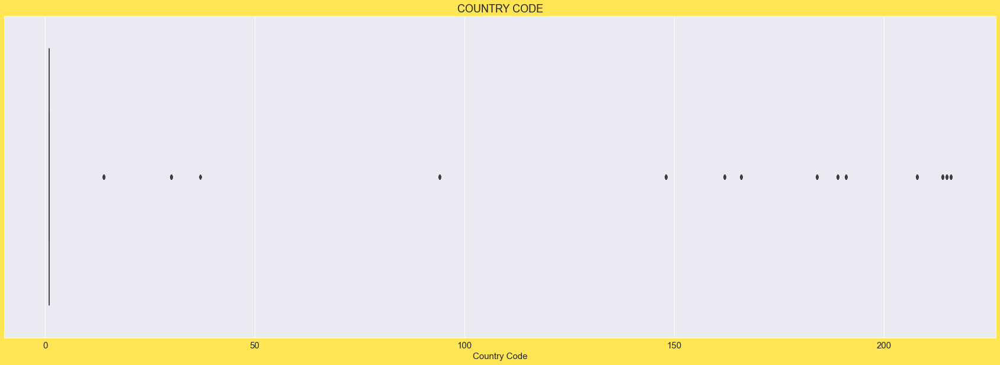

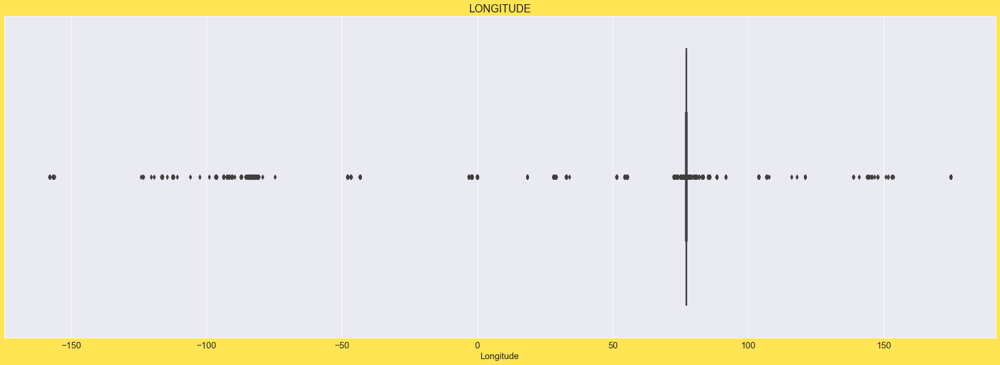

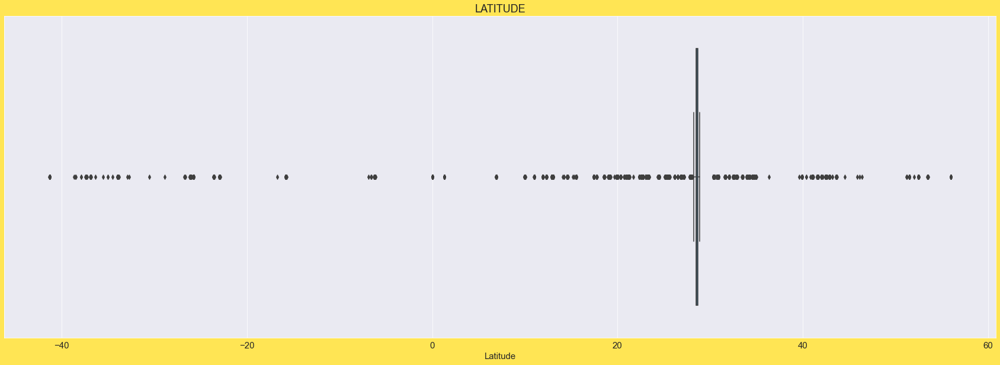

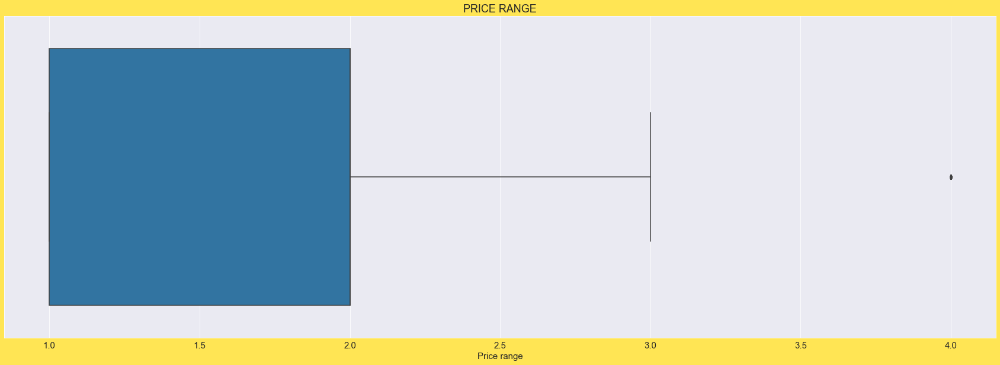

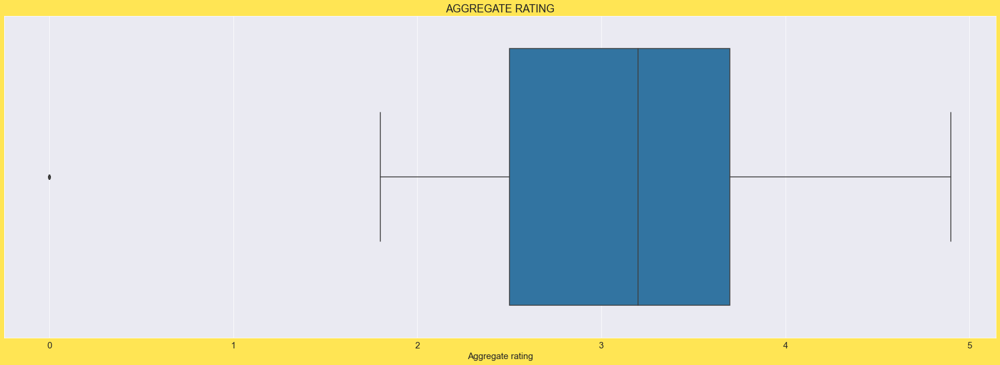

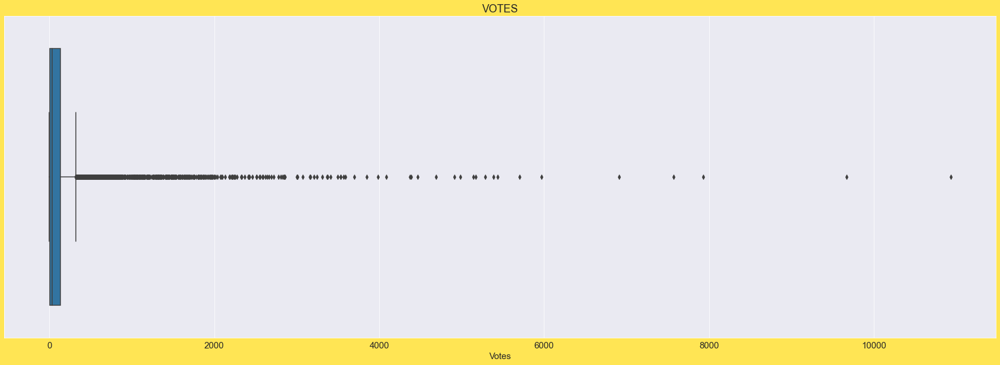

In [223]:
# plotting to see outliers
for i in conti_cols:
    plt.figure(figsize=(30,10))
    sns.boxplot(avg_cost[i])
    plt.title(i.upper())
    plt.show()
    

We can see there are so many outliers

In [224]:
# Removing the outliers using zscore method
# using zscore method
from scipy.stats import zscore

outlier_cols = avg_cost[conti_cols]

z=np.abs(zscore(outlier_cols))

print(np.where(z>3))

(array([  22,   23,   24, ..., 9548, 9549, 9550], dtype=int64), array([2, 2, 2, ..., 0, 0, 0], dtype=int64))


In [225]:
# removing outliers
avg_cost_df = avg_cost[(z<3).all(axis=1)]

In [226]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",avg_cost.shape)
print("shape after: ",avg_cost_df.shape)
print("Percentage Loss: ",(avg_cost.shape[0]-avg_cost_df.shape[0])/avg_cost.shape[0]*100)

# There is 8% data loss with zscore method

shape before and after
shape before:  (9551, 21)
shape after:  (8581, 21)
Percentage Loss:  10.15600460684745


In [227]:
# CHECKING WITH THE iqr method as well
Q1=outlier_cols.quantile(0.25)
Q3=outlier_cols.quantile(0.75)
IQR=Q3 - Q1

avg_cost_quant = avg_cost[~((avg_cost < (Q1 - 1.5 * IQR)) |(avg_cost > (Q3 + 1.5 * IQR))).any(axis=1)]

In [228]:
# checking the % of dataloss after removing the outliers

print("shape before and after")
print("shape before: ",avg_cost.shape)
print("shape after: ",avg_cost_quant.shape)
print("Percentage Loss: ",(avg_cost.shape[0]-avg_cost_quant.shape[0])/avg_cost.shape[0]*100)

# There is 46% data loss with IQR method
# So we choose zscore method

shape before and after
shape before:  (9551, 21)
shape after:  (4905, 21)
Percentage Loss:  48.644121034446655


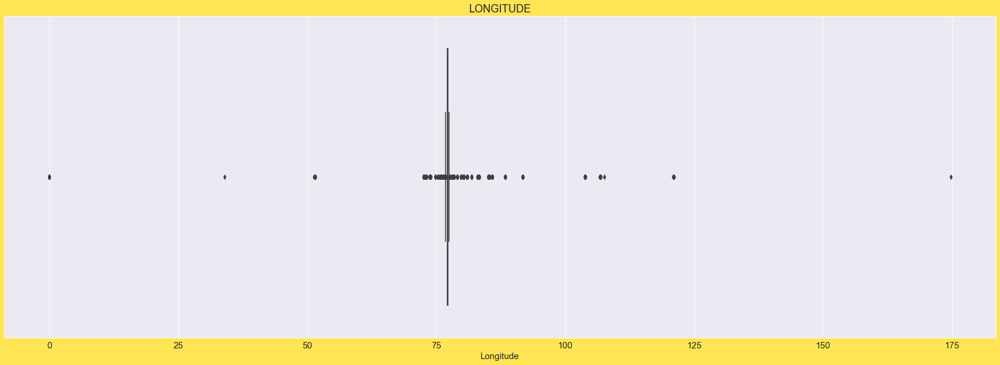

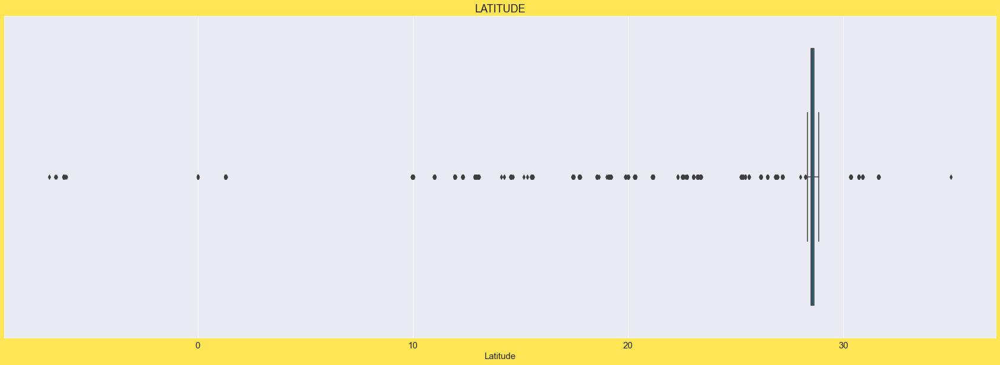

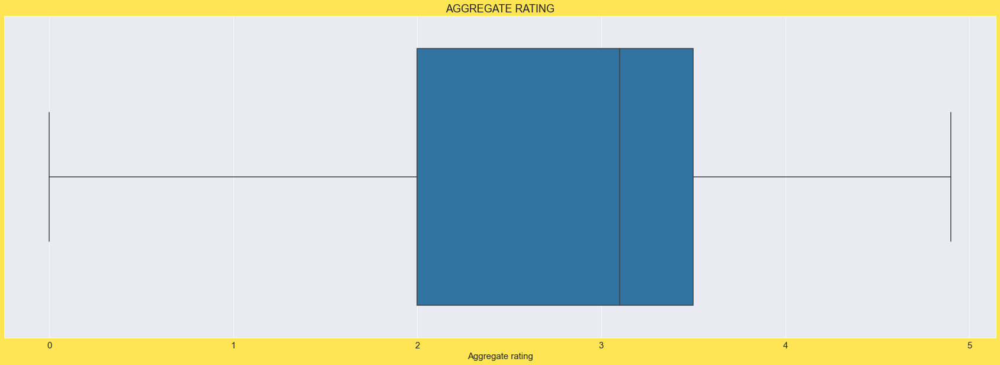

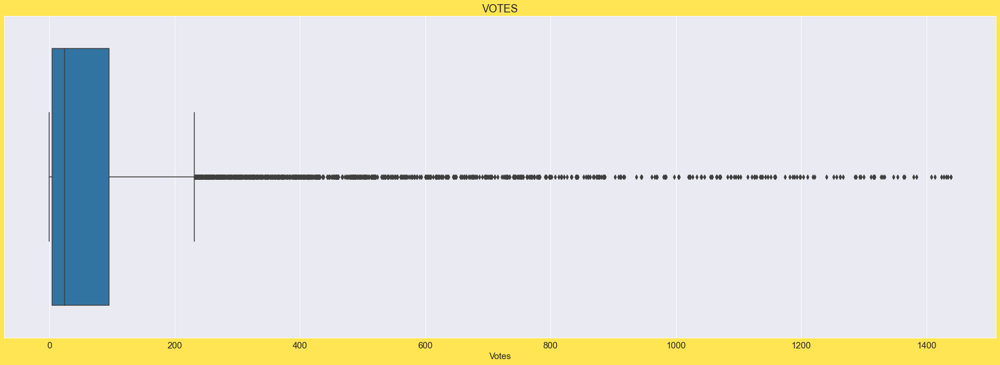

In [229]:
# plotting to see outliers again
for i in cont_cols:
    plt.figure(figsize=(30,10))
    sns.boxplot(avg_cost_df[i])
    plt.title(i.upper())
    plt.show()


We can see outliers have been removed

## Checking and Treating skewenss

In [230]:
avg_cost_df.skew().sort_values()

Longitude               -3.496889
Latitude                -3.149880
Aggregate rating        -0.878228
Price range              1.022024
Votes                    3.627893
Country Code            10.805559
Average Cost for two    36.956533
dtype: float64

In [231]:
# checking skewness of the continuous columns
avg_cost_df[conti_cols].skew().sort_values(ascending=False)

Country Code        10.805559
Votes                3.627893
Price range          1.022024
Aggregate rating    -0.878228
Latitude            -3.149880
Longitude           -3.496889
dtype: float64

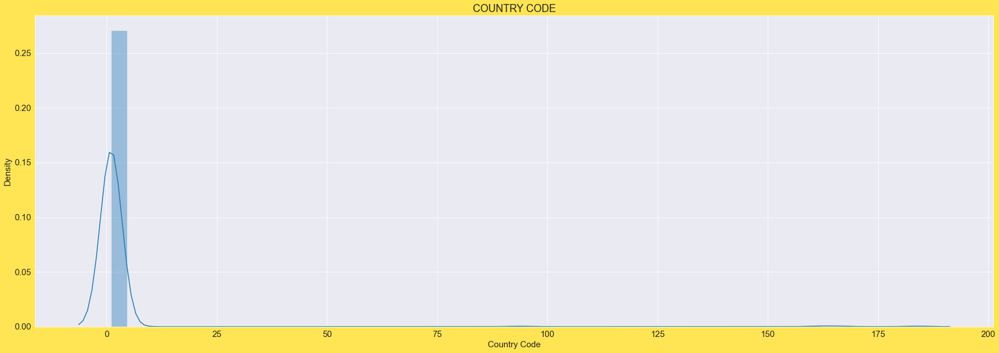

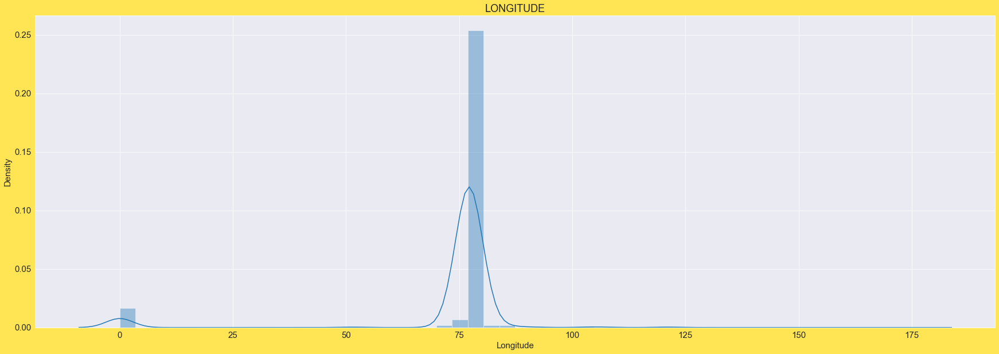

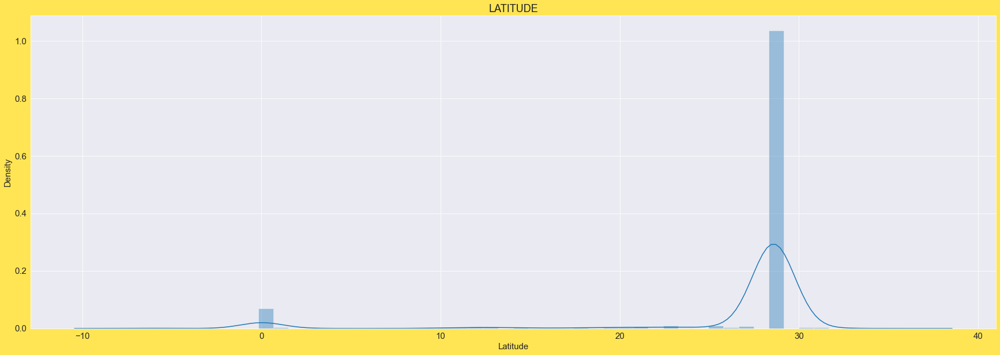

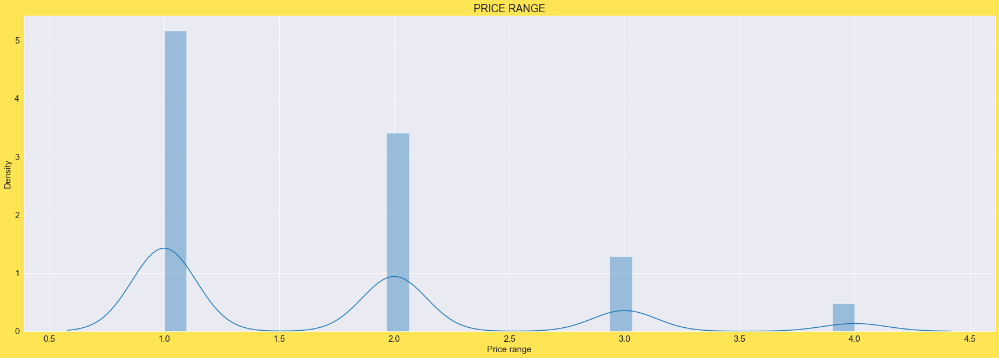

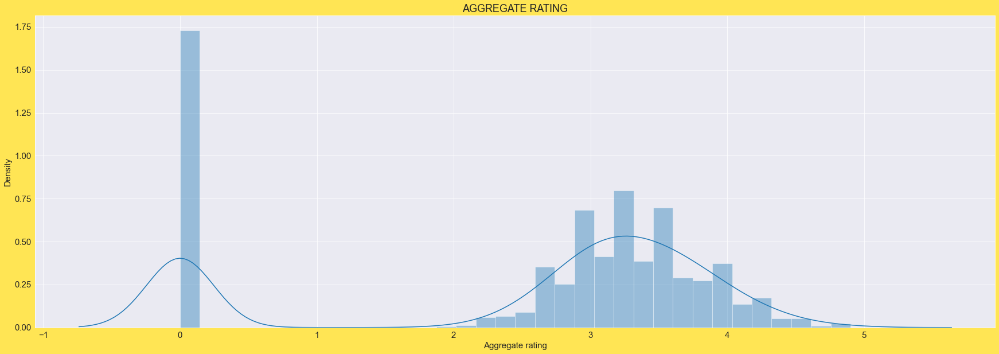

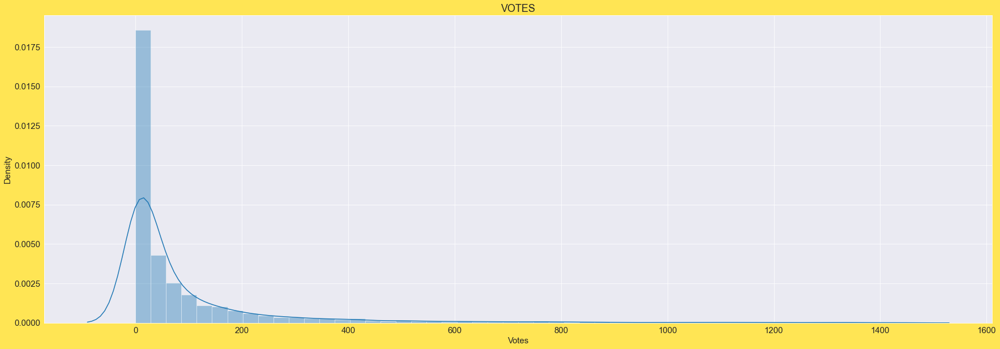

In [232]:
# plotting distplots to see the skewness
for i in conti_cols:
    plt.figure(figsize=(30,10))
    sns.distplot(avg_cost_df[i])
    plt.title(i.upper())
    plt.show()
 # We can see there is high amount of skewenss in the these columns

In [233]:
# using powertransformer method to remove skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')

In [234]:
# fitting the power transformer 
avg_cost_df[conti_cols] = pt.fit_transform(avg_cost_df[conti_cols].values)

In [235]:
# checking skewness of the continuous columns again
avg_cost_df[conti_cols].skew().sort_values(ascending=False)

Country Code        10.279420
Price range          0.238298
Votes               -0.009064
Longitude           -0.320634
Aggregate rating    -0.630149
Latitude            -2.524308
dtype: float64

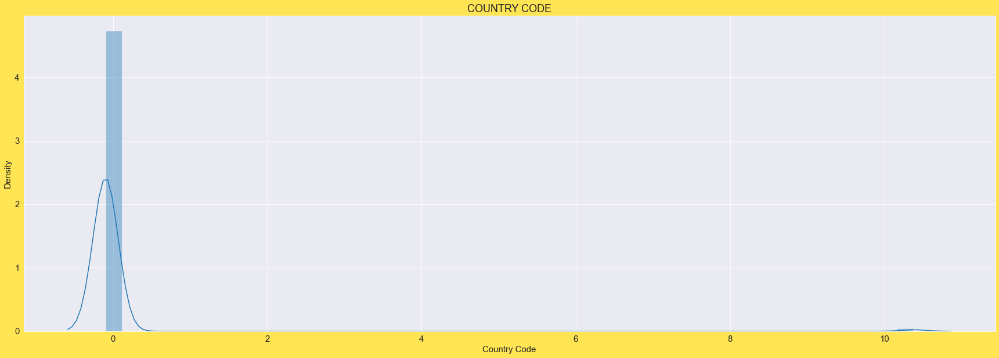

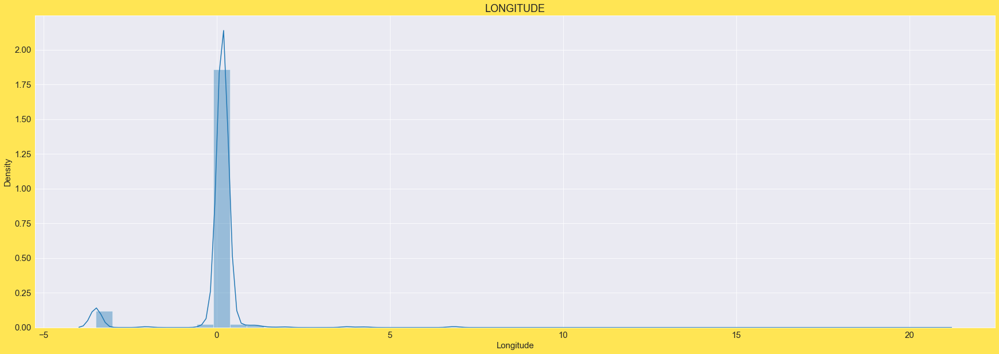

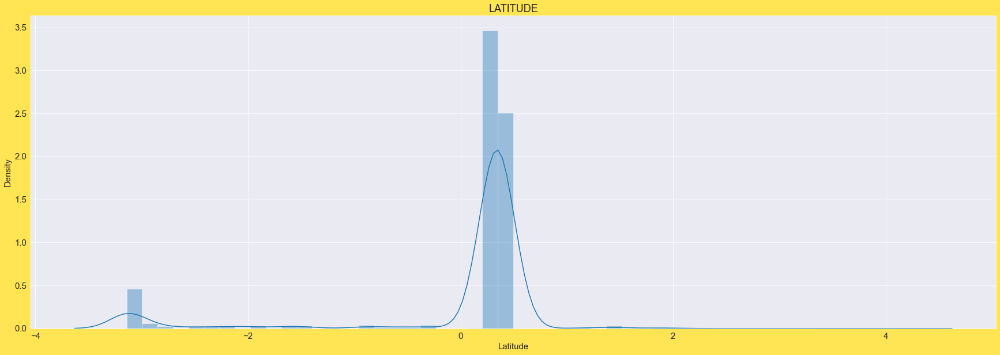

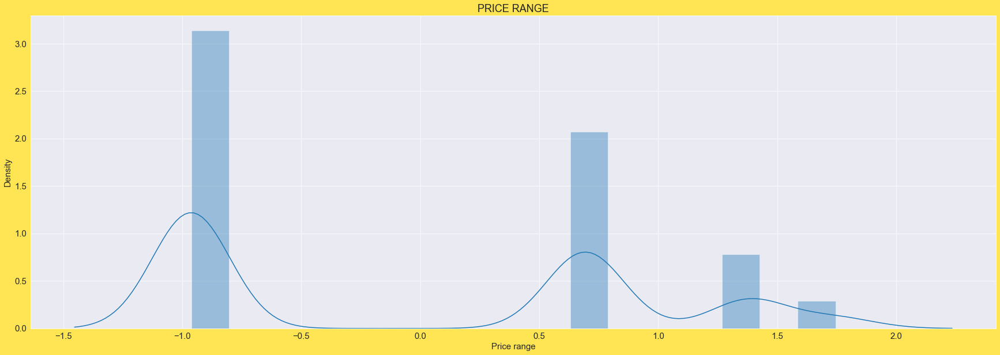

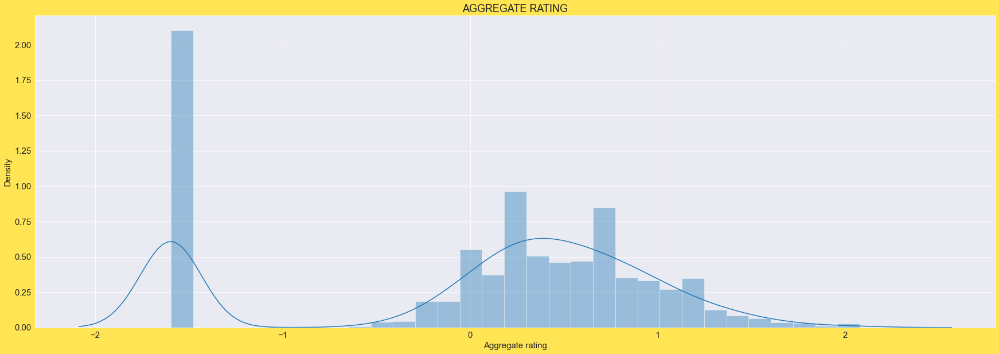

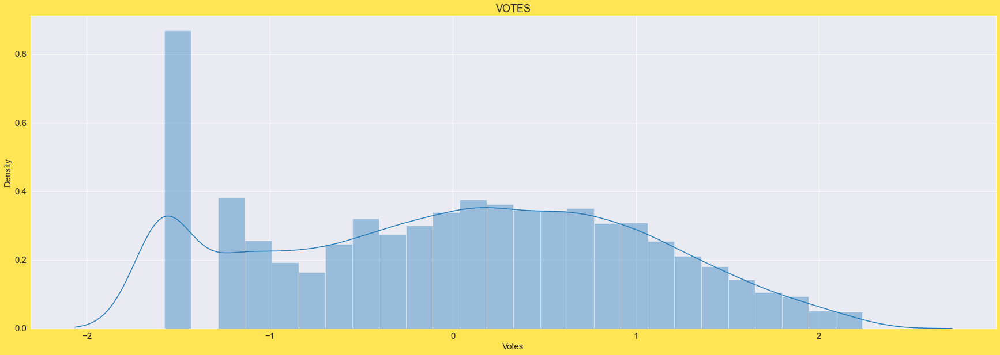

In [236]:
# plotting distplots to see the skewness
for i in conti_cols:
    plt.figure(figsize=(30,10))
    sns.distplot(avg_cost_df[i])
    plt.title(i.upper())
    plt.show()
    
# We can see that the skewness is reduced up to its minmum

## Encoding the categorical variables

In [237]:
# using Label Encoding encoding the categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in cat_cols:
    avg_cost_df[i] = le.fit_transform(avg_cost_df[i])

avg_cost_df.head(10) # checking the first 10 rows

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,3325,10.374018,30,7747,101,102,6.847510,-2.827800,663,1100,0,1,0,0,0,1.382578,1.968643,0,1,1.406296,3
1,2798,10.374018,30,5259,385,393,6.844856,-2.828685,791,1200,0,1,0,0,0,1.382578,1.645483,0,1,1.749111,3
2,2554,10.374018,31,3956,189,195,6.853300,-2.826593,1281,4000,0,1,0,0,0,1.744383,1.540419,1,5,1.325017,3
3,4161,10.374018,31,7752,560,573,6.853230,-2.826297,802,1500,0,0,0,0,0,1.744383,2.078995,0,1,1.487542,3
4,4889,10.374018,31,7751,560,573,6.853434,-2.826363,801,1500,0,1,0,0,0,1.744383,1.968643,0,1,1.236603,3
5,1861,10.374018,31,4655,560,573,6.853198,-2.826415,302,1000,0,0,0,0,0,1.382578,1.540419,1,5,1.442825,3
6,894,10.374018,41,3279,561,574,6.838054,-2.830367,62,2000,0,1,0,0,0,1.744383,1.133645,1,5,1.679438,3
7,6358,10.374018,41,3278,561,574,6.837988,-2.829716,1288,2000,0,1,0,0,0,1.744383,1.334320,1,5,1.823228,3
8,5375,10.374018,41,6121,682,735,6.838137,-2.828739,560,6000,0,1,0,0,0,1.744383,2.078995,0,1,1.776105,3
9,3376,10.374018,42,3263,338,344,6.853241,-2.827302,641,1100,0,1,0,0,0,1.382578,1.968643,0,1,1.691847,3


## Correlation

In [238]:
avg_cost_df.corr().T

,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
Restaurant Name,1.000000,0.014266,0.008115,0.001868,0.007381,0.007317,0.021018,0.004777,0.060544,0.009826,0.005716,0.041304,0.031292,0.013018,NaN,0.064220,0.029518,-0.007612,0.006976,0.039291,0.009571
Country Code,0.014266,1.000000,-0.007163,-0.012291,-0.030490,-0.029502,0.325017,-0.239886,-0.017370,0.372625,0.089340,0.019185,-0.059493,-0.006080,NaN,0.146243,0.117949,-0.082153,0.054642,0.095649,0.921275
City,0.008115,-0.007163,1.000000,-0.096701,-0.027897,-0.032088,0.043267,0.089090,0.014592,-0.040157,-0.142463,-0.000907,-0.015403,-0.023488,NaN,-0.123301,-0.113102,0.070507,-0.058228,-0.100725,0.019232
Address,0.001868,-0.012291,-0.096701,1.000000,0.150242,0.151993,-0.021322,0.015635,-0.016084,0.014823,0.013012,-0.011060,-0.008652,0.029232,NaN,-0.035882,-0.097476,0.055086,0.049306,-0.126780,-0.026790
Locality,0.007381,-0.030490,-0.027897,0.150242,1.000000,0.999028,-0.028808,0.017860,-0.014457,-0.010197,-0.017597,-0.069709,-0.048989,-0.011213,NaN,-0.102082,-0.155074,0.006116,-0.000507,-0.178238,-0.032059
Locality Verbose,0.007317,-0.029502,-0.032088,0.151993,0.999028,1.000000,-0.029541,0.016844,-0.015593,-0.009689,-0.015902,-0.068735,-0.049339,-0.011162,NaN,-0.099380,-0.153835,0.006701,0.001226,-0.176247,-0.031168
Longitude,0.021018,0.325017,0.043267,-0.021322,-0.028808,-0.029541,1.000000,0.552348,0.003749,0.149406,-0.244376,0.075554,0.100140,0.010594,NaN,0.082677,0.181875,-0.110052,-0.067196,0.194237,0.258103
Latitude,0.004777,-0.239886,0.089090,0.015635,0.017860,0.016844,0.552348,1.000000,0.037844,-0.113185,0.047092,0.052300,0.163170,0.022718,NaN,-0.117731,-0.033536,-0.001172,-0.188908,-0.024558,-0.211880
Cuisines,0.060544,-0.017370,0.014592,-0.016084,-0.014457,-0.015593,0.003749,0.037844,1.000000,-0.002251,0.026152,0.039827,-0.039916,0.005148,NaN,0.027413,-0.056146,-0.047743,-0.060822,-0.029642,-0.020644
Average Cost for two,0.009826,0.372625,-0.040157,0.014823,-0.010197,-0.009689,0.149406,-0.113185,-0.002251,1.000000,0.186505,0.012262,-0.019524,-0.001874,NaN,0.078409,0.066908,-0.049277,0.036571,0.073699,0.100105


In [239]:
# We can see drop the swith order menu as it is having only one unique value
avg_cost_df.drop(['Switch to order menu'],axis=1,inplace=True)

<AxesSubplot:>

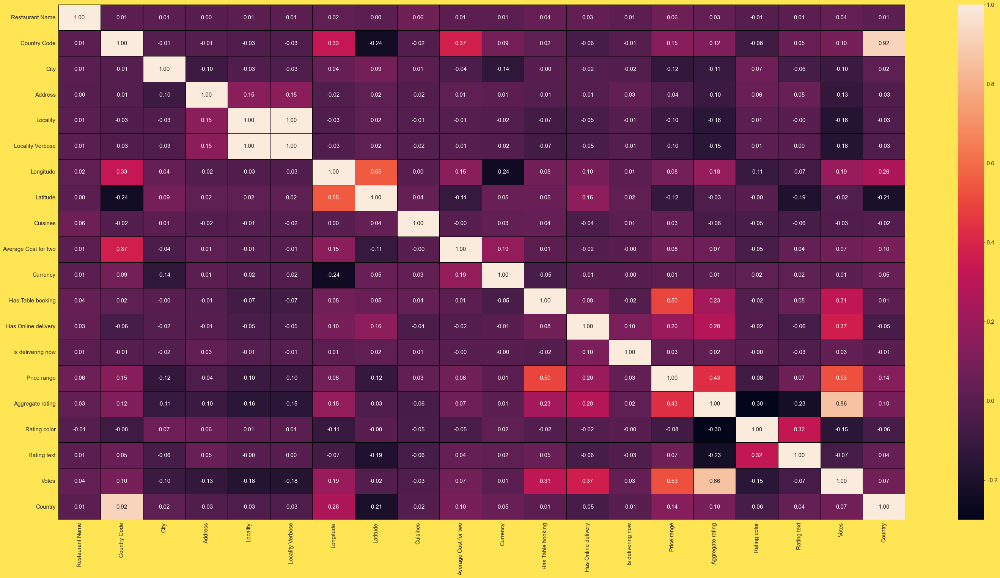

In [240]:
# Now let's plot the heatmap
plt.figure(figsize=(50,25))
sns.heatmap(avg_cost_df.corr(),annot=True,linewidths=0.5,linecolor='black',fmt='.2f')

In [241]:
# looking at the correlation with respect to Average Cost for two
avg_cost_df.corr()['Average Cost for two'].sort_values(ascending=False)

Average Cost for two    1.000000
Country Code            0.372625
Currency                0.186505
Longitude               0.149406
Country                 0.100105
Price range             0.078409
Votes                   0.073699
Aggregate rating        0.066908
Rating text             0.036571
Address                 0.014823
Has Table booking       0.012262
Restaurant Name         0.009826
Is delivering now      -0.001874
Cuisines               -0.002251
Locality Verbose       -0.009689
Locality               -0.010197
Has Online delivery    -0.019524
City                   -0.040157
Rating color           -0.049277
Latitude               -0.113185
Name: Average Cost for two, dtype: float64

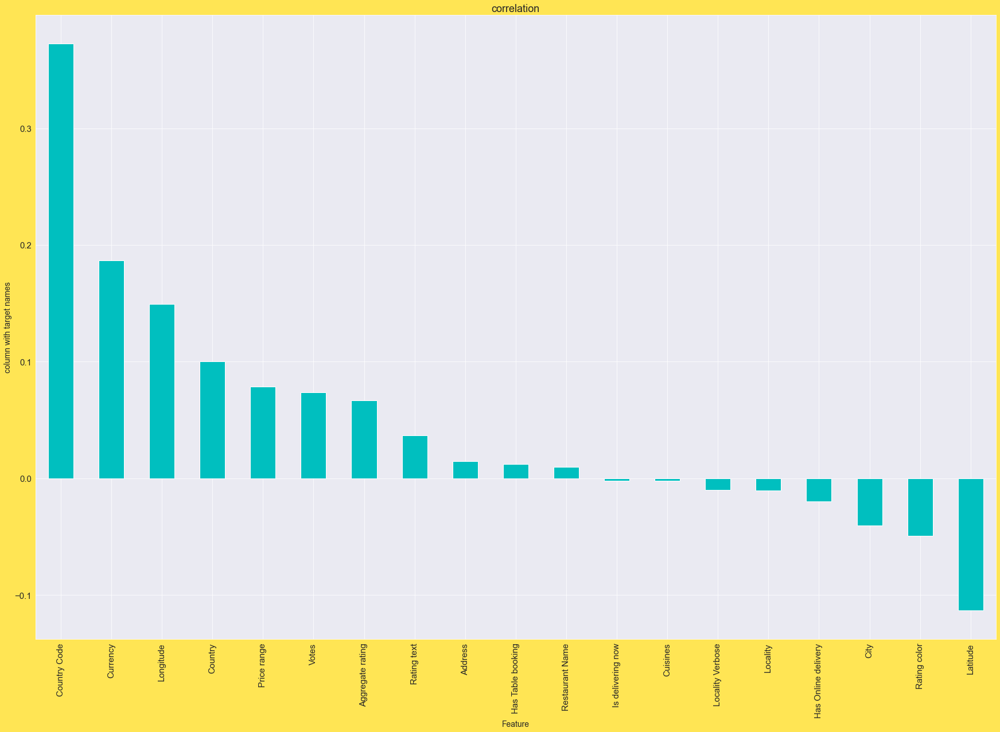

In [242]:
# plotting the same using a barplot
plt.figure(figsize=(30,20))
avg_cost_df.corr()['Average Cost for two'].sort_values(ascending=False).drop(['Average Cost for two']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

Observations:-
 
Latitude has a negative correlation of 11% with the target column(being considered) which can be considered as fair bond

Rating color has a negative correlation of 5% with the target column(being considered) which can be considered as weak bond

City has a negative correlation of 3% with the target column(being considered) which can be considered as weak bond

Has Online delivery has a negative correlation of 2% with the target column(being considered) which can be considered as weak bond

Locality has a negative correlation of 1% with the target column(being considered) which can be considered as weak bond

Locality Verbose has a negative correlation of 1% with the target column(being considered) which can be considered as weak bond

Country has a negative correlation of 0% with the target column(being considered) which can be considered as NO BOND

Is delivering now has a negative correlation of 0% with the target column(being considered) which can be considered as NO BOND

Restaurant ID has a negative correlation of 0% with the target column(being considered) which can be considered as NO BOND

Cuisines has a positive correlation of 0% with the target column(being considered) which can be considered as NO BOND

Has Table booking has a positive correlation of 0% with the target column(being considered) which can be considered as NO BOND

Restaurant Name has a positive correlation of 2% with the target column(being considered) which can be considered as weak bond

Address has a positive correlation of 2% with the target column(being considered) which can be considered as weak bond

Rating text has a positive correlation of 3% with the target column(being considered) which can be considered as weak bond

Country Code has a positive correlation of 4% with the target column(being considered) which can be considered as weak bond

Currency positive correlation of 5% with the target column(being considered) which can be considered as weak bond

Longitude positive correlation of 5% with the target column(being considered) which can be considered as weak bond

Aggregate rating Code positive correlation of 5% with the target column(being considered) which can be considered as weak bond

Votes positive correlation of 7% with the target column(being considered) which can be considered as weak bond

Price range positive correlation of 8% with the target column(being considered) which can be considered as weak bond

Switch to order menu has NO CORRELATION AT ALL

Feature with Maximum correlation = Price range

Features with Minimum correlation = Restaurant ID

In [281]:
avg_cost_df.drop(['Is delivering now','Cuisines'],axis=1,inplace=True)

## Seperating the features(x) and Target(y)

In [282]:
x = avg_cost_df.drop(['Average Cost for two'],axis=1)
y = avg_cost_df['Average Cost for two']

## Scaling the data

In [283]:
# inorder to check the multicollinearity we have to scale the data
# importing StandardScaler
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x = pd.DataFrame(sc.fit_transform(x),columns=x.columns)

## Checking Multicollinearity

In [284]:
# importing vif 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [285]:
def vif_calc():
    vif=pd.DataFrame()
    vif["vif_Features"]=[variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    vif["Features"]=x.columns
    return vif



In [286]:
vif_calc()
# We have got high vif score in Temperature,Pressure and LocationPerthAirport columns
# lets drop the highest vif scores one by one and check if the score is reducoing

,vif_Features,Features
0,1.005567,Restaurant Name
1,9.157244,Country Code
2,1.090052,City
3,1.058219,Address
4,523.424232,Locality
5,523.371841,Locality Verbose
6,3.231990,Longitude
7,2.895958,Latitude
8,1.436347,Currency
9,1.397378,Has Table booking


In [287]:
# We can see that CountryCode, Locality, Locality Verbose and Country column are having high vif score
# And they were highly skewed and least correlated with the target
# So let's drop these columns
x.drop(['Locality','Locality Verbose','Country Code'],axis=1,inplace=True)

In [288]:
# lets check again
vif_calc()

# We can see that multicollinearity is resolved

,vif_Features,Features
0,1.005294,Restaurant Name
1,1.081491,City
2,1.037446,Address
3,2.440634,Longitude
4,2.335319,Latitude
5,1.265727,Currency
6,1.392742,Has Table booking
7,1.230036,Has Online delivery
8,1.765726,Price range
9,4.682087,Aggregate rating


## Model Building

In [289]:
# importing the necessary models,metrics and the methods
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor


from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [290]:
# creating short instances of the models
lr = LinearRegression()

dtr = DecisionTreeRegressor()

knr = KNeighborsRegressor()

svr = SVR()

sgdr = SGDRegressor()

xgbr = XGBRegressor()

rfr = RandomForestRegressor()

abr = AdaBoostRegressor()

In [291]:
# CHECKING THE RANDOM STATE FOR LINEAR REGRESSION
lr = LinearRegression()
for i in range(0,500):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=i)
    lr.fit(x_train,y_train)
    pred_train = lr.predict(x_train)
    pred_test = lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print('At random state',i,'The model performs very well')
        print('At random state:-',i)
        print('Training r2 score is ', round(r2_score(y_train,pred_train)*100,1))
        print('Testing r2 score is ', round(r2_score(y_test,pred_test)*100,1), '\n\n')

At random state 83 The model performs very well
At random state:- 83
Training r2 score is  17.3
Testing r2 score is  17.3 




In [292]:
# selecting 412 as best random state
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30,random_state=83)

In [293]:
lr.fit(x_train,y_train)
pred_lr = lr.predict(x_test)
print('Accuracy Score:-',r2_score(y_test,pred_lr))
print('Mean Squared Error:-',mean_squared_error(y_test,pred_lr))
print('Mean Absolute Error:-',mean_absolute_error(y_test,pred_lr))
print('Root Mean Squared Error',np.sqrt(mean_squared_error(y_test,pred_lr)))


Accuracy Score:- 0.17272716264615173
Mean Squared Error:- 274491413.7015769
Mean Absolute Error:- 2073.6311639928977
Root Mean Squared Error 16567.78240144338


In [294]:
# checking cv score
# checking Cross Validation for linear regression
from sklearn.model_selection import cross_val_score
lrs = r2_score(y_test,pred_lr)
for i in range(5,10):
    lrcscore = cross_val_score(lr,x,y,cv=i)
    print(lrcscore)
    lsc = lrcscore.mean()
    print('At cv:- ',i)
    print('Cross validation score is:- ',lsc*100)
    print('r2_score is:- ',lrs*100)
    print('\n')

[-1.32031335e+06 -1.03168181e+02 -6.87864219e+00 -2.92170717e+00
 -8.62935730e-03]
At cv:-  5
Cross validation score is:-  -26408526.615492515
r2_score is:-  17.272716264615173


[-1.63899953e+06 -2.18415560e+02 -4.97967137e+00 -9.95878485e+00
 -2.55973303e+00 -1.00665052e-02]
At cv:-  6
Cross validation score is:-  -27320590.85031633
r2_score is:-  17.272716264615173


[-1.82290486e+06 -2.18181874e+02 -9.09253950e+00 -8.23468743e+00
 -8.23713842e+00 -2.18016820e+00 -1.13965858e-02]
At cv:-  7
Cross validation score is:-  -26045011.39933457
r2_score is:-  17.272716264615173


[-2.00687334e+06 -2.75180749e+02 -1.36585965e+01 -3.88159447e+00
 -1.01571319e+01 -8.13709195e+00 -1.73030233e+00 -1.26617876e-02]
At cv:-  8
Cross validation score is:-  -25089826.27605978
r2_score is:-  17.272716264615173


[-2.13527359e+06 -2.92887780e+02 -1.93113219e+01 -3.74471173e+00
 -6.31422424e+00 -1.06533424e+01 -6.55494372e+00 -1.89360807e+00
 -1.40428206e-02]
At cv:-  9
Cross validation score is:-  -23

In [296]:
# selecting best cv 9
lrcscore_selected = cross_val_score(lr,x,y,cv=9).mean()
print('The cv score of Linear Regression is ',lrcscore_selected,'\nThe accuracy score of Linear Regression is: ',lrs)

# getting 17% accuracy with linear reg

The cv score of Linear Regression is  -237290.55124607435 
The accuracy score of Linear Regression is:  0.17272716264615173


## DecisionTreeRegressor

In [298]:
# creating parameter grid for dtr
param_grid_dtr = {'criterion':["squared_error", "friedman_mse", "absolute_error","poisson"],
             'splitter':["best", "random"],'max_depth':[2,8,10,None],'max_features':[0.25,0.5,1.0],'min_samples_split':[0.25,0.5,1.0]}

In [299]:
dtr_search = GridSearchCV(dtr,param_grid=param_grid_dtr,error_score='raise')

In [300]:
dtr_search.fit(x_train,y_train)

GridSearchCV(error_score='raise',
             estimator=DecisionTreeRegressor(criterion='absolute_error',
                                             max_depth=8, max_features=1.0,
                                             min_samples_split=0.25),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson'],
                         'max_depth': [2, 8, 10, None],
                         'max_features': [0.25, 0.5, 1.0],
                         'min_samples_split': [0.25, 0.5, 1.0],
                         'splitter': ['best', 'random']})

In [301]:
print(dtr_search.best_score_)
print(dtr_search.best_estimator_)
print(dtr_search.best_params_)

# getting the bestparams

0.7925550526251397
DecisionTreeRegressor(criterion='poisson', max_depth=8, max_features=1.0,
                      min_samples_split=0.25)
{'criterion': 'poisson', 'max_depth': 8, 'max_features': 1.0, 'min_samples_split': 0.25, 'splitter': 'best'}


In [303]:
# Running the model with bestparams
dtr = DecisionTreeRegressor(criterion='poisson',max_depth=8,max_features=1.0,min_samples_split=0.25,splitter='best') # using the best parameters
dtr.fit(x_train,y_train)
pred_dtr_test= dtr.predict(x_test)
pred_dtr_train = dtr.predict(x_train)
print('Training score of dtr',r2_score(pred_dtr_train,y_train))
print('Accuracy Score of dtr',r2_score(pred_dtr_test,y_test))
print('Mean Squared Error of dtr',mean_squared_error(pred_dtr_test,y_test))
print('Mean Absolute Error of dtr',mean_absolute_error(pred_dtr_test,y_test))
print('Root Mean Squared Error of dtr',np.sqrt(mean_squared_error(pred_dtr_test,y_test)))
print('\n')


Training score of dtr 0.7518721162861784
Accuracy Score of dtr 0.24872322521797285
Mean Squared Error of dtr 131123644.61601949
Mean Absolute Error of dtr 560.5010382244599
Root Mean Squared Error of dtr 11450.923308450698




In [305]:
# checking the cv score for dtr
dtra = r2_score(y_test,pred_dtr_test)
for i in range(10,15):
    dtrscore = cross_val_score(dtr,x,y,cv=i)
    print(dtrscore)
    dtrc = dtrscore.mean()
    print('At cv:- ',i)
    print('Cross validation score is:- ',dtrc*100)
    print('r2_score is:- ',dtra*100)
    print('\n') 

[ 0.33211973  0.72286689  0.62700377  0.63924168  0.6633975   0.71451084
  0.77481135  0.47127199  0.77368352 -0.00758833]
At cv:-  10
Cross validation score is:-  57.11318936497054
r2_score is:-  60.481448922987234


[ 0.29353192  0.73432045  0.58714398  0.71460192  0.60853944  0.69062937
  0.72268863  0.76115026  0.4639556   0.78999009 -0.00890179]
At cv:-  11
Cross validation score is:-  57.796817011793344
r2_score is:-  60.481448922987234


[ 0.28216419  0.74236829  0.57546925  0.76387545  0.62388584  0.65728549
  0.75191579  0.73364855  0.76447444  0.46085005  0.78468814 -0.01028322]
At cv:-  12
Cross validation score is:-  59.4195188052857
r2_score is:-  60.481448922987234


[ 0.25947603  0.73514737  0.56261917  0.76531438  0.71392245  0.61137693
  0.65763543  0.71094989  0.76964351  0.65763453  0.46693444  0.78625516
 -0.01165508]
At cv:-  13
Cross validation score is:-  59.117339972808125
r2_score is:-  60.481448922987234


[ 0.17564495  0.70326423  0.67105344  0.65604788  0.72

In [306]:
# selecting best cv = 12
dtrscore_selected = cross_val_score(dtr,x,y,cv=12).mean()
print('The cv score of DecisionTreeRegressor is ',dtrscore_selected,'\nThe accuracy score of DecisionTreeRegressor is: ',dtra)

# 60% from DTR

The cv score of DecisionTreeRegressor is  0.594195188052857 
The accuracy score of DecisionTreeRegressor is:  0.6048144892298724


## KNeighborsRegressor

In [307]:
# paramgrid for KNR
param_grid_knr = {'n_neighbors':[2,3,4,5,6,7,8,9,10],'weights':['uniform','distance'],'algorithm':['auto', 'ball_tree','kd_tree','brute'],'leaf_size':[25,30,35,40]}

In [308]:
knr_search = GridSearchCV(knr,param_grid=param_grid_knr)

In [309]:
knr_search.fit(x_train,y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [25, 30, 35, 40],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'weights': ['uniform', 'distance']})

In [310]:
print(knr_search.best_score_)
print(knr_search.best_estimator_)
print(knr_search.best_params_)

0.6864738517759081
KNeighborsRegressor(leaf_size=25, n_neighbors=3, weights='distance')
{'algorithm': 'auto', 'leaf_size': 25, 'n_neighbors': 3, 'weights': 'distance'}


In [312]:
# running the model with bestparams
knr = KNeighborsRegressor(algorithm='auto',leaf_size=25,n_neighbors=3,weights='distance')# using the best parameters
knr.fit(x_train,y_train)
pred_knr_test= knr.predict(x_test)
pred_knr_train = knr.predict(x_train)
print('Training score of knr',r2_score(pred_knr_train,y_train))
print('Accuracy Score of knr',r2_score(pred_knr_test,y_test))
print('Mean Squared Error of knr',mean_squared_error(pred_knr_test,y_test))
print('Mean Absolute Error of knr',mean_absolute_error(pred_knr_test,y_test))
print('Root Mean Squared Error of knr',np.sqrt(mean_squared_error(pred_knr_test,y_test)))
print('\n')

Training score of knr 1.0
Accuracy Score of knr 0.611223342430733
Mean Squared Error of knr 98578857.11321504
Mean Absolute Error of knr 568.4295837699899
Root Mean Squared Error of knr 9928.688589799513




In [313]:
# checking the Cross Validation score
from sklearn.model_selection import cross_val_score
knra = r2_score(y_test,pred_knr_test)
for i in range(5,10):
    knrscore = cross_val_score(knr,x,y,cv=i)
    print(knrscore)
    knrc = knrscore.mean()
    print('At cv:- ',i)
    print('Cross validation score is:- ',knrc*100)
    print('r2_score is:- ',knra*100)
    print('\n') 

[-6.93941848e+01  5.51614052e-01  6.95462732e-01  5.56043753e-01
 -4.82107314e-03]
At cv:-  5
Cross validation score is:-  -1351.917707224484
r2_score is:-  70.28992283313798


[-8.90434663e+01  4.88872351e-01  6.07110457e-01  7.34154132e-01
  5.54173420e-01 -6.23684408e-03]
At cv:-  6
Cross validation score is:-  -1444.423213091747
r2_score is:-  70.28992283313798


[-9.92699652e+01  5.02482197e-01  6.14877246e-01  7.59185854e-01
  7.26817520e-01  5.86197619e-01 -7.58310293e-03]
At cv:-  7
Cross validation score is:-  -1372.685541206322
r2_score is:-  70.28992283313798


[-1.09440551e+02  5.31186718e-01  5.91964193e-01  6.08733508e-01
  7.48382372e-01  7.08117414e-01  5.75789707e-01 -8.82603404e-03]
At cv:-  8
Cross validation score is:-  -1321.0650451435445
r2_score is:-  70.28992283313798


[-1.16545497e+02  5.47128966e-01  5.98745518e-01  6.22739056e-01
  7.69357299e-01  7.16665106e-01  7.29663603e-01  6.29452436e-01
 -1.02021869e-02]
At cv:-  9
Cross validation score is:-  -1243.7

In [314]:
# selecting best cv 4
knrscore_selected = cross_val_score(knr,x,y,cv=4).mean()
print('The cv score of KNeighborsRegressor is ',knrscore_selected,'\nThe accuracy score of KNeighborsRegressor is: ',knra)

# 70% accuracy

The cv score of KNeighborsRegressor is  -14.518485733585637 
The accuracy score of KNeighborsRegressor is:  0.7028992283313797


## SuportVectorRegressor

In [315]:
# creating parametrs for svr
param_grid_svr = {'kernel':['linear', 'poly', 'rbf'],'degree':[4,5,6],'gamma':['scale','auto'],'coef0':[0.3,0.4,0.5]}

In [316]:
svr_search = GridSearchCV(svr,param_grid=param_grid_svr)

In [317]:
svr_search.fit(x_train,y_train)

GridSearchCV(estimator=SVR(),
             param_grid={'coef0': [0.3, 0.4, 0.5], 'degree': [4, 5, 6],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf']})

In [318]:
print(svr_search.best_score_)
print(svr_search.best_estimator_)
print(svr_search.best_params_)
# getting the best params 

0.0009290695224569712
SVR(coef0=0.3, degree=4, kernel='linear')
{'coef0': 0.3, 'degree': 4, 'gamma': 'scale', 'kernel': 'linear'}


In [212]:
# using the best params
svr = SVR(coef0=0.5,degree=6,gamma='auto',kernel='poly')
svr.fit(x_train,y_train)
pred_svr_test= svr.predict(x_test)
pred_svr_train = svr.predict(x_train)
print('Training score of svr',r2_score(pred_svr_train,y_train))
print('Accuracy Score of svr',r2_score(pred_svr_test,y_test))
print('Mean Squared Error of svr',mean_squared_error(pred_svr_test,y_test))
print('Mean Absolute Error of svr',mean_absolute_error(pred_svr_test,y_test))
print('Root Mean Squared Error of svr',np.sqrt(mean_squared_error(pred_svr_test,y_test)))
print('\n')

Training score of svr -657.3635031270384
Accuracy Score of svr -317.3247369103284
Mean Squared Error of svr 67815655.68559042
Mean Absolute Error of svr 481.04493388086615
Root Mean Squared Error of svr 8235.026149660389




## SGDRegressor

In [328]:
# paramgrid for sgdr
paramgrid_sgdr = {'loss':['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],'penalty':['l2', 'l1', 'elasticnet'],
                 'alpha':[0.01,0.001,0.0001,1,10],'l1_ratio':[0.15,0.30,0.45,0.75,1.0]}

In [326]:
sgdr_search = GridSearchCV(sgdr,param_grid=paramgrid_sgdr)

In [323]:
# using the best params
sgdr = SGDRegressor(alpha=0.001,l1_ratio=0.45, loss='squared_error',penalty='l1',fit_intercept=True,max_iter=1300)
sgdr.fit(x_train,y_train)
pred_sgdr_test= sgdr.predict(x_test)
pred_sgdr_train = sgdr.predict(x_train)
print('Training score of sgdr',r2_score(pred_sgdr_train,y_train))
print('Accuracy Score of sgdr',r2_score(pred_sgdr_test,y_test))
print('Mean Squared Error of sgdr',mean_squared_error(pred_sgdr_test,y_test))
print('Mean Absolute Error of sgdr',mean_absolute_error(pred_sgdr_test,y_test))
print('Root Mean Squared Error of sgdr',np.sqrt(mean_squared_error(pred_sgdr_test,y_test)))
print('\n')

Training score of sgdr -6.823280342273483
Accuracy Score of sgdr -19.212986977641542
Mean Squared Error of sgdr 287792784.1614526
Mean Absolute Error of sgdr 2245.3207720521564
Root Mean Squared Error of sgdr 16964.45649472604




In [324]:
# checking cv score
from sklearn.model_selection import cross_val_score
sgdra = r2_score(y_test,pred_sgdr_test)
for i in range(5,10):
    sgdrscore = cross_val_score(sgdr,x,y,cv=i)
    print(sgdrscore)
    sgdrc = sgdrscore.mean()
    print('At cv:- ',i)
    print('Cross validation score is:- ',sgdrc*100)
    print('r2_score is:- ',sgdra*100)
    print('\n') 

[-5.07364634e+03 -1.17903305e+02 -1.36466853e+01 -6.74216555e+00
 -8.63527571e-03]
At cv:-  5
Cross validation score is:-  -104238.94270011192
r2_score is:-  13.263897798257151


[-4.08787687e+03 -1.99412828e+02 -5.05532632e+00 -4.78982101e+00
 -3.72036067e+00 -1.03029689e-02]
At cv:-  6
Cross validation score is:-  -71681.09181902013
r2_score is:-  13.263897798257151


[-1.08979344e+04 -2.71161451e+02 -1.75286293e+01 -1.12987449e+01
 -1.35262861e+01 -1.94670637e+00 -1.14960743e-02]
At cv:-  7
Cross validation score is:-  -160191.53826154093
r2_score is:-  13.263897798257151


[-1.93028196e+04 -2.66976186e+02 -1.55376506e+01 -6.46971358e+00
 -2.78031327e+01 -9.69090759e+00 -1.92511231e+00 -1.28634454e-02]
At cv:-  8
Cross validation score is:-  -245390.4401558414
r2_score is:-  13.263897798257151


[-3.74179518e+03 -2.73754902e+02 -2.38600372e+01 -8.47107837e+00
 -7.14275421e+00 -2.42716273e+01 -1.11950142e+01 -1.53015365e+00
 -1.42500457e-02]
At cv:-  9
Cross validation score is:-  -4

In [325]:
# selecting best cv 7
sgdrscore_selected = cross_val_score(sgdr,x,y,cv=7).mean()
print('The cv score of SGDRegressor is ',sgdrscore_selected,'\nThe accuracy score of SGDRegressor is: ',sgdra)


The cv score of SGDRegressor is  -1404.3528095404436 
The accuracy score of SGDRegressor is:  0.13263897798257152


# Ensemble Methods

## RandomForestRegressor

In [329]:
#  paramgrid for RFR
param_grid_rfr = {'n_estimators':[x for x in range(100,150,10)],'criterion':["squared_error","absolute_error","poisson"],'min_samples_split':[2,4,6,7,0.18],
                 'max_features':["sqrt","log2",None],'bootstrap':[True,False],'min_samples_leaf':[1,3,4,0.18]}

In [330]:
rfr_search = GridSearchCV(rfr,param_grid=param_grid_rfr)

In [332]:
# running the model with best params
rfr = RandomForestRegressor(n_estimators=100,max_features=None,min_samples_leaf=2,min_samples_split=4,bootstrap=True,criterion='squared_error')
rfr.fit(x_train,y_train)
pred_rfr_test= rfr.predict(x_test)
pred_rfr_train = rfr.predict(x_train)
print('Training score of rfr',r2_score(pred_rfr_train,y_train))
print('Accuracy Score of rfr',r2_score(pred_rfr_test,y_test))
print('Mean Squared Error of rfr',mean_squared_error(pred_rfr_test,y_test))
print('Mean Absolute Error of rfr',mean_absolute_error(pred_rfr_test,y_test))
print('Root Mean Squared Error of rfr',np.sqrt(mean_squared_error(pred_rfr_test,y_test)))
print('\n')


Training score of rfr 0.9135626875504476
Accuracy Score of rfr 0.29681465480170377
Mean Squared Error of rfr 147028784.36354724
Mean Absolute Error of rfr 554.0793179170345
Root Mean Squared Error of rfr 12125.5426420242




In [335]:
# selecting best cv 5
rfrscore_selected = cross_val_score(rfr,x,y,cv=5).mean()
print('The cv score of RandomForestRegressor is ',rfrscore_selected,'\nThe accuracy score of RandomForestRegressor is: ',rfra)

# 55% accuracy

The cv score of RandomForestRegressor is  -43.965793316475 
The accuracy score of RandomForestRegressor is:  0.5568789639979179


## AdaBoostRegressor

In [336]:
# creating parametergrid for AdaBoostR
param_grid_abr = {'loss':['linear', 'square', 'exponential'],'n_estimators':[50,60,80],'learning_rate':[0.5,1.5]}

In [337]:
abr_search = GridSearchCV(abr,param_grid=param_grid_abr)

In [338]:
abr_search.fit(x_train,y_train)

GridSearchCV(estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.5, 1.5],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [50, 60, 80]})

In [339]:
print(abr_search.best_score_)
print(abr_search.best_estimator_)
print(abr_search.best_params_)

# getting the best params

0.8417009725112472
AdaBoostRegressor(learning_rate=1.5, loss='square', n_estimators=80)
{'learning_rate': 1.5, 'loss': 'square', 'n_estimators': 80}


In [340]:
# using the best params
abr = AdaBoostRegressor(learning_rate=0.5,loss='square',n_estimators=50)
abr.fit(x_train,y_train)
pred_abr_test= abr.predict(x_test)
pred_abr_train = abr.predict(x_train)
print('Training score of abr',r2_score(pred_abr_train,y_train))
print('Accuracy Score of abr',r2_score(pred_abr_test,y_test))
print('Mean Squared Error of abr',mean_squared_error(pred_abr_test,y_test))
print('Mean Absolute Error of abr',mean_absolute_error(pred_abr_test,y_test))
print('Root Mean Squared Error of abr',np.sqrt(mean_squared_error(pred_abr_test,y_test)))
print('\n')

Training score of abr 0.9946913365376351
Accuracy Score of abr 0.27945816802675727
Mean Squared Error of abr 135775480.04227552
Mean Absolute Error of abr 687.7679702093922
Root Mean Squared Error of abr 11652.273599700426




In [341]:
# checking cv score
from sklearn.model_selection import cross_val_score
abra = r2_score(y_test,pred_abr_test)
for i in range(5,10):
    abrscore = cross_val_score(abr,x,y,cv=i)
    print(abrscore)
    abrc = abrscore.mean()
    print('At cv:- ',i)
    print('Cross validation score is:- ',abrc*100)
    print('r2_score is:- ',abra*100)
    print('\n') 

[-3.51504110e+02  6.37373338e-01  6.29366912e-01  5.01004814e-01
 -3.59062129e-03]
At cv:-  5
Cross validation score is:-  -6994.799113471919
r2_score is:-  59.07946077330841


[-4.20279504e+01  6.96196859e-01  6.51669888e-01  6.28664415e-01
  4.89561957e-01 -4.98088411e-03]
At cv:-  6
Cross validation score is:-  -659.4473027311667
r2_score is:-  59.07946077330841


[-2.70539300e+02  6.61442003e-01  6.18686374e-01  6.66598045e-01
  6.77633609e-01  4.88268041e-01 -6.27588603e-03]
At cv:-  7
Cross validation score is:-  -3820.470684222744
r2_score is:-  59.07946077330841


[-3.63000641e+02  6.82502154e-01  7.09716532e-01  5.86698024e-01
  6.31115475e-01  7.32473750e-01  4.60143009e-01 -7.34239290e-03]
At cv:-  8
Cross validation score is:-  -4490.066676340846
r2_score is:-  59.07946077330841


[-4.12060932e+02  7.84121983e-01  7.43586058e-01  6.07504859e-01
  6.84891767e-01  6.16532613e-01  6.48120688e-01  4.73432978e-01
 -8.98972631e-03]
At cv:-  9
Cross validation score is:-  -4527.90

In [342]:
# selecting best cv 6
abrscore_selected = cross_val_score(abr,x,y,cv=5).mean()
print('The cv score of AdaBoostRegressor is ',abrscore_selected,'\nThe accuracy score of AdaBoostRegressor is: ',abra)


The cv score of AdaBoostRegressor is  -33.671048272737785 
The accuracy score of AdaBoostRegressor is:  0.5907946077330841


## Model Selection

In [356]:
models = pd.DataFrame({'Model Name':['Linear Regression','DecisionTreeRegressor','RandomForestRegressor','AdaBoostRegressor','KNeighborsRegressor','SGDRegressor'],
                       'Accuracy':[lrs,dtra,rfra,abra,knra,sgdra],
                       'CV_Score':[lrcscore_selected,dtrscore_selected,rfrscore_selected,abrscore_selected,knrscore_selected,sgdrscore_selected]})
models

# DecisonTree Regressor is haveing higher score of 55% and optimal cvscore as well
# So we will select DecisionTreeRegresssor

,Model Name,Accuracy,CV_Score
0,Linear Regression,0.172727,-237290.551246
1,DecisionTreeRegressor,0.604814,0.594195
2,RandomForestRegressor,0.556879,-43.965793
3,AdaBoostRegressor,0.590795,-33.671048
4,KNeighborsRegressor,0.702899,-14.518486
5,SGDRegressor,0.132639,-1404.352810


## SAVING THE MODEL

In [357]:
import pickle
filename='avg_cost.pred'
pickle.dump(dtr,open(filename,'wb'))

In [358]:
import numpy as np
a = np.array(y_test)
predicted = np.array(dtr.predict(x_test))
df_com = pd.DataFrame({'Original':a,'Predicted':predicted},index = range(len(a)))
df_com.sample(20)
# comparison of predicted and original value

,Original,Predicted
174,800,1665.763052
50,500,616.079027
2412,1100,1665.763052
748,2500,1665.763052
1691,500,616.079027
664,450,282.188889
2155,550,616.079027
1902,150,315.143403
2300,850,802.976190
536,1300,1665.763052
